# Srilanka Dengue Outbreak Forecasting using Darts

## Environment Setup

In [24]:
!pip install darts
!pip install dask[dataframe]
!pip install statsmodels

In [25]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## 1. Imports

In [26]:
import os
import pickle
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

from darts import TimeSeries

%matplotlib inline

## 2. Load Dataset

In [27]:
df = pd.read_csv("/content/drive/MyDrive/Datasets/Copy of Sri_lanka_dengue_cases_weather_weekly_2007_2024_.csv")

In [28]:
df.head()

,Unnamed: 0,District,Number_of_Cases,Week_Start_Date,Month,Year,Week,Week_End_Date,Avg Max Temp (°C),Avg Min Temp (°C),Avg Apparent Max Temp (°C),Avg Apparent Min Temp (°C),Total Precipitation (mm),Total Rain (mm),Avg Wind Speed (km/h),Max Wind Gusts (km/h),Weather Code,Avg Daylight Duration (hours),Avg Sunrise Time,Avg Sunset Time
0,0,Ampara,0,2007-01-01,1,2007,1,2007-01-08,26.9375,21.8625,28.8500,24.1000,8.0,8.0,18.2000,44.3,3,11.714583,376,1079
1,1,Ampara,0,2007-01-08,1,2007,2,2007-01-15,26.3500,23.3250,30.2625,26.7000,86.1,86.1,17.0250,43.6,53,11.733333,378,1082
2,2,Ampara,0,2007-01-15,1,2007,3,2007-01-22,27.2125,23.1625,29.5750,25.9625,3.1,3.1,20.1875,48.2,51,11.754167,380,1085
3,3,Ampara,0,2007-01-22,1,2007,4,2007-01-29,26.7250,23.0375,29.9500,26.1125,53.6,53.6,17.2000,42.5,61,11.783333,381,1088
4,4,Ampara,0,2007-01-29,1,2007,5,2007-02-05,27.3625,22.9625,30.7500,26.1250,8.2,8.2,17.2625,40.0,51,11.812500,382,1090


In [29]:
df = df.drop(columns = ["Unnamed: 0"])

In [30]:
len(df)

22900

In [31]:
districts = df['District'].unique()
districts

array(['Ampara', 'Anuradhapura', 'Badulla', 'Batticaloa', 'Colombo',
       'Galle', 'Gampaha', 'Hambantota', 'Jaffna', 'Kalutara', 'Kandy',
       'Kegalle', 'Kilinochchi', 'Kurunegala', 'Mannar', 'Matale',
       'Matara', 'Monaragala', 'Mullaitivu', 'NuwaraEliya', 'Polonnaruwa',
       'Puttalam', 'Ratnapura', 'Trincomalee', 'Vavuniya'], dtype=object)

## 3. Small Visualization

In [32]:
# Check Duplicate values
duplicates = df[['District', 'Week_Start_Date', 'Week_End_Date']].duplicated().any()
if duplicates:
    print("There are duplicate values.")
else:
    print("No duplicates found.")

No duplicates found.


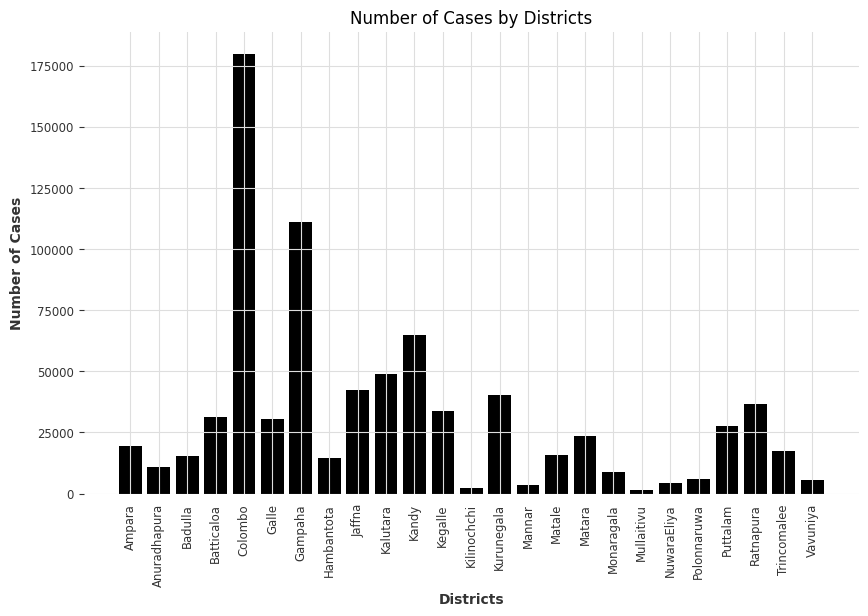

In [33]:
# Group by District and sum the Number of Cases
district_cases = df.groupby('District')['Number_of_Cases'].sum().reset_index()

# Plotting the histogram
plt.figure(figsize=(10, 6))
plt.bar(district_cases['District'], district_cases['Number_of_Cases'])
plt.xlabel('Districts')
plt.ylabel('Number of Cases')
plt.title('Number of Cases by Districts')
plt.xticks(rotation=90)
plt.show()


## 4. Minor pre-processing
1. Only taking single timestamp for each row. Either `Week_Start_Date` or `Week_Start_Date`. We gonna take `Week_End_Date`.
2. Convert the `Week_End_Date` to Python Datetime format.
3. Eliminate un-used features such as `Week_Start_Date`, `Month`, `Year`, and `Week`

In [34]:
df['Week_End_Date'] = pd.to_datetime(df['Week_End_Date'])

In [35]:
df.head()

,District,Number_of_Cases,Week_Start_Date,Month,Year,Week,Week_End_Date,Avg Max Temp (°C),Avg Min Temp (°C),Avg Apparent Max Temp (°C),Avg Apparent Min Temp (°C),Total Precipitation (mm),Total Rain (mm),Avg Wind Speed (km/h),Max Wind Gusts (km/h),Weather Code,Avg Daylight Duration (hours),Avg Sunrise Time,Avg Sunset Time
0,Ampara,0,2007-01-01,1,2007,1,2007-01-08,26.9375,21.8625,28.8500,24.1000,8.0,8.0,18.2000,44.3,3,11.714583,376,1079
1,Ampara,0,2007-01-08,1,2007,2,2007-01-15,26.3500,23.3250,30.2625,26.7000,86.1,86.1,17.0250,43.6,53,11.733333,378,1082
2,Ampara,0,2007-01-15,1,2007,3,2007-01-22,27.2125,23.1625,29.5750,25.9625,3.1,3.1,20.1875,48.2,51,11.754167,380,1085
3,Ampara,0,2007-01-22,1,2007,4,2007-01-29,26.7250,23.0375,29.9500,26.1125,53.6,53.6,17.2000,42.5,61,11.783333,381,1088
4,Ampara,0,2007-01-29,1,2007,5,2007-02-05,27.3625,22.9625,30.7500,26.1250,8.2,8.2,17.2625,40.0,51,11.812500,382,1090


** The trend of cases of all 25 districts

In [36]:
import plotly.express as px

# List of all districts
districts = df['District'].unique()

for district in districts:
    # Filter data for the current district
    df_district = df[df['District'] == district]

    # Create an interactive line plot using Plotly without markers
    fig = px.line(
        df_district,
        x="Week_End_Date",
        y="Number_of_Cases",
        title=f"Number of Cases Over Time - {district}",
        labels={'Week_End_Date': 'Week End Date', 'Number_of_Cases': 'Number of Cases'}
    )

    # Customize the layout for a bigger and clearer plot
    fig.update_layout(
        width=1000,  # Width of the figure
        height=600,  # Height of the figure
        title_font_size=18,
        xaxis_title_font_size=14,
        yaxis_title_font_size=14,
        hovermode="x"  # Show hover data for the x-axis
    )

    # Show the interactive plot with zoom and pan features
    fig.show()


/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



## 5. Modelling
List of classical/statistical models.
- ARIMA
- AutoARIMA
- VARIMA
- ExponentialSmoothing
- FourTheta
- Prophet
- FFT
- KalmanForecaster

In [37]:
from darts.models import ARIMA, AutoARIMA, VARIMA, ExponentialSmoothing, FourTheta, Prophet, FFT, KalmanForecaster
from darts.metrics import rmse, mae, smape, r2_score, rmsle
import plotly.graph_objects as go

In [38]:
models = [ARIMA(p=12, d=1, q=0), AutoARIMA(), ExponentialSmoothing(), Prophet(), FFT(), KalmanForecaster()]

In [39]:
def save_model(model, model_name, district_name, folder='saved_models'):
    # Create directory if it doesn't exist
    os.makedirs(folder, exist_ok=True)

    # Define the model file path
    model_file = os.path.join(folder, f'{district_name}_{model_name}.pkl')

    # Save the model using pickle
    with open(model_file, 'wb') as f:
        pickle.dump(model, f)
    print(f"Model saved for {district_name}: {model_file}")

In [40]:
def train_and_forecast(train_series, val_series, model, district_name):
    model.fit(train_series)

    model_folder = f"/content/drive/MyDrive/Models/{district_name}"
    # Save Model
    save_model(model, type(model).__name__, model_folder)

    # Forecast for the next 12 weeks
    forecast = model.predict(n=len(val_series))

    # Plot the results
    plt.figure(figsize=(12, 6))
    train_series.plot(label='Historical Data')
    val_series.plot(label='Validation Data', color='orange')
    forecast.plot(label='Forecast', color='green')
    plt.legend()
    plt.title(f"Forecast vs Validation for {district_name}")
    plt.show()

    # Calculate metrics
    val_values = val_series.values()
    forecast_values = forecast.values()

    # Ensure the forecast and validation values are the same length
    assert len(val_values) == len(forecast_values), "Forecast and validation series must have the same length for metrics calculation."

    # Compute metrics
    error_rmse = rmse(val_series, forecast)
    error_mae = mae(val_series, forecast)
    error_smape = smape(val_series, forecast)
    error_r2 = r2_score(val_series, forecast)
    error_rmsle = rmsle(val_series, forecast)

    errors = {
        "RMSE": error_rmse,
        "MAE": error_mae,
        "SMAPE": error_smape,
        "R2": error_r2,
        "RMSLE": error_rmsle
    }
    results = [forecast, errors]
    return results

In [41]:
def main(data, models):
    districts = data['District'].unique()
    final_output = []
    for district in districts:
      # Filter data for the specified district
      district_data = data[data['District'] == district]

      # Ensure the 'Week_End_Date' column is in datetime format
      district_data['Week_End_Date'] = pd.to_datetime(district_data['Week_End_Date'])

      # Prepare the data for ARIMA
      series = TimeSeries.from_dataframe(district_data, time_col='Week_End_Date', value_cols=['Number_of_Cases'])

      # Split series
      # Set aside the last 12 weeks as a validation series
      train_data, val_data = series[:-12], series[-12:]

      print(f"Training length: {len(train_data)}")
      print(f"Validation length: {len(val_data)}")
      district_output = []
      for m in models:
        result = train_and_forecast(train_data, val_data, m, district)
        district_output.append(result)

      final_output.append(district_output)

    return final_output


<ipython-input-41-47d63baebb5c>:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Training length: 904
Validation length: 12
Model saved for /content/drive/MyDrive/Models/Ampara: /content/drive/MyDrive/Models/Ampara_ARIMA.pkl


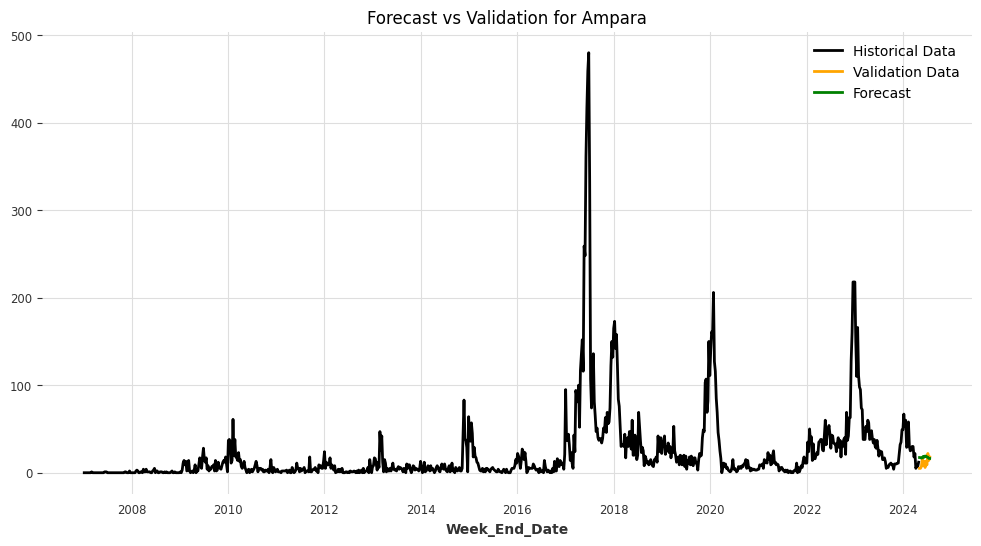

Model saved for /content/drive/MyDrive/Models/Ampara: /content/drive/MyDrive/Models/Ampara_AutoARIMA.pkl


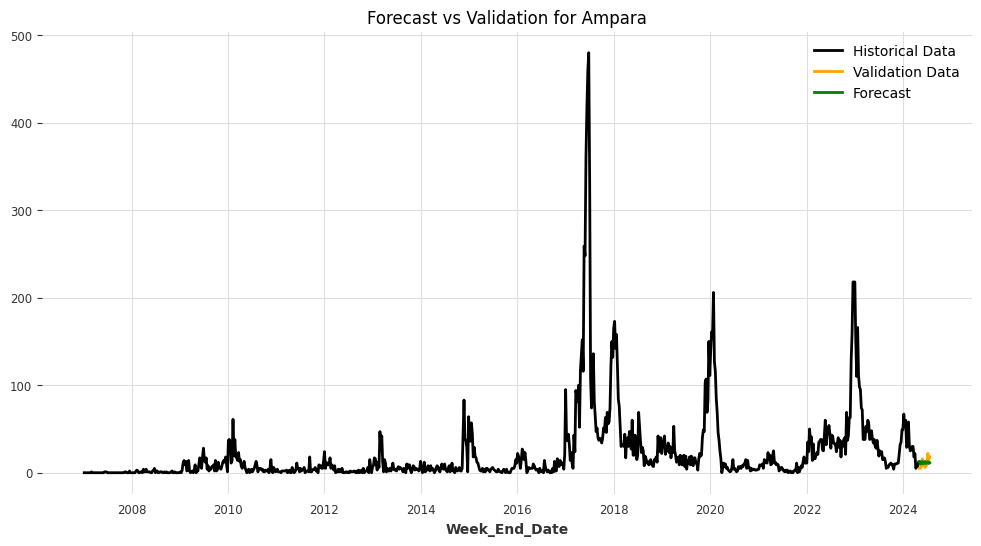

Model saved for /content/drive/MyDrive/Models/Ampara: /content/drive/MyDrive/Models/Ampara_ExponentialSmoothing.pkl


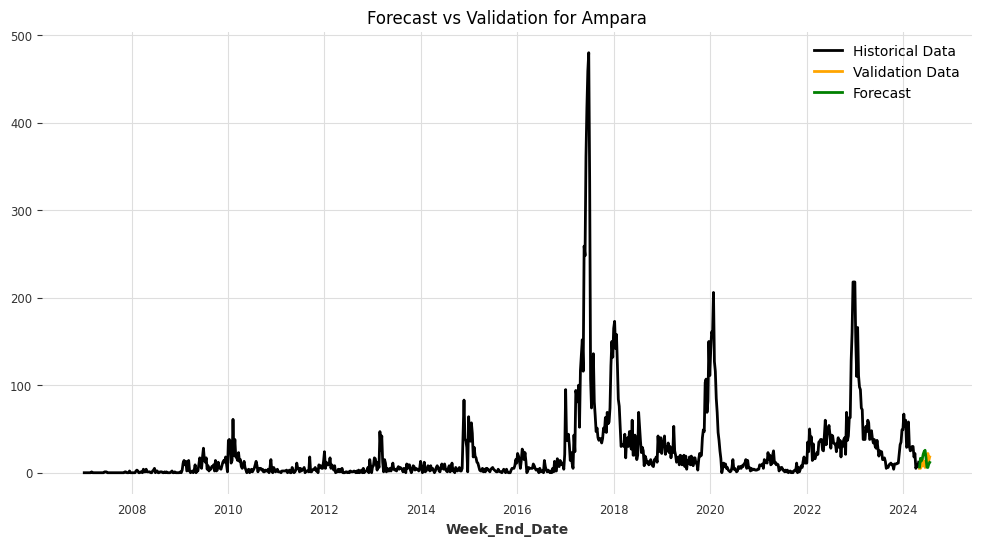

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpokfq9thx/5afsaqom.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpokfq9thx/ohrafcd4.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=94536', 'data', 'file=/tmp/tmpokfq9thx/5afsaqom.json', 'init=/tmp/tmpokfq9thx/ohrafcd4.json', 'output', 'file=/tmp/tmpokfq9thx/prophet_modelmyr6dhc7/prophet_model-20240906025222.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
02:52:22 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
02:52:22 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Model saved for /content/drive/MyDrive/Models/Ampara: /content/drive/MyDrive/Models/Ampara_Prophet.pkl


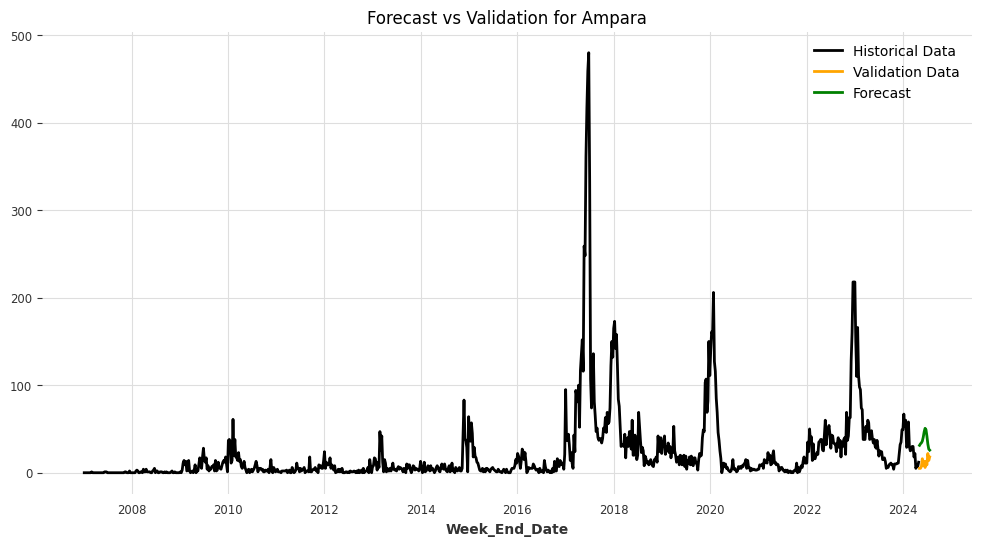

Model saved for /content/drive/MyDrive/Models/Ampara: /content/drive/MyDrive/Models/Ampara_FFT.pkl


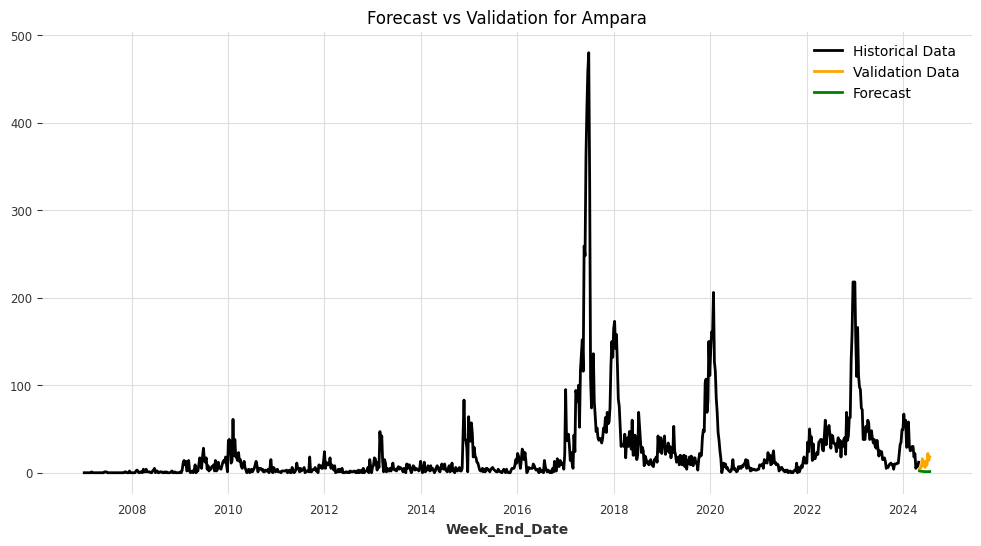

Model saved for /content/drive/MyDrive/Models/Ampara: /content/drive/MyDrive/Models/Ampara_KalmanForecaster.pkl


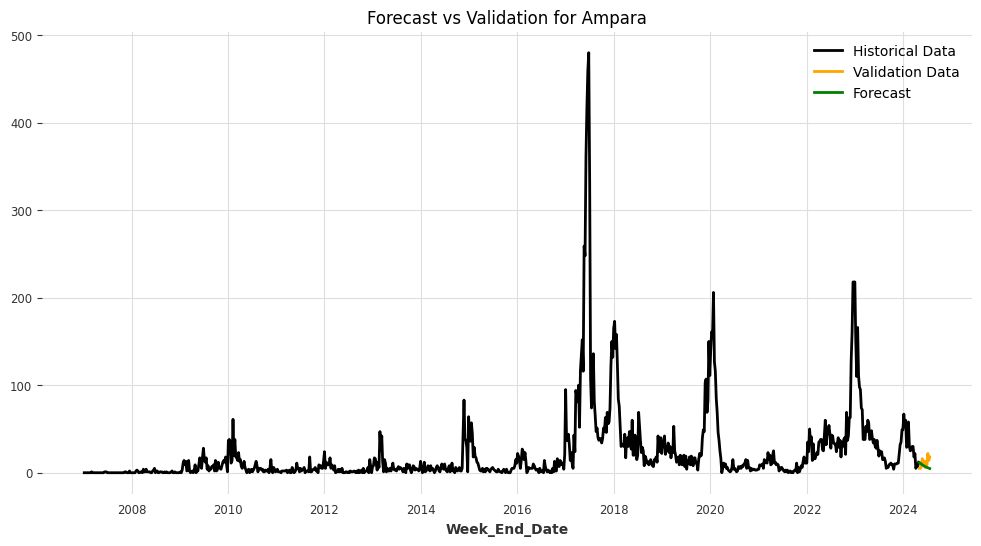

<ipython-input-41-47d63baebb5c>:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Training length: 904
Validation length: 12
Model saved for /content/drive/MyDrive/Models/Anuradhapura: /content/drive/MyDrive/Models/Anuradhapura_ARIMA.pkl


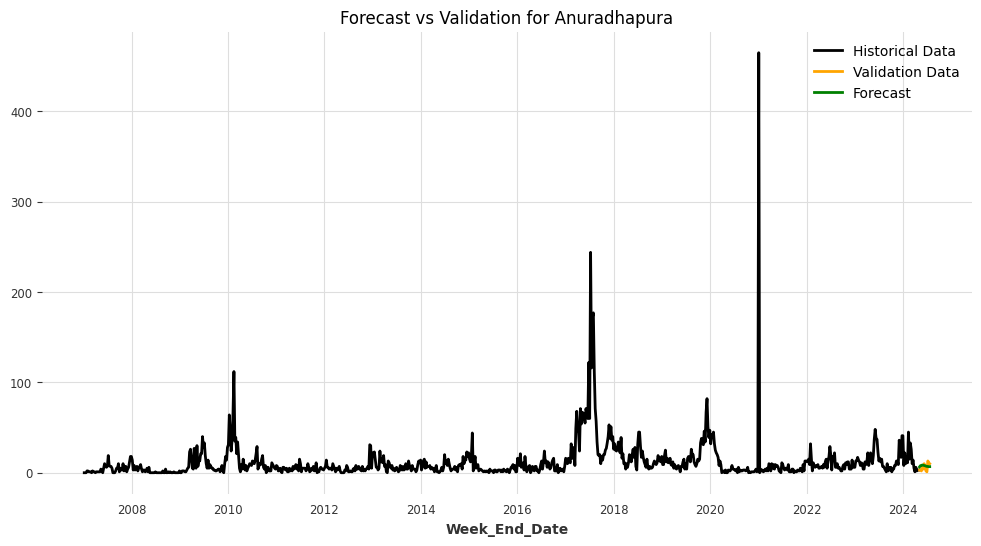

Model saved for /content/drive/MyDrive/Models/Anuradhapura: /content/drive/MyDrive/Models/Anuradhapura_AutoARIMA.pkl


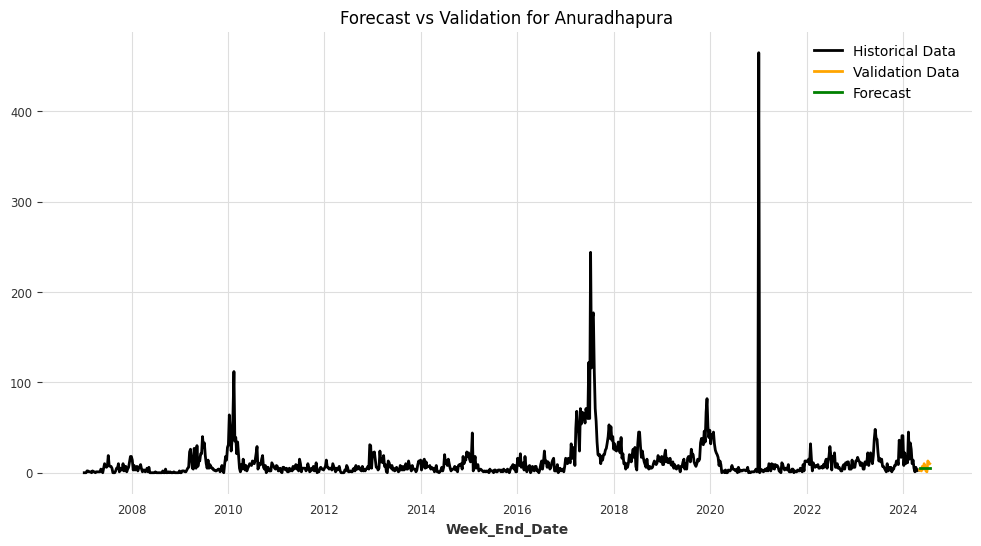

Model saved for /content/drive/MyDrive/Models/Anuradhapura: /content/drive/MyDrive/Models/Anuradhapura_ExponentialSmoothing.pkl


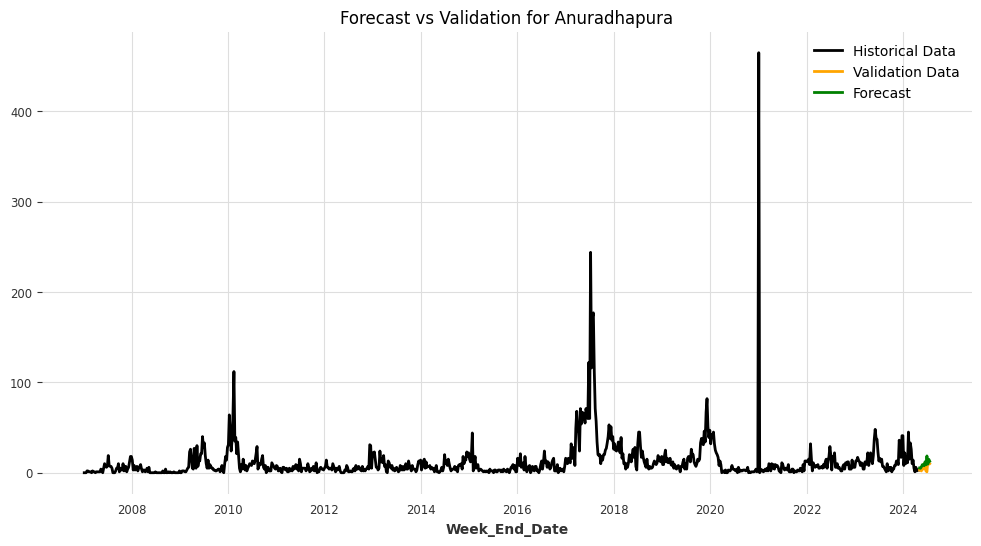

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpokfq9thx/82tr3s1a.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpokfq9thx/ie8ilozs.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=76061', 'data', 'file=/tmp/tmpokfq9thx/82tr3s1a.json', 'init=/tmp/tmpokfq9thx/ie8ilozs.json', 'output', 'file=/tmp/tmpokfq9thx/prophet_modelhaj1ffzz/prophet_model-20240906025235.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
02:52:35 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
02:52:35 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Model saved for /content/drive/MyDrive/Models/Anuradhapura: /content/drive/MyDrive/Models/Anuradhapura_Prophet.pkl


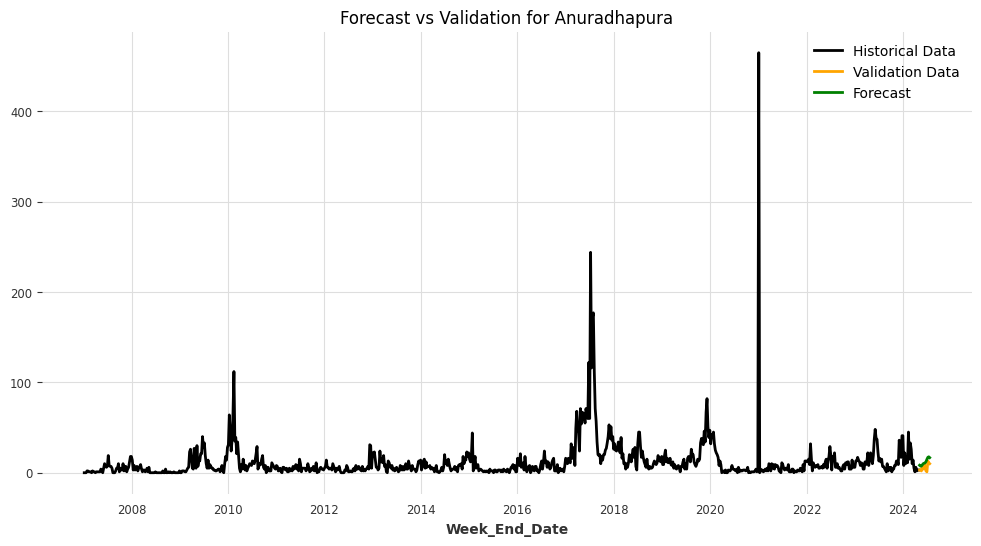

Model saved for /content/drive/MyDrive/Models/Anuradhapura: /content/drive/MyDrive/Models/Anuradhapura_FFT.pkl


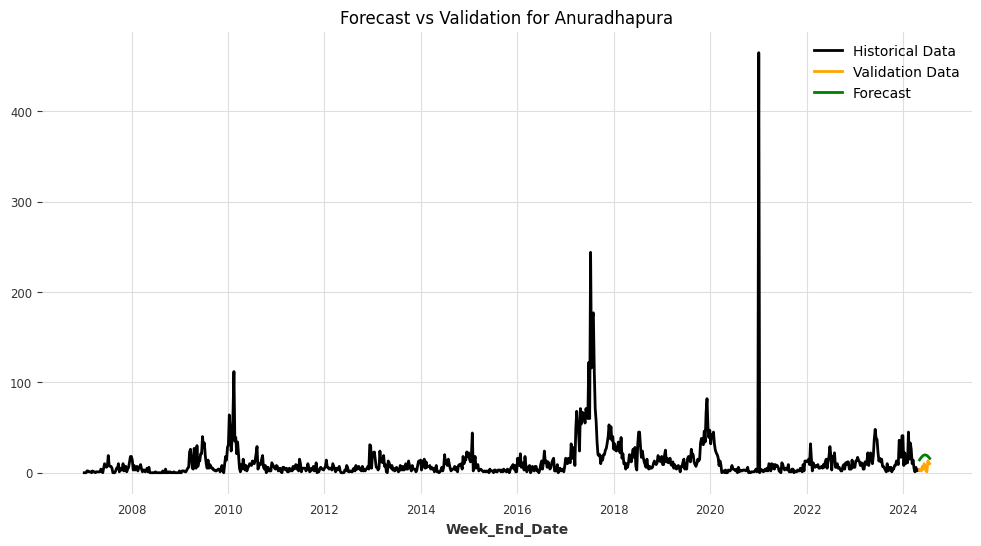

Model saved for /content/drive/MyDrive/Models/Anuradhapura: /content/drive/MyDrive/Models/Anuradhapura_KalmanForecaster.pkl


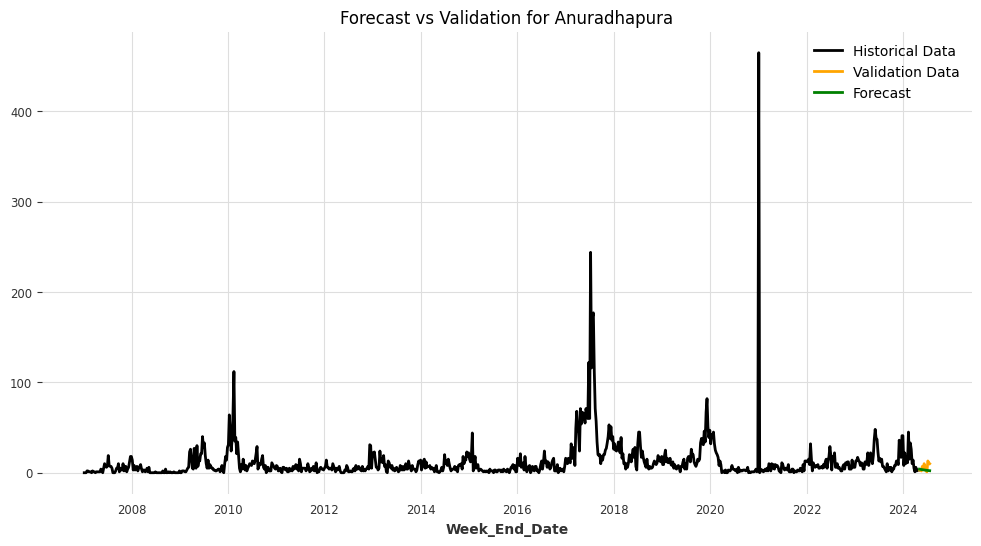

<ipython-input-41-47d63baebb5c>:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Training length: 904
Validation length: 12
Model saved for /content/drive/MyDrive/Models/Badulla: /content/drive/MyDrive/Models/Badulla_ARIMA.pkl


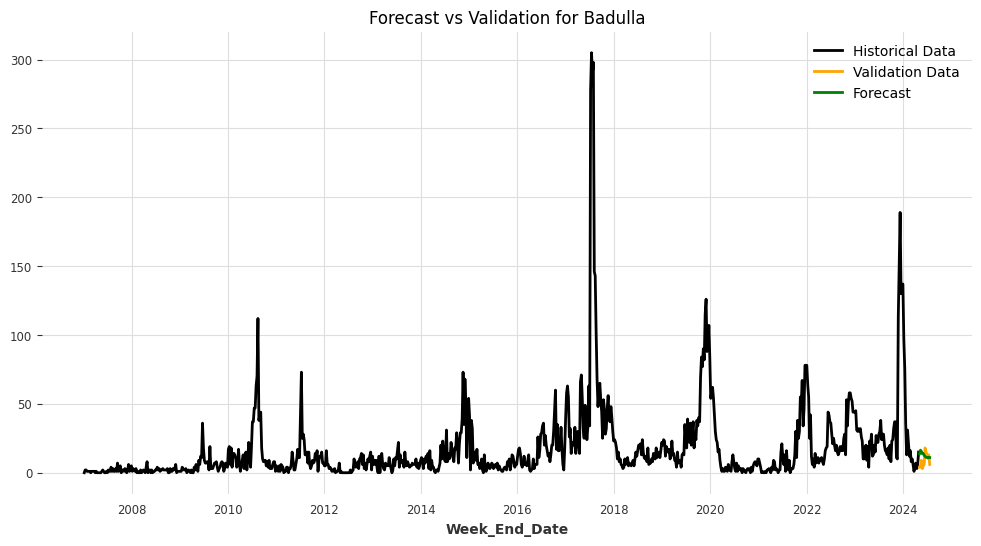

Model saved for /content/drive/MyDrive/Models/Badulla: /content/drive/MyDrive/Models/Badulla_AutoARIMA.pkl


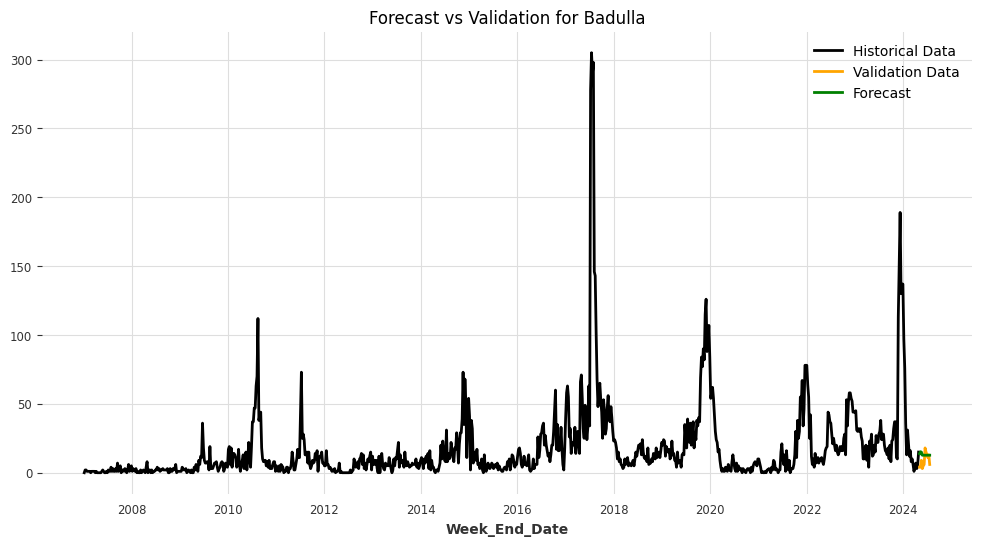

Model saved for /content/drive/MyDrive/Models/Badulla: /content/drive/MyDrive/Models/Badulla_ExponentialSmoothing.pkl


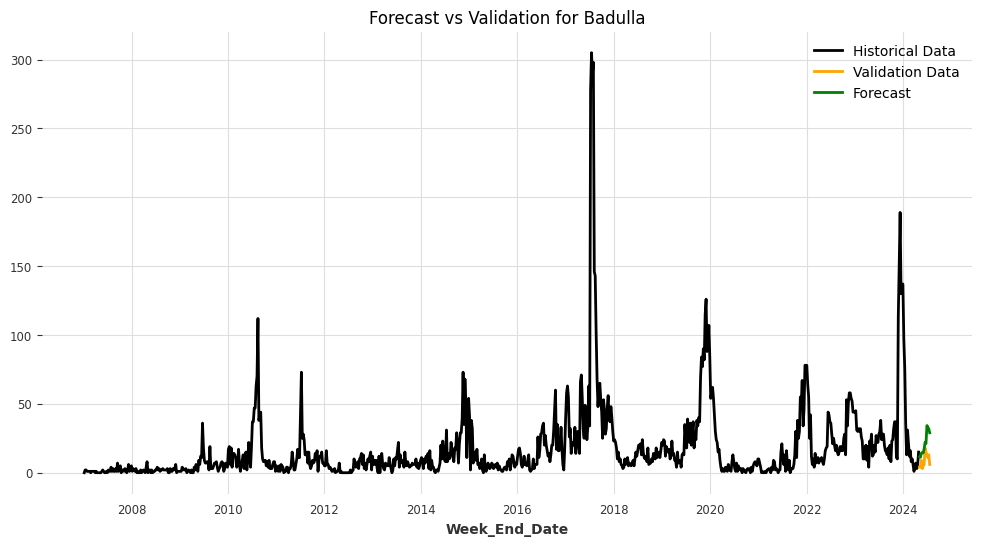

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpokfq9thx/6jvfhr4x.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpokfq9thx/fbbk_w1u.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=26215', 'data', 'file=/tmp/tmpokfq9thx/6jvfhr4x.json', 'init=/tmp/tmpokfq9thx/fbbk_w1u.json', 'output', 'file=/tmp/tmpokfq9thx/prophet_modelp5x25ffp/prophet_model-20240906025310.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
02:53:10 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
02:53:10 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Model saved for /content/drive/MyDrive/Models/Badulla: /content/drive/MyDrive/Models/Badulla_Prophet.pkl


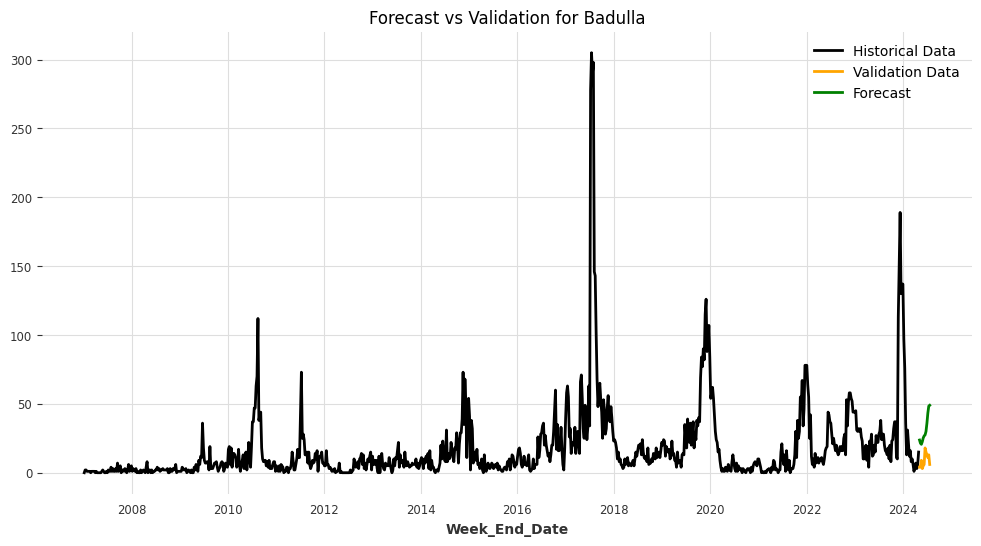

Model saved for /content/drive/MyDrive/Models/Badulla: /content/drive/MyDrive/Models/Badulla_FFT.pkl


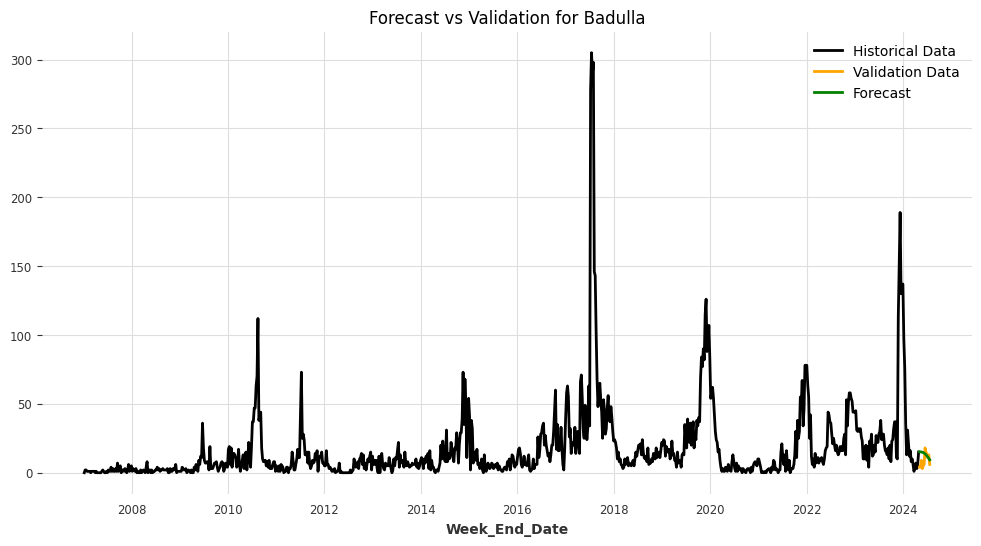

Model saved for /content/drive/MyDrive/Models/Badulla: /content/drive/MyDrive/Models/Badulla_KalmanForecaster.pkl


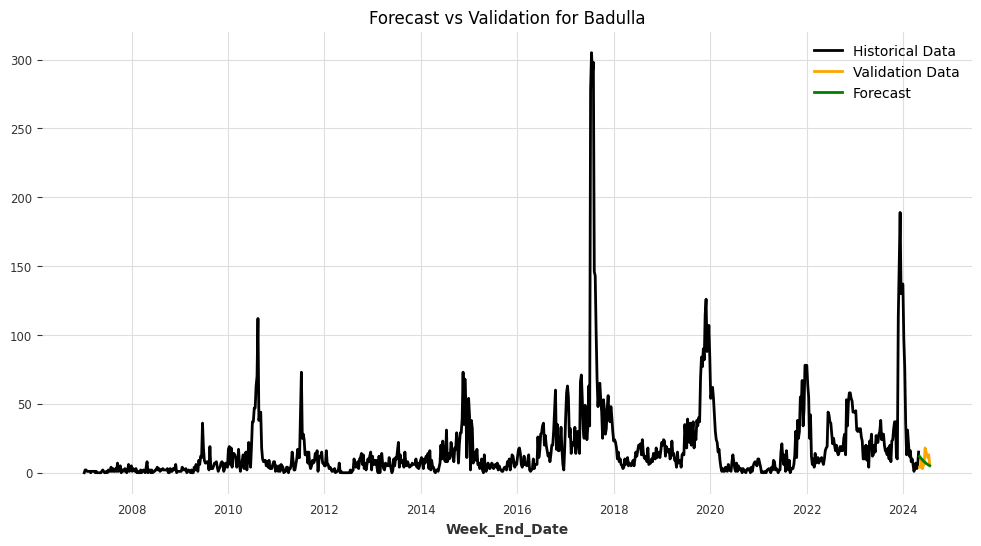

<ipython-input-41-47d63baebb5c>:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Training length: 904
Validation length: 12
Model saved for /content/drive/MyDrive/Models/Batticaloa: /content/drive/MyDrive/Models/Batticaloa_ARIMA.pkl


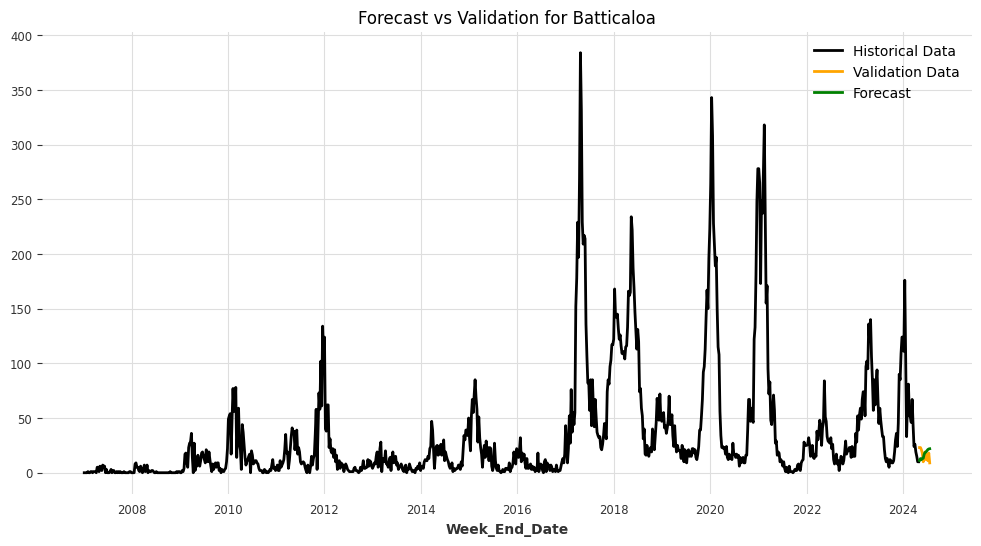

Model saved for /content/drive/MyDrive/Models/Batticaloa: /content/drive/MyDrive/Models/Batticaloa_AutoARIMA.pkl


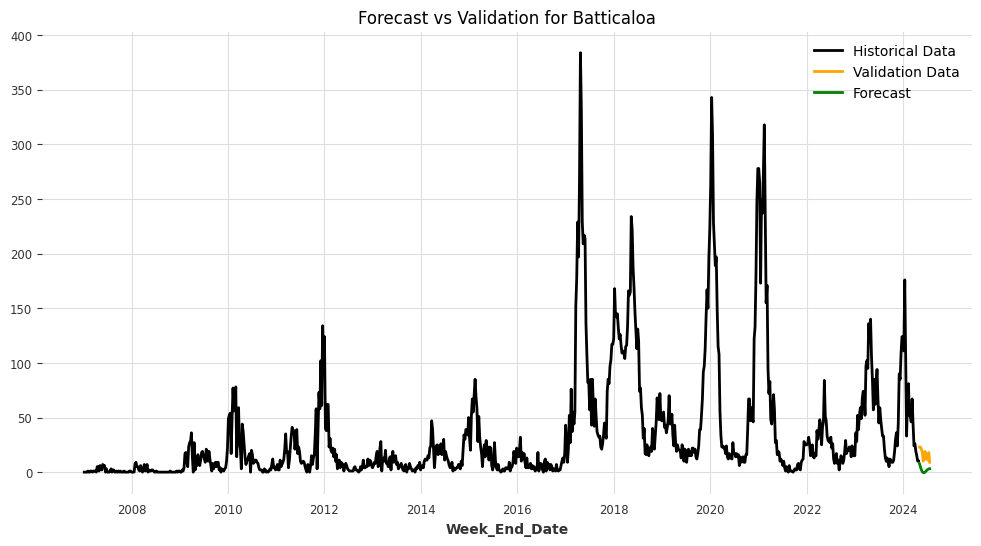

Model saved for /content/drive/MyDrive/Models/Batticaloa: /content/drive/MyDrive/Models/Batticaloa_ExponentialSmoothing.pkl


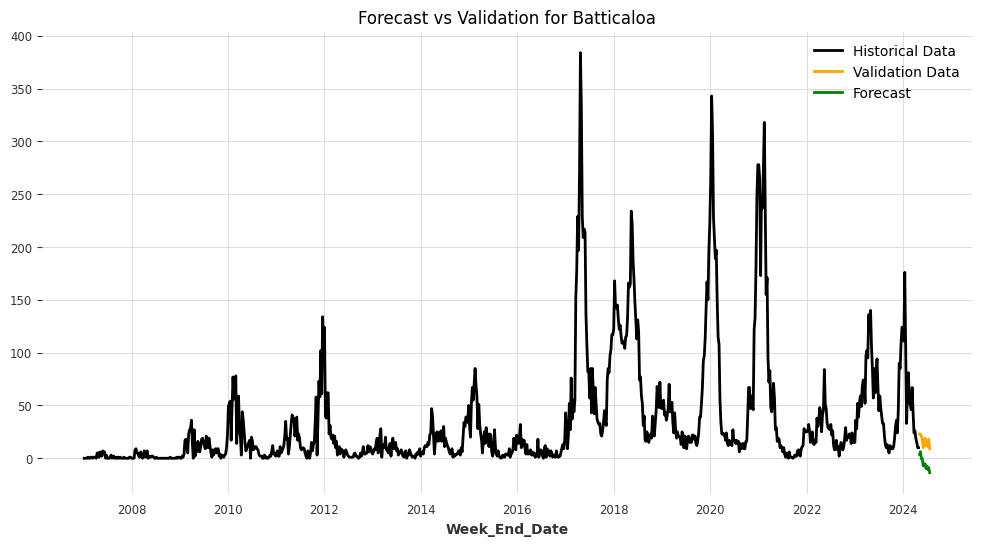

/usr/local/lib/python3.10/dist-packages/darts/metrics/metrics.py:1647: RuntimeWarning:

invalid value encountered in log

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpokfq9thx/1wog8_tv.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpokfq9thx/9mhxp9u1.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=47563', 'data', 'file=/tmp/tmpokfq9thx/1wog8_tv.json', 'init=/tmp/tmpokfq9thx/9mhxp9u1.json', 'output', 'file=/tmp/tmpokfq9thx/prophet_model5bjnwqqf/prophet_model-20240906025339.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
02:53:39 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
02:53:40 - cmds

Model saved for /content/drive/MyDrive/Models/Batticaloa: /content/drive/MyDrive/Models/Batticaloa_Prophet.pkl


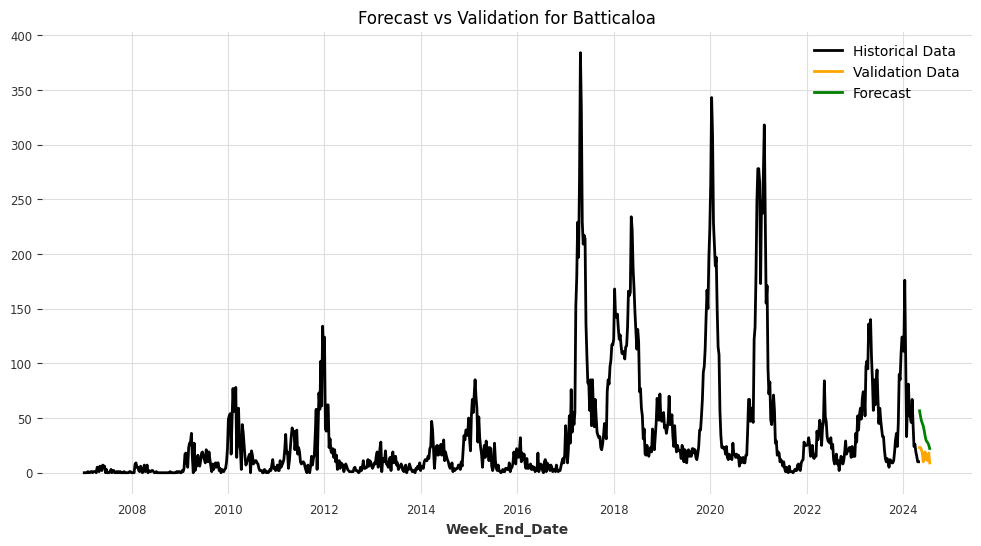

Model saved for /content/drive/MyDrive/Models/Batticaloa: /content/drive/MyDrive/Models/Batticaloa_FFT.pkl


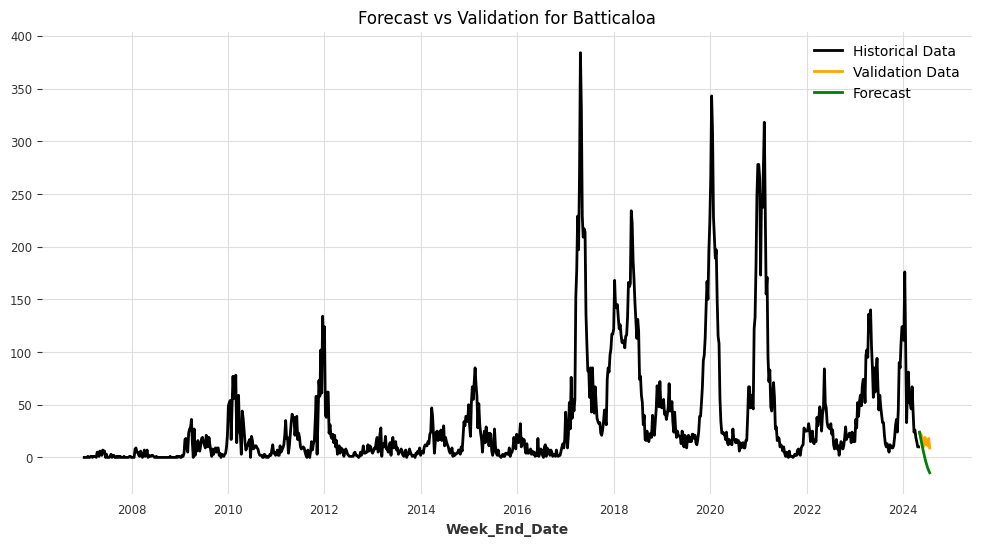

/usr/local/lib/python3.10/dist-packages/darts/metrics/metrics.py:1647: RuntimeWarning:

invalid value encountered in log



Model saved for /content/drive/MyDrive/Models/Batticaloa: /content/drive/MyDrive/Models/Batticaloa_KalmanForecaster.pkl


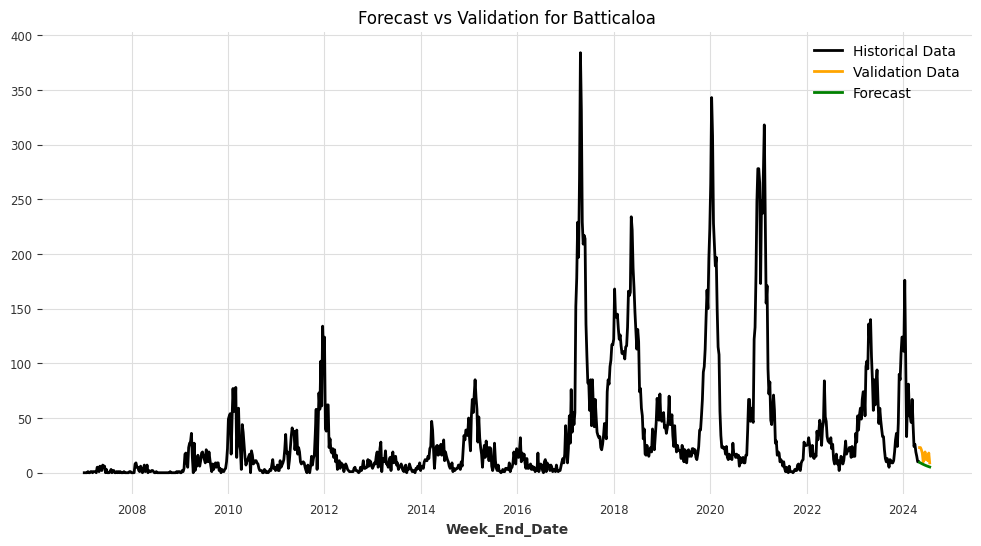

<ipython-input-41-47d63baebb5c>:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Training length: 904
Validation length: 12
Model saved for /content/drive/MyDrive/Models/Colombo: /content/drive/MyDrive/Models/Colombo_ARIMA.pkl


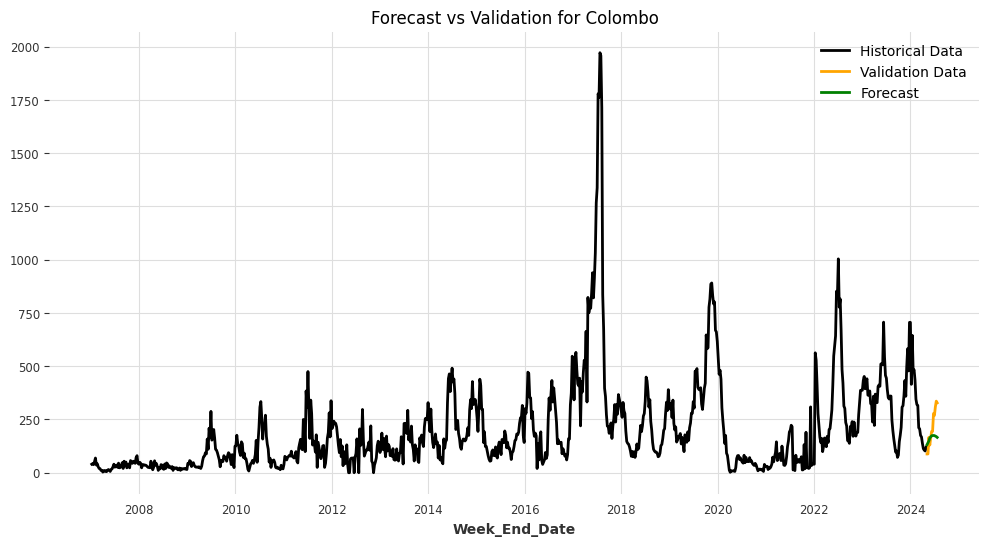

Model saved for /content/drive/MyDrive/Models/Colombo: /content/drive/MyDrive/Models/Colombo_AutoARIMA.pkl


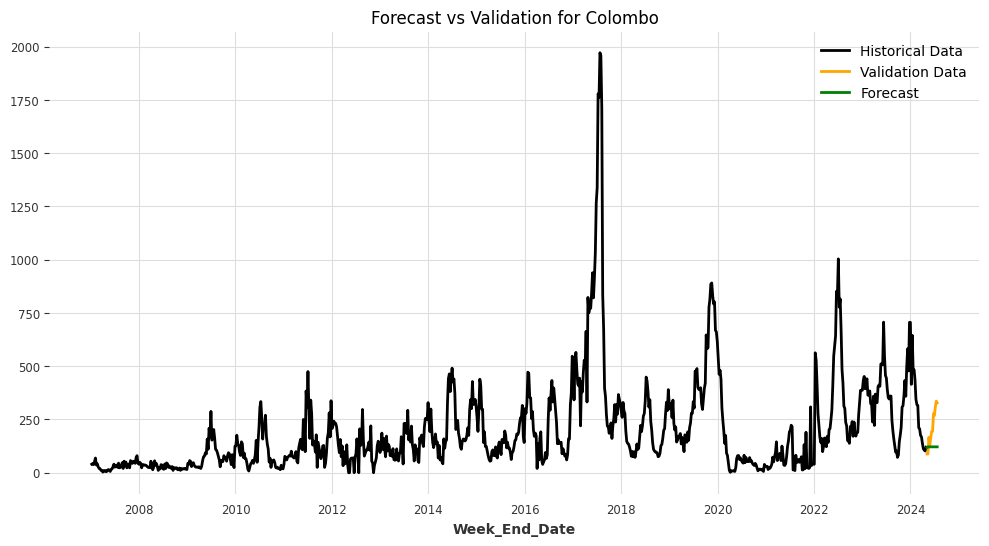

Model saved for /content/drive/MyDrive/Models/Colombo: /content/drive/MyDrive/Models/Colombo_ExponentialSmoothing.pkl


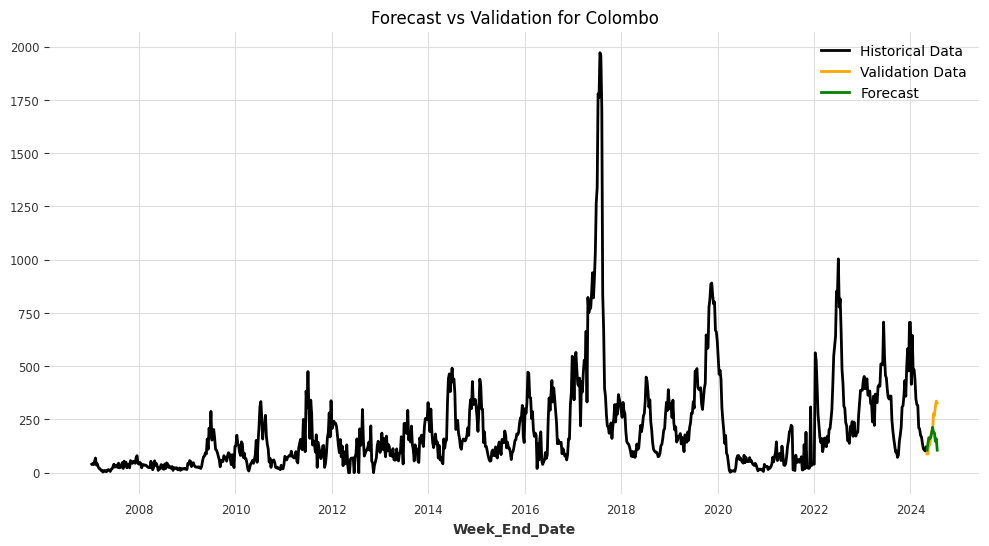

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpokfq9thx/1a20iax5.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpokfq9thx/4dh8inok.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=23420', 'data', 'file=/tmp/tmpokfq9thx/1a20iax5.json', 'init=/tmp/tmpokfq9thx/4dh8inok.json', 'output', 'file=/tmp/tmpokfq9thx/prophet_model8o4kv8y6/prophet_model-20240906025358.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
02:53:58 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
02:53:58 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Model saved for /content/drive/MyDrive/Models/Colombo: /content/drive/MyDrive/Models/Colombo_Prophet.pkl


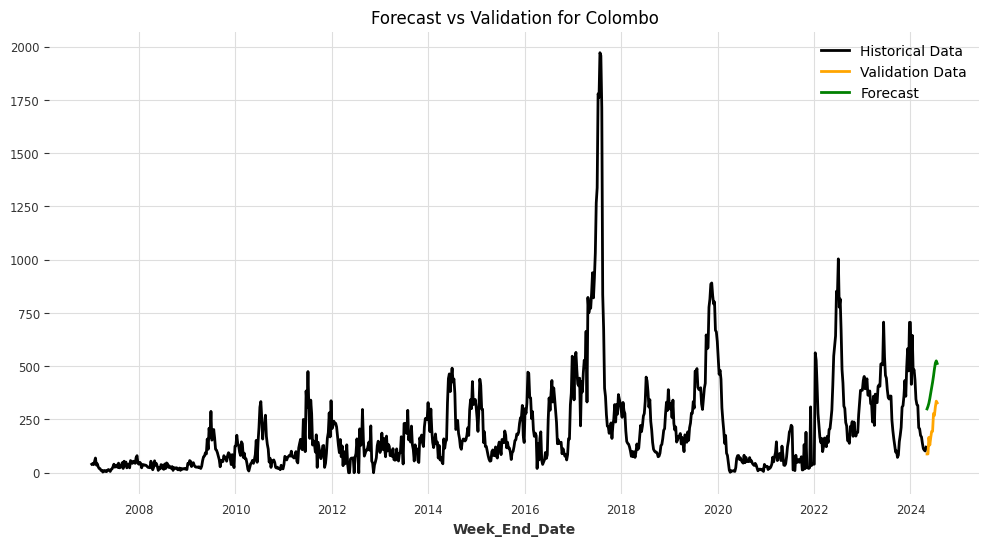

Model saved for /content/drive/MyDrive/Models/Colombo: /content/drive/MyDrive/Models/Colombo_FFT.pkl


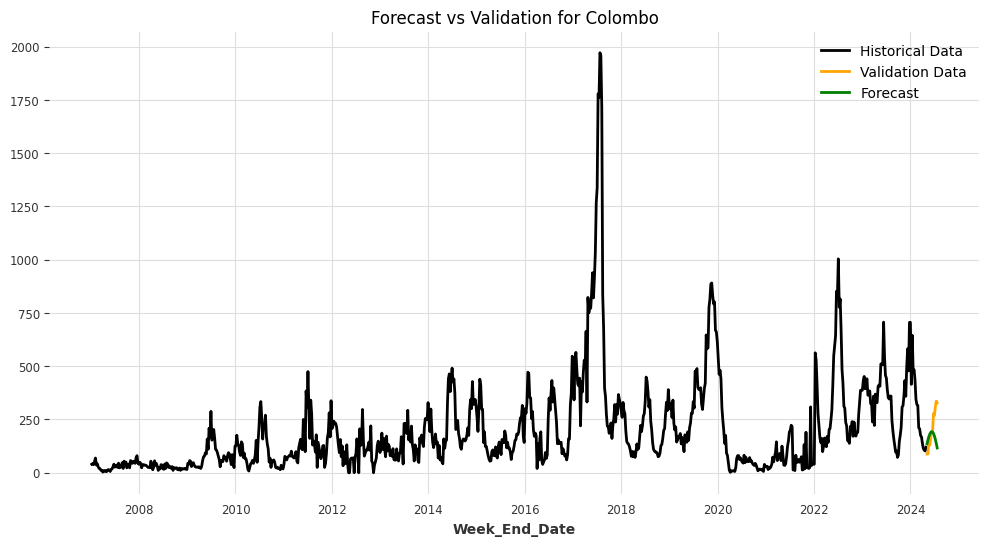

Model saved for /content/drive/MyDrive/Models/Colombo: /content/drive/MyDrive/Models/Colombo_KalmanForecaster.pkl


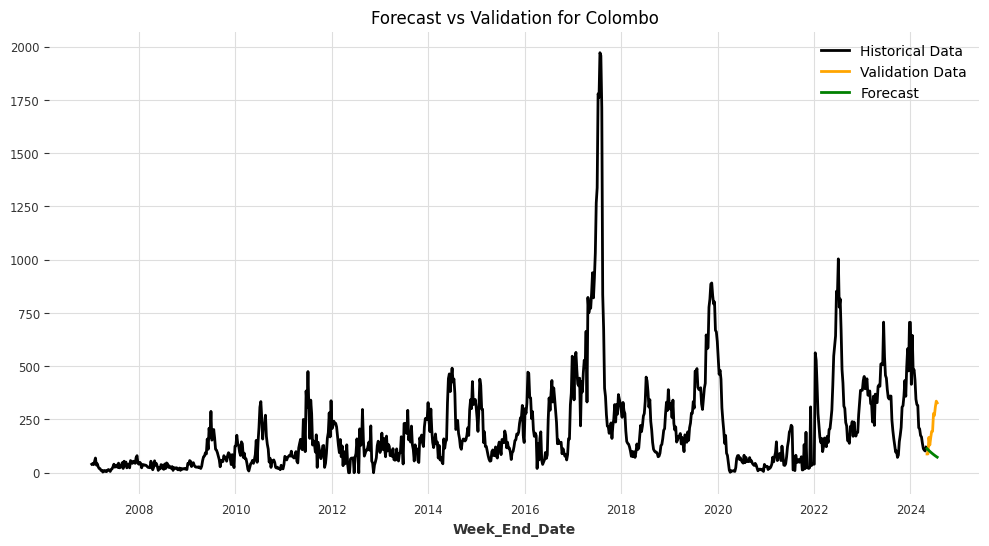

<ipython-input-41-47d63baebb5c>:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Training length: 904
Validation length: 12
Model saved for /content/drive/MyDrive/Models/Galle: /content/drive/MyDrive/Models/Galle_ARIMA.pkl


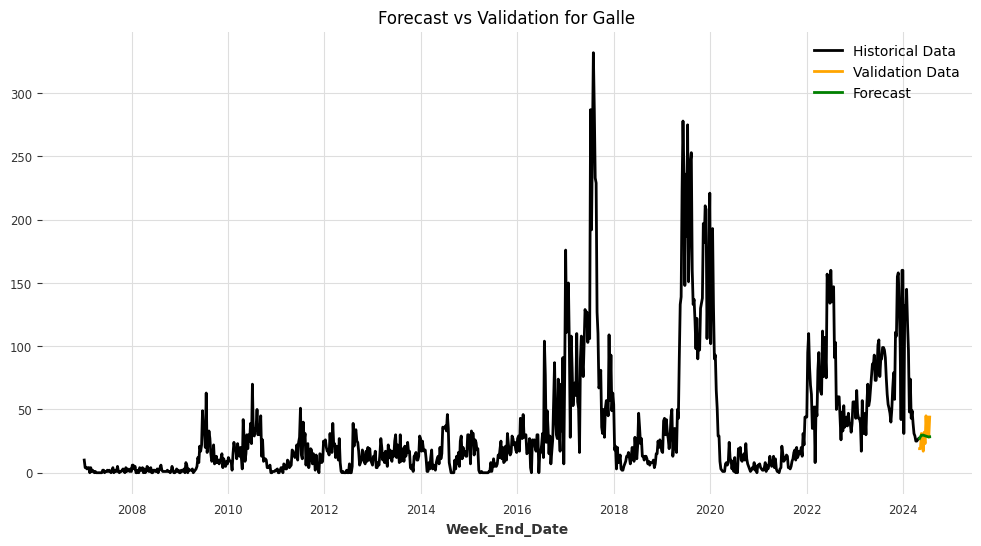

Model saved for /content/drive/MyDrive/Models/Galle: /content/drive/MyDrive/Models/Galle_AutoARIMA.pkl


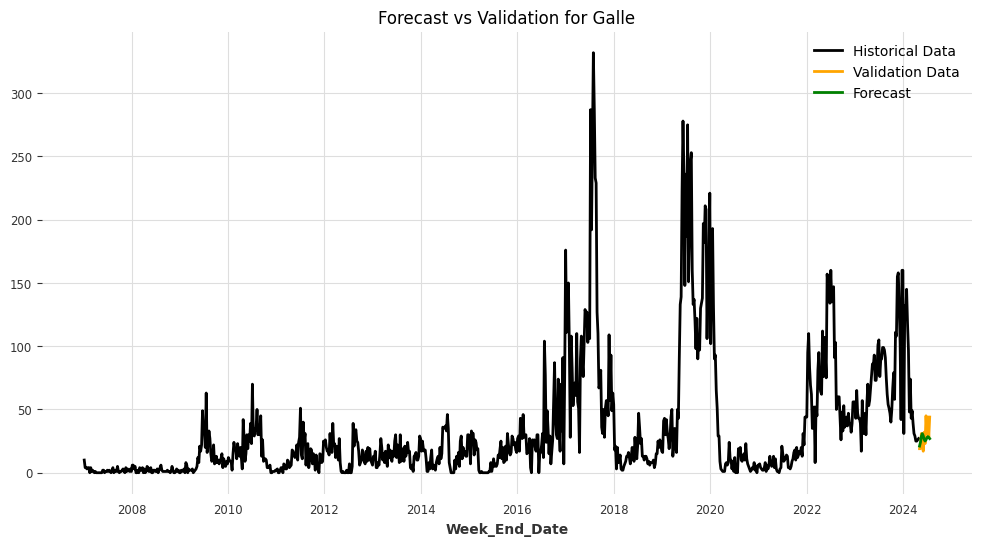

Model saved for /content/drive/MyDrive/Models/Galle: /content/drive/MyDrive/Models/Galle_ExponentialSmoothing.pkl


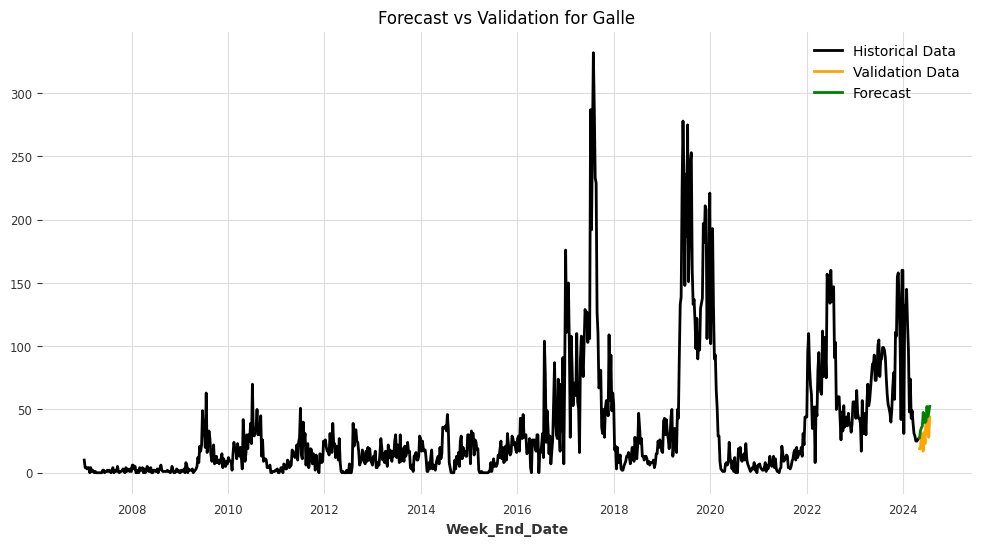

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpokfq9thx/rx59q5mp.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpokfq9thx/6hr0bue8.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=21257', 'data', 'file=/tmp/tmpokfq9thx/rx59q5mp.json', 'init=/tmp/tmpokfq9thx/6hr0bue8.json', 'output', 'file=/tmp/tmpokfq9thx/prophet_modely1c4alla/prophet_model-20240906025441.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
02:54:41 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
02:54:41 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Model saved for /content/drive/MyDrive/Models/Galle: /content/drive/MyDrive/Models/Galle_Prophet.pkl


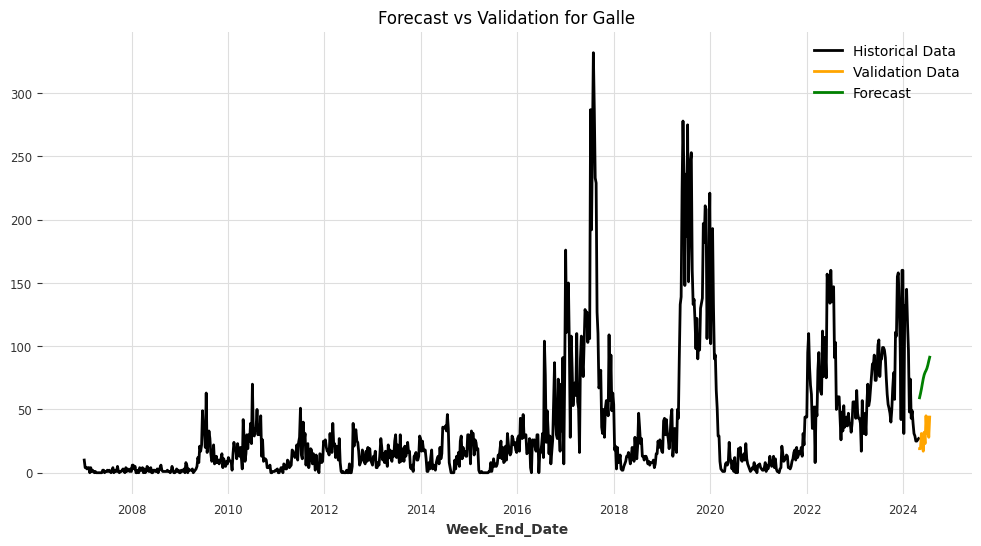

Model saved for /content/drive/MyDrive/Models/Galle: /content/drive/MyDrive/Models/Galle_FFT.pkl


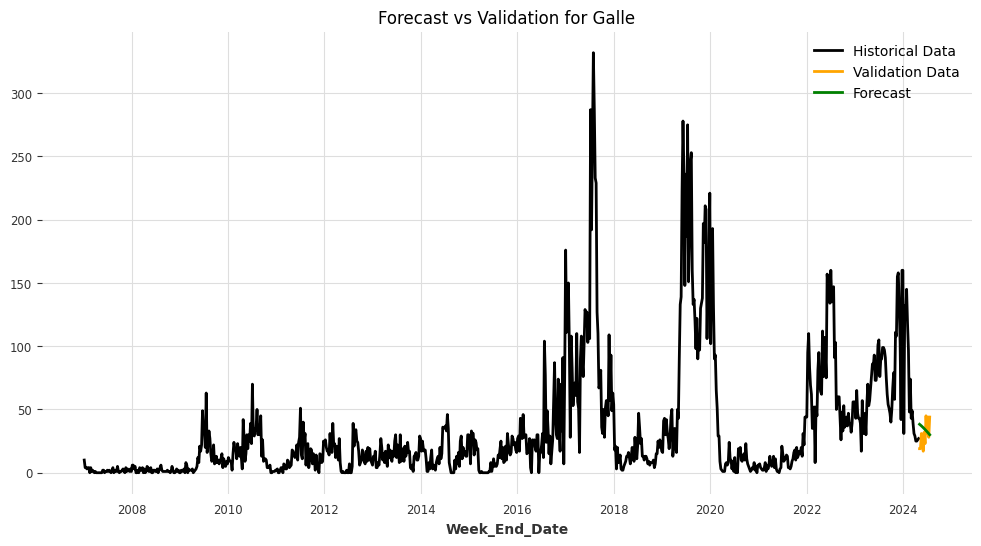

Model saved for /content/drive/MyDrive/Models/Galle: /content/drive/MyDrive/Models/Galle_KalmanForecaster.pkl


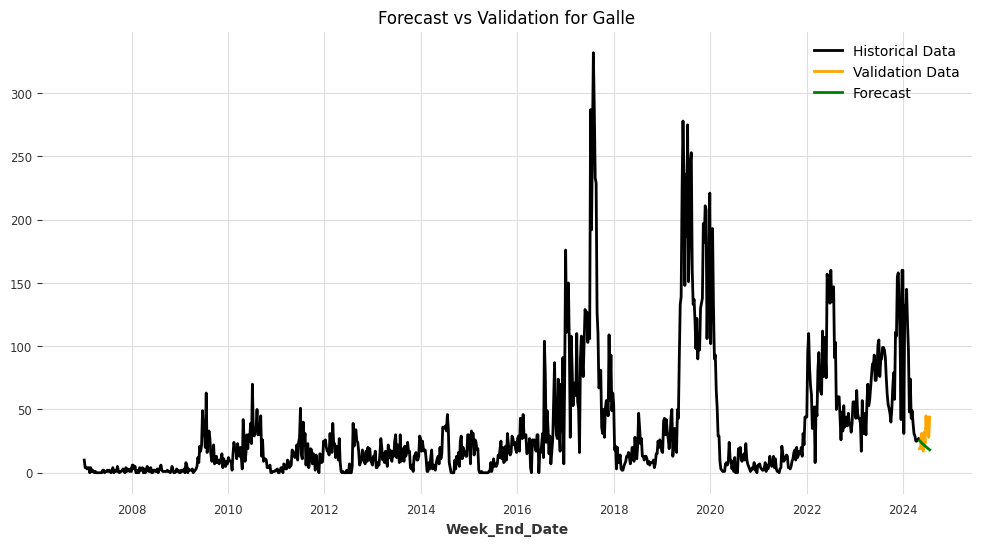

<ipython-input-41-47d63baebb5c>:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Training length: 904
Validation length: 12
Model saved for /content/drive/MyDrive/Models/Gampaha: /content/drive/MyDrive/Models/Gampaha_ARIMA.pkl


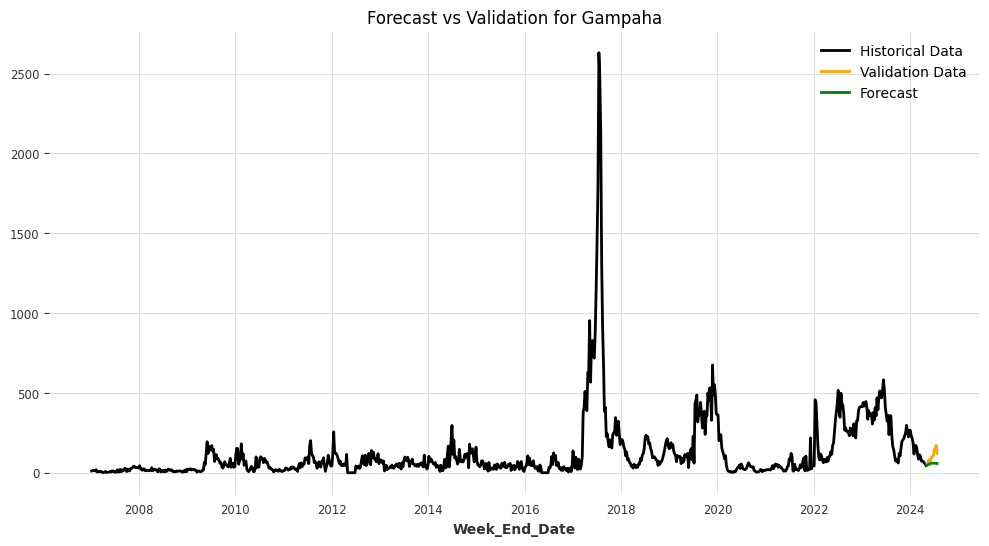

Model saved for /content/drive/MyDrive/Models/Gampaha: /content/drive/MyDrive/Models/Gampaha_AutoARIMA.pkl


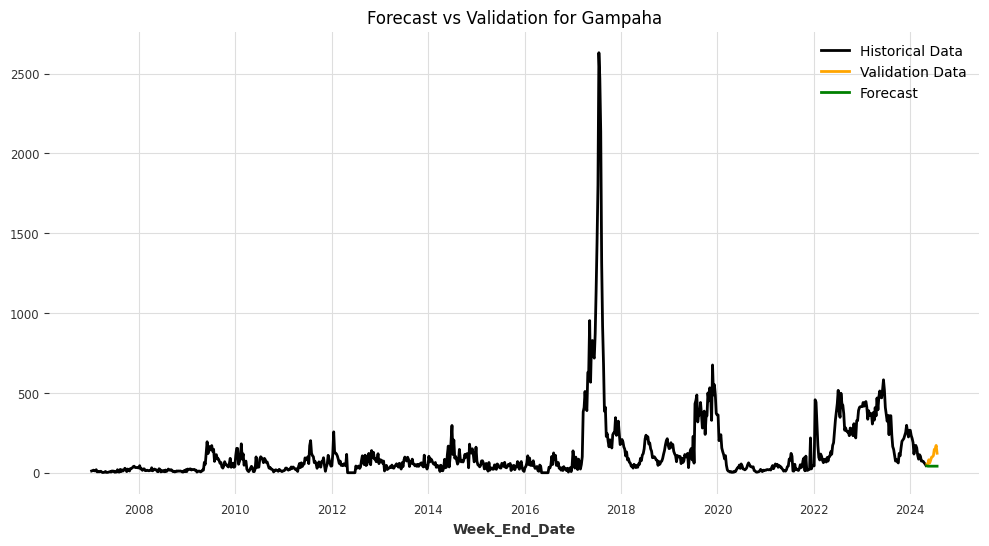

Model saved for /content/drive/MyDrive/Models/Gampaha: /content/drive/MyDrive/Models/Gampaha_ExponentialSmoothing.pkl


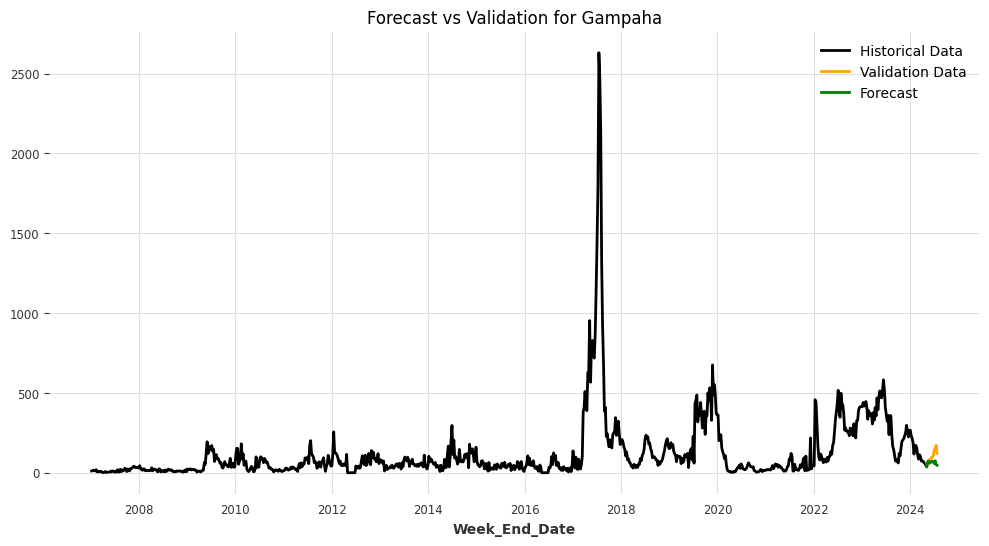

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpokfq9thx/lbwmf3is.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpokfq9thx/fqlwyw64.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=50383', 'data', 'file=/tmp/tmpokfq9thx/lbwmf3is.json', 'init=/tmp/tmpokfq9thx/fqlwyw64.json', 'output', 'file=/tmp/tmpokfq9thx/prophet_modellyol7qmw/prophet_model-20240906025459.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
02:54:59 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
02:54:59 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Model saved for /content/drive/MyDrive/Models/Gampaha: /content/drive/MyDrive/Models/Gampaha_Prophet.pkl


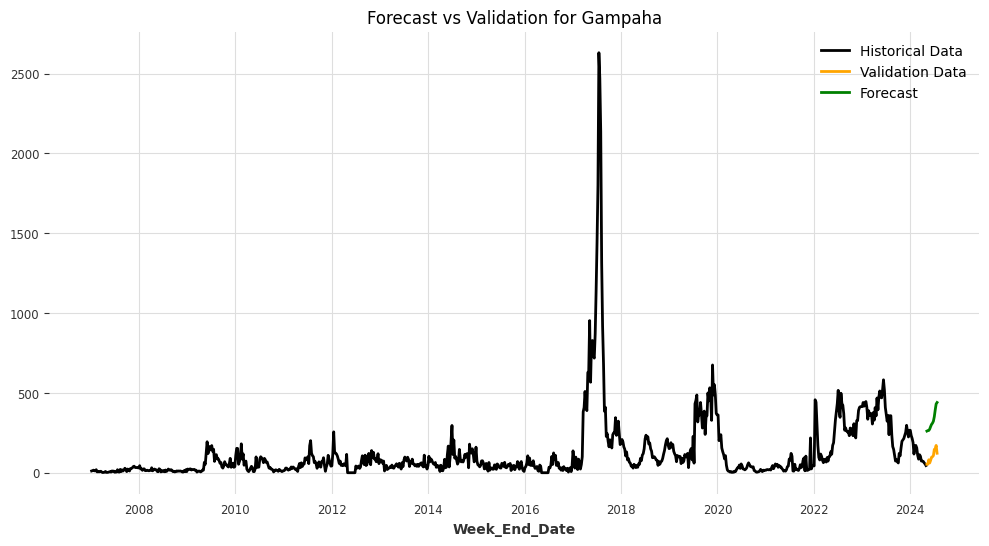

Model saved for /content/drive/MyDrive/Models/Gampaha: /content/drive/MyDrive/Models/Gampaha_FFT.pkl


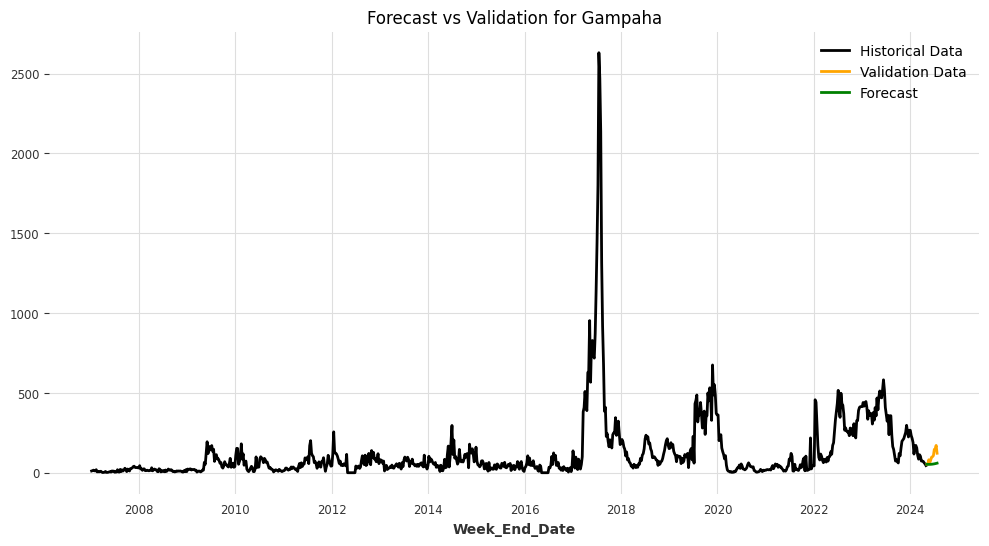

Model saved for /content/drive/MyDrive/Models/Gampaha: /content/drive/MyDrive/Models/Gampaha_KalmanForecaster.pkl


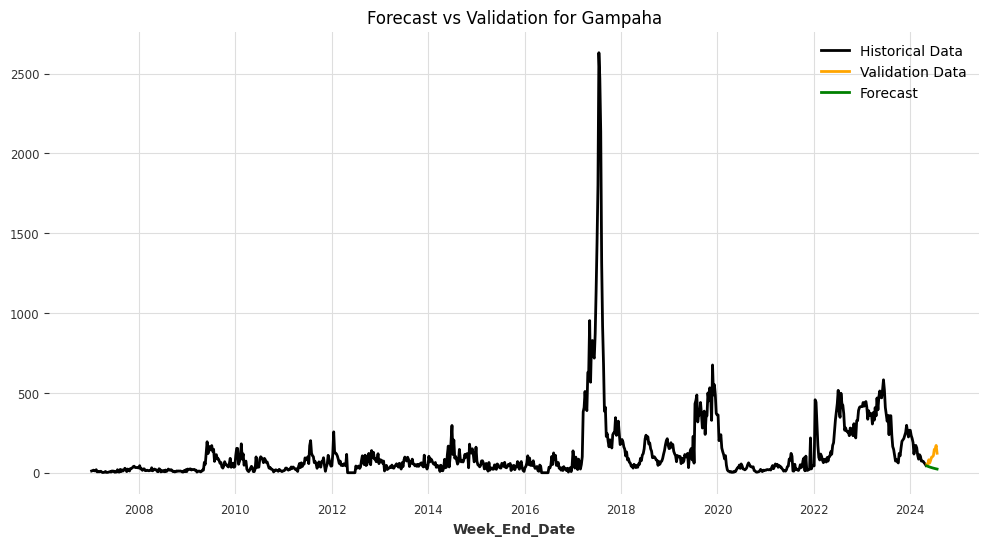

<ipython-input-41-47d63baebb5c>:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Training length: 904
Validation length: 12
Model saved for /content/drive/MyDrive/Models/Hambantota: /content/drive/MyDrive/Models/Hambantota_ARIMA.pkl


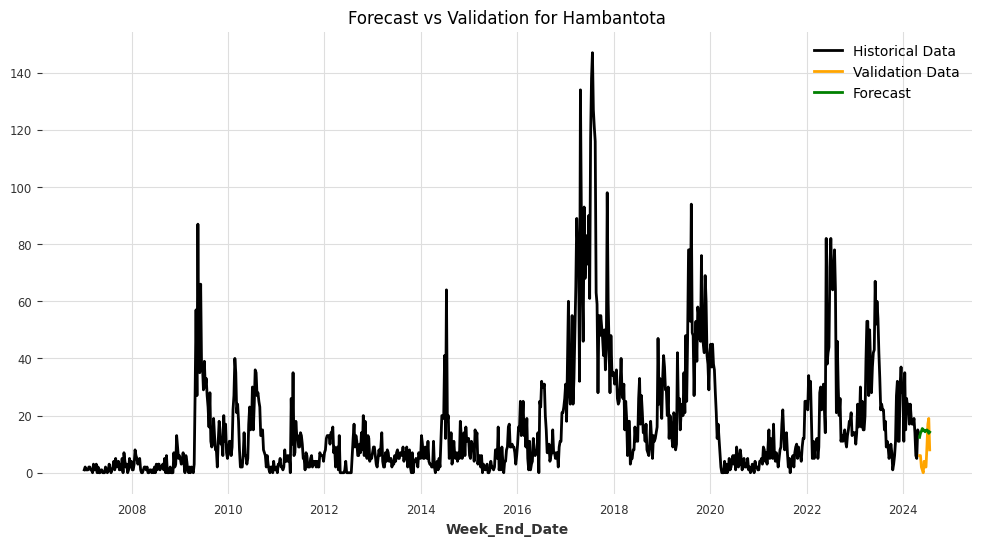

Model saved for /content/drive/MyDrive/Models/Hambantota: /content/drive/MyDrive/Models/Hambantota_AutoARIMA.pkl


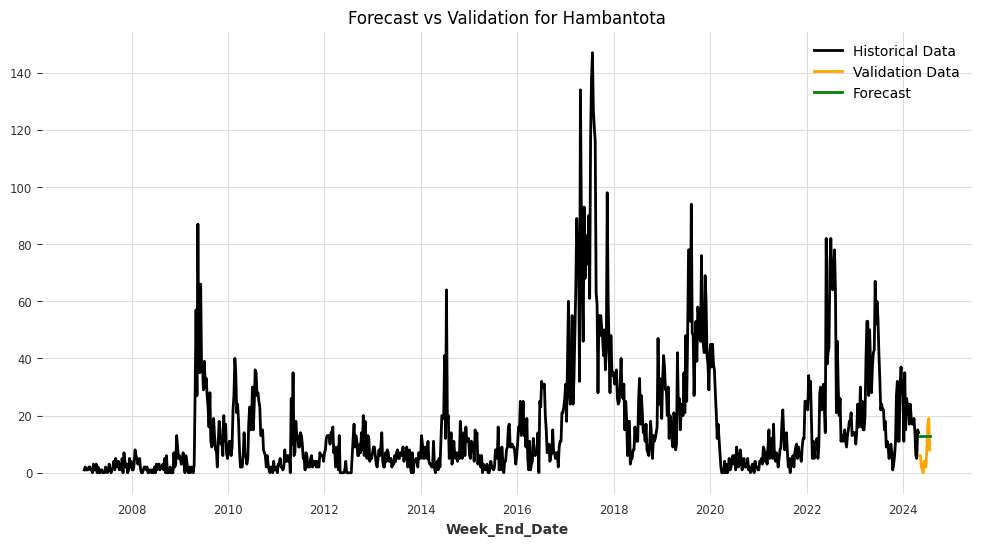

Model saved for /content/drive/MyDrive/Models/Hambantota: /content/drive/MyDrive/Models/Hambantota_ExponentialSmoothing.pkl


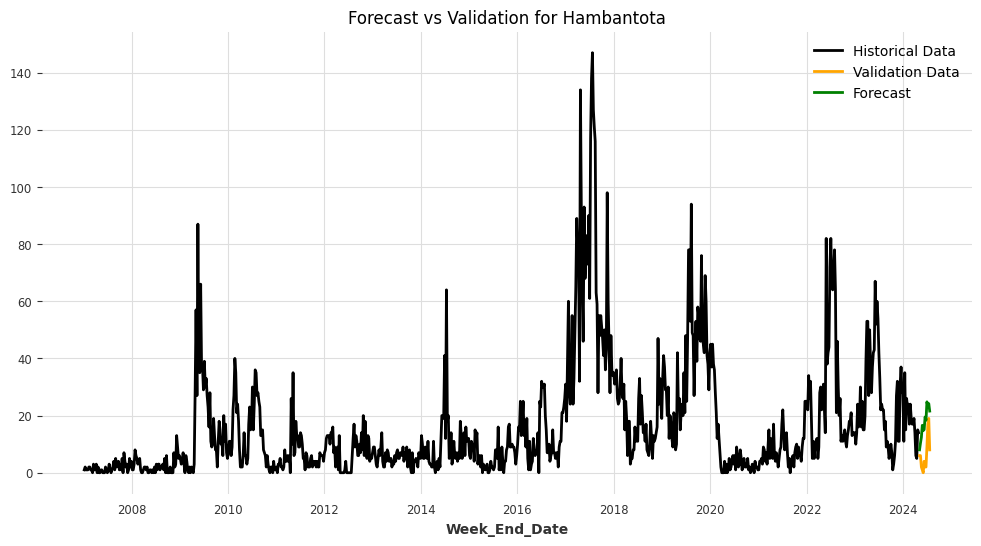

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpokfq9thx/vwlx2ohh.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpokfq9thx/mpi1bim0.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=59444', 'data', 'file=/tmp/tmpokfq9thx/vwlx2ohh.json', 'init=/tmp/tmpokfq9thx/mpi1bim0.json', 'output', 'file=/tmp/tmpokfq9thx/prophet_modelwfbx9t21/prophet_model-20240906025514.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
02:55:14 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
02:55:14 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Model saved for /content/drive/MyDrive/Models/Hambantota: /content/drive/MyDrive/Models/Hambantota_Prophet.pkl


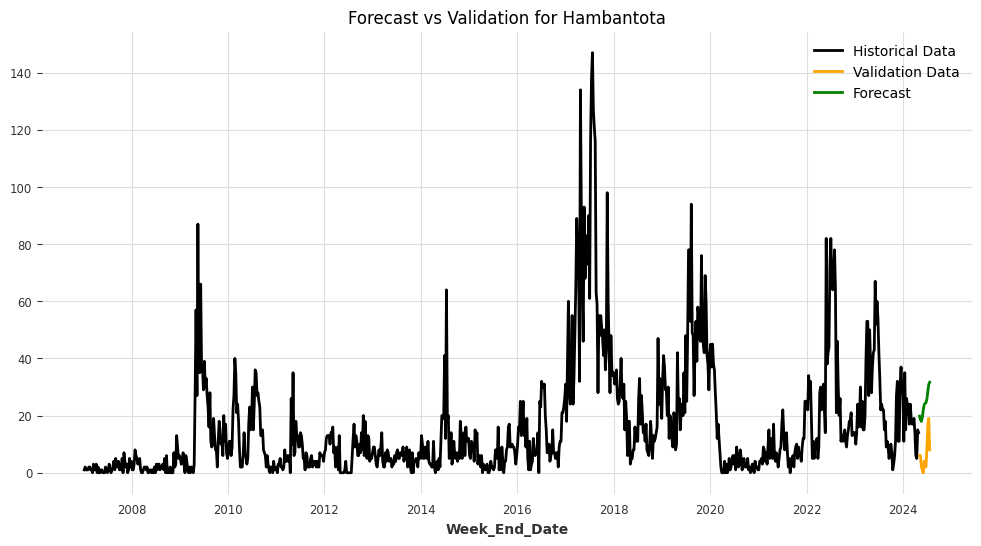

Model saved for /content/drive/MyDrive/Models/Hambantota: /content/drive/MyDrive/Models/Hambantota_FFT.pkl


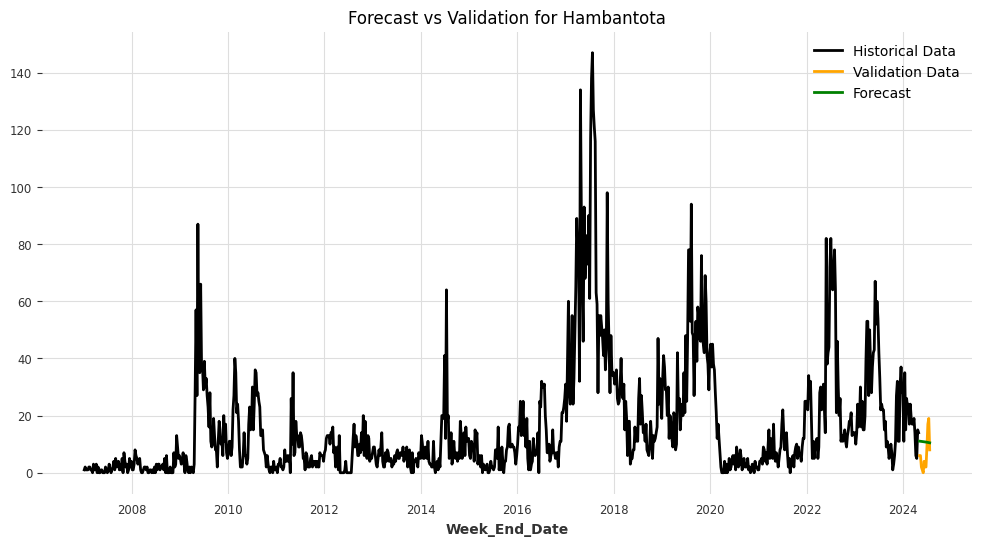

Model saved for /content/drive/MyDrive/Models/Hambantota: /content/drive/MyDrive/Models/Hambantota_KalmanForecaster.pkl


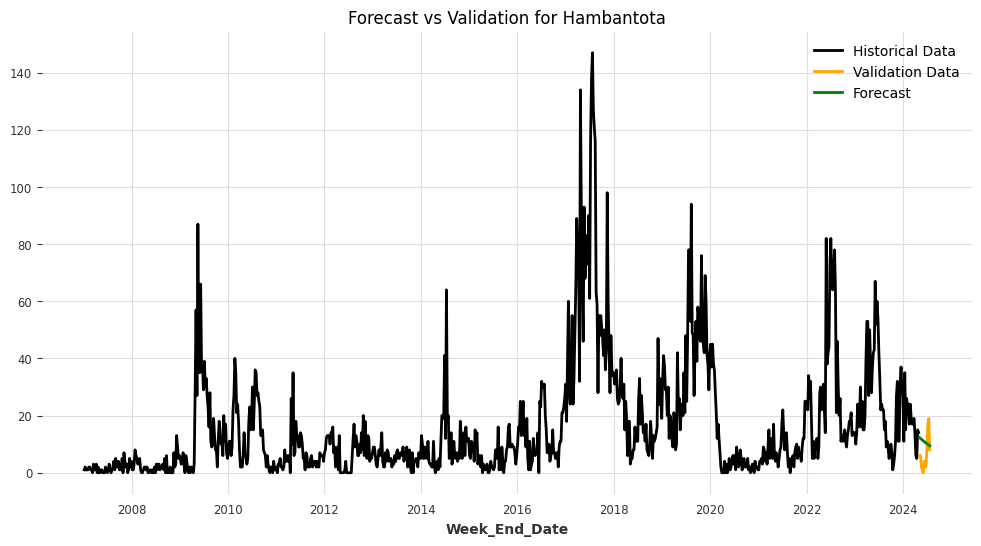

<ipython-input-41-47d63baebb5c>:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Training length: 904
Validation length: 12
Model saved for /content/drive/MyDrive/Models/Jaffna: /content/drive/MyDrive/Models/Jaffna_ARIMA.pkl


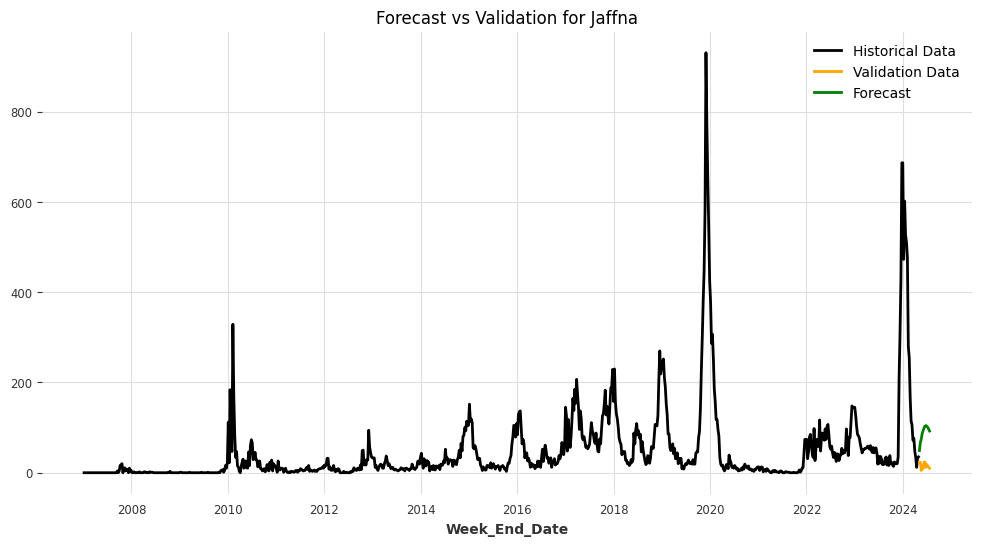

Model saved for /content/drive/MyDrive/Models/Jaffna: /content/drive/MyDrive/Models/Jaffna_AutoARIMA.pkl


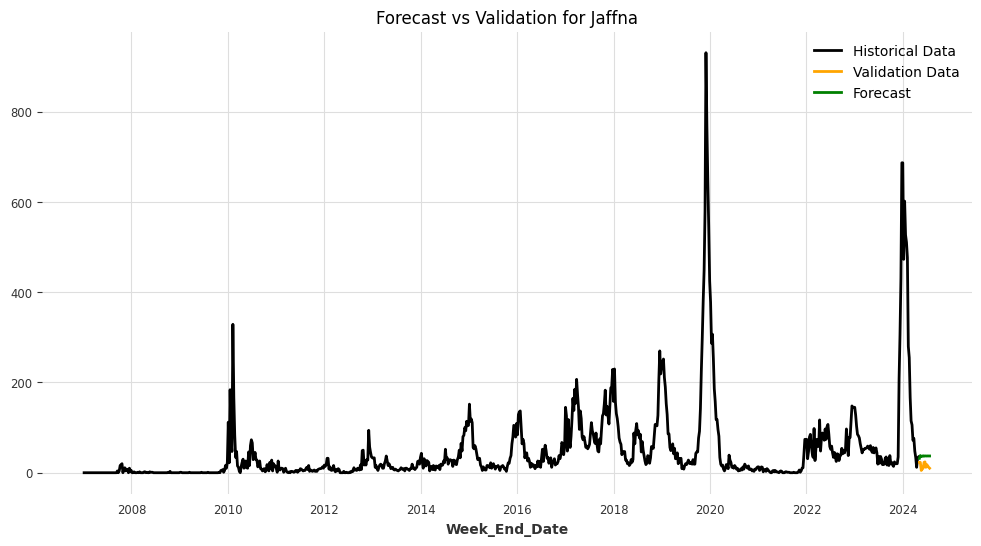

Model saved for /content/drive/MyDrive/Models/Jaffna: /content/drive/MyDrive/Models/Jaffna_ExponentialSmoothing.pkl


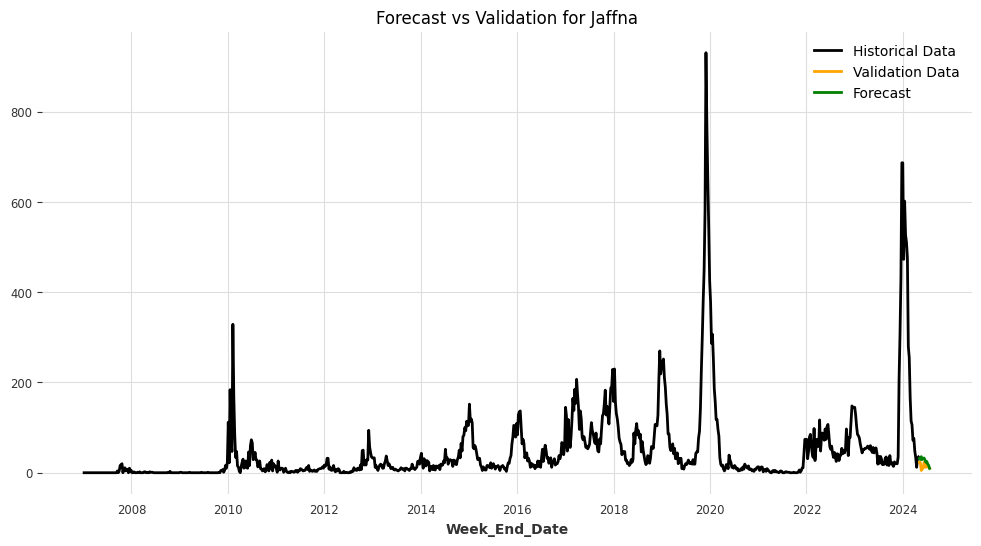

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpokfq9thx/x410wqne.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpokfq9thx/wexn3ufd.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=70968', 'data', 'file=/tmp/tmpokfq9thx/x410wqne.json', 'init=/tmp/tmpokfq9thx/wexn3ufd.json', 'output', 'file=/tmp/tmpokfq9thx/prophet_modelzrjzqyg1/prophet_model-20240906025538.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
02:55:38 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
02:55:38 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Model saved for /content/drive/MyDrive/Models/Jaffna: /content/drive/MyDrive/Models/Jaffna_Prophet.pkl


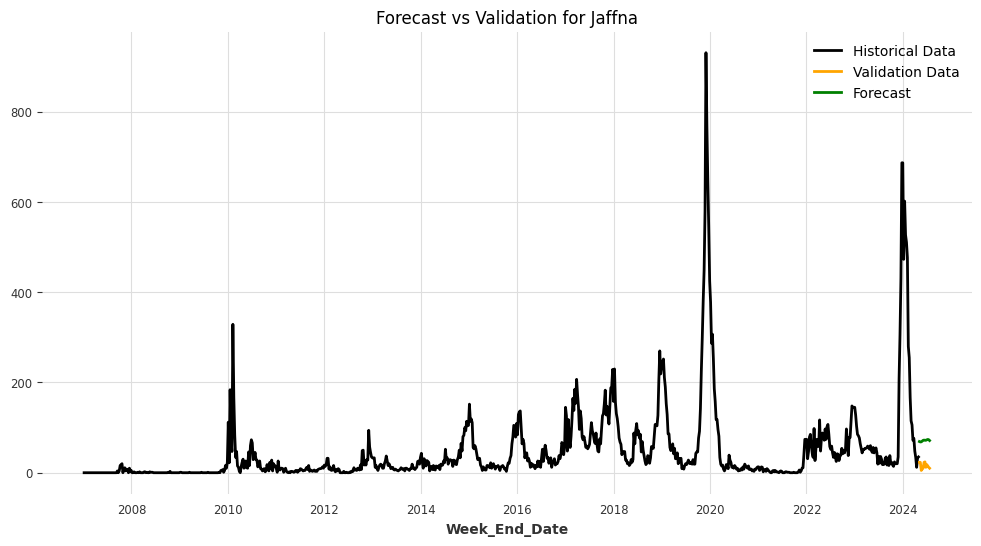

Model saved for /content/drive/MyDrive/Models/Jaffna: /content/drive/MyDrive/Models/Jaffna_FFT.pkl


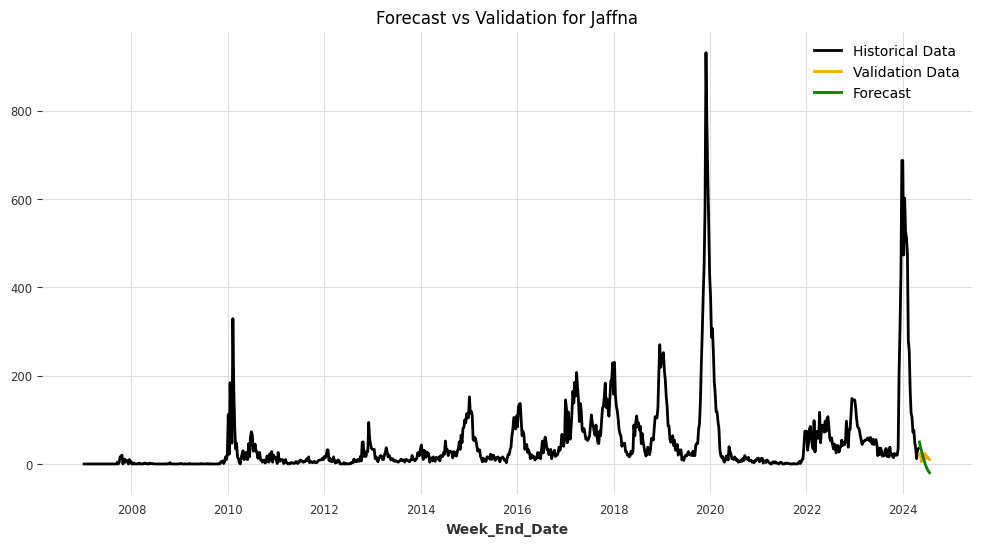

/usr/local/lib/python3.10/dist-packages/darts/metrics/metrics.py:1647: RuntimeWarning:

invalid value encountered in log



Model saved for /content/drive/MyDrive/Models/Jaffna: /content/drive/MyDrive/Models/Jaffna_KalmanForecaster.pkl


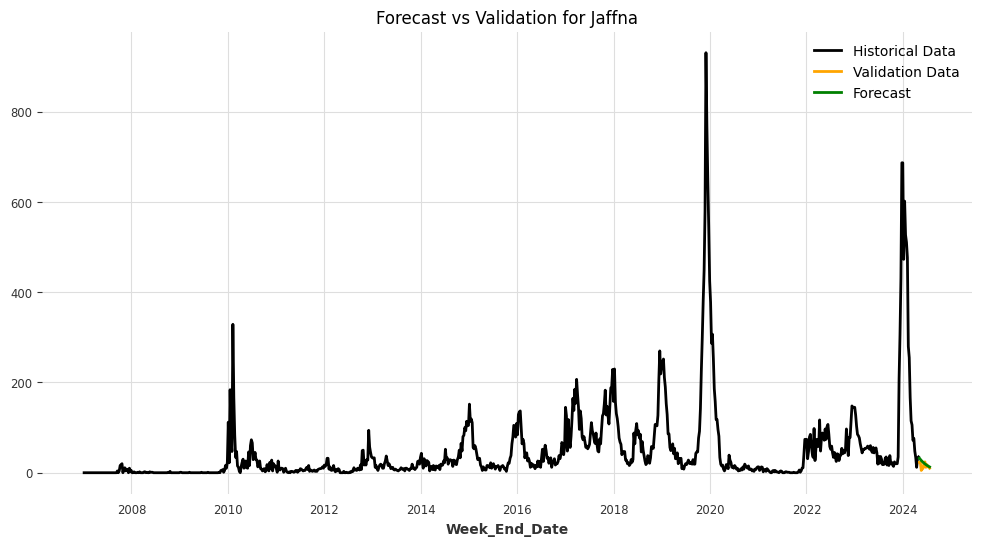

<ipython-input-41-47d63baebb5c>:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Training length: 904
Validation length: 12
Model saved for /content/drive/MyDrive/Models/Kalutara: /content/drive/MyDrive/Models/Kalutara_ARIMA.pkl


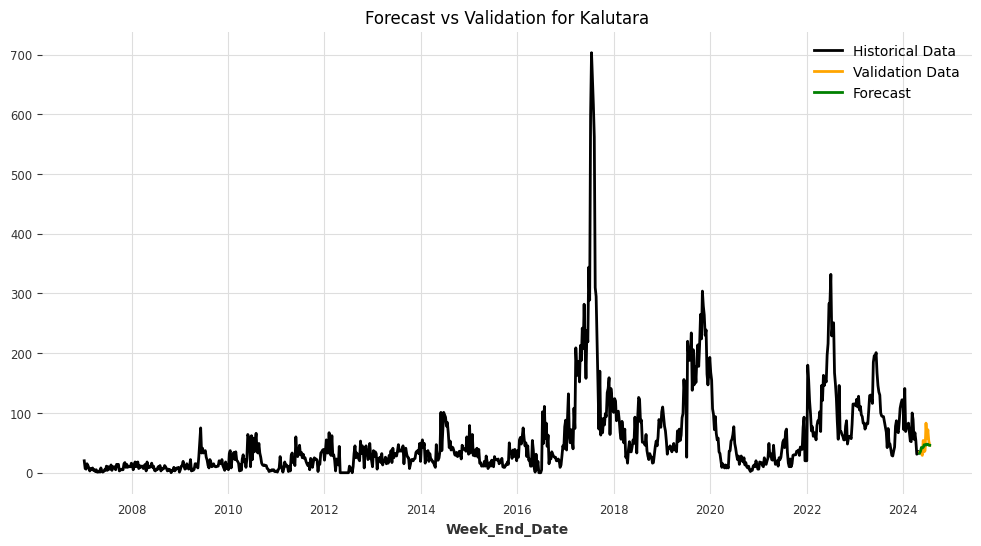

Model saved for /content/drive/MyDrive/Models/Kalutara: /content/drive/MyDrive/Models/Kalutara_AutoARIMA.pkl


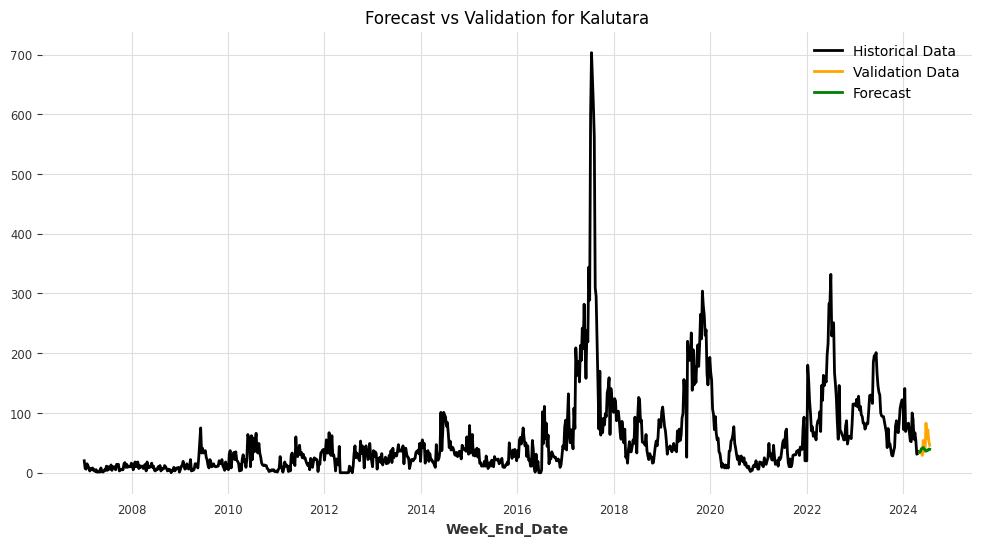

Model saved for /content/drive/MyDrive/Models/Kalutara: /content/drive/MyDrive/Models/Kalutara_ExponentialSmoothing.pkl


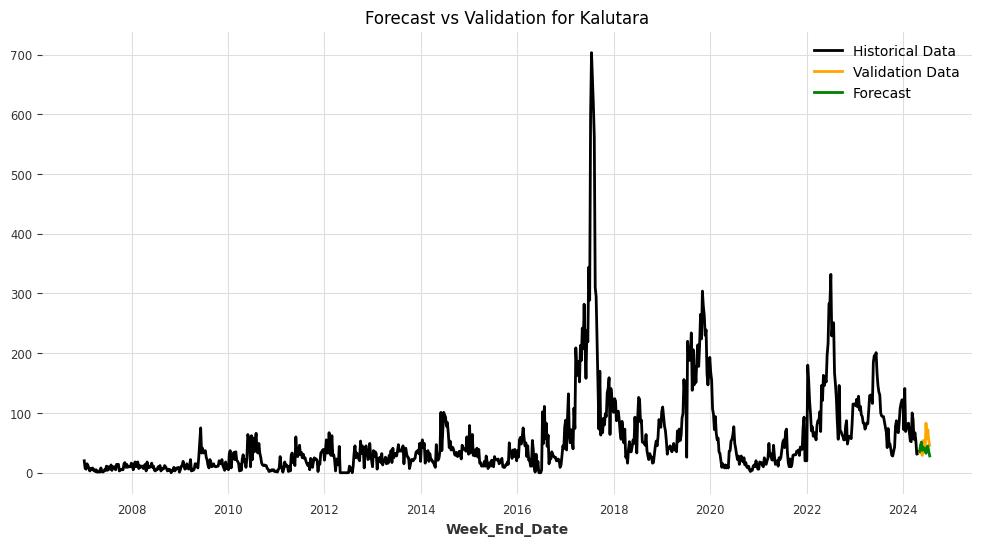

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpokfq9thx/p86z6ur7.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpokfq9thx/h5e2anvs.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=54778', 'data', 'file=/tmp/tmpokfq9thx/p86z6ur7.json', 'init=/tmp/tmpokfq9thx/h5e2anvs.json', 'output', 'file=/tmp/tmpokfq9thx/prophet_model4obc0onp/prophet_model-20240906025650.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
02:56:50 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
02:56:50 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Model saved for /content/drive/MyDrive/Models/Kalutara: /content/drive/MyDrive/Models/Kalutara_Prophet.pkl


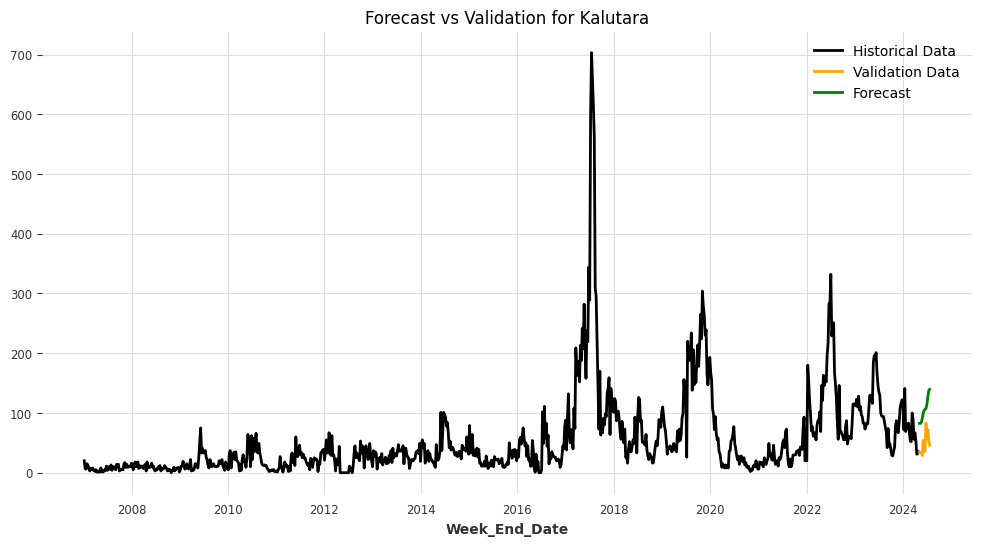

Model saved for /content/drive/MyDrive/Models/Kalutara: /content/drive/MyDrive/Models/Kalutara_FFT.pkl


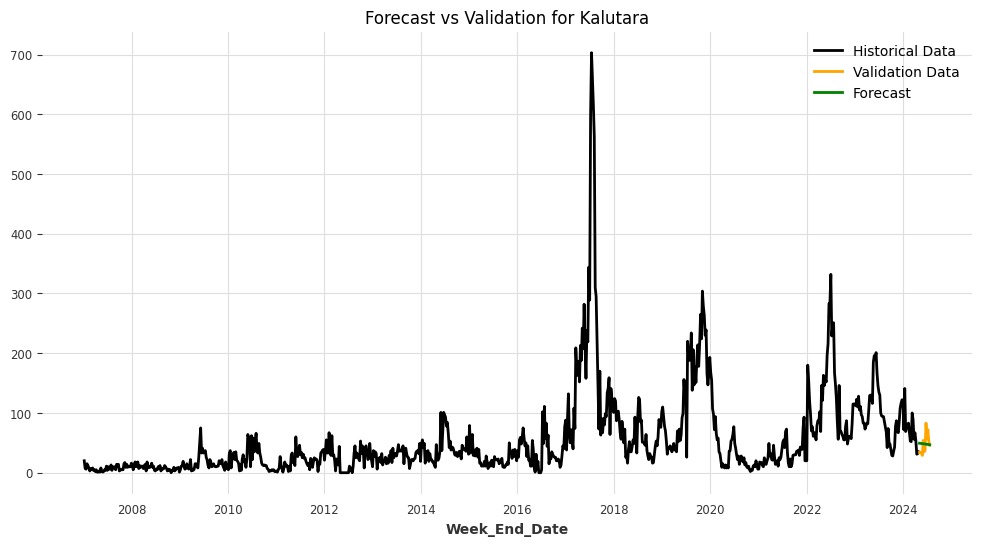

Model saved for /content/drive/MyDrive/Models/Kalutara: /content/drive/MyDrive/Models/Kalutara_KalmanForecaster.pkl


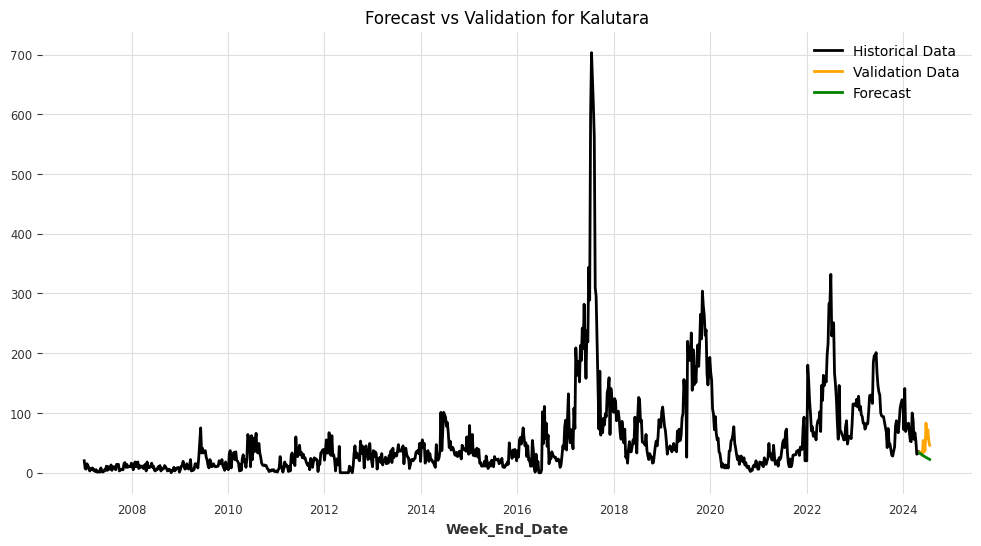

<ipython-input-41-47d63baebb5c>:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Training length: 904
Validation length: 12
Model saved for /content/drive/MyDrive/Models/Kandy: /content/drive/MyDrive/Models/Kandy_ARIMA.pkl


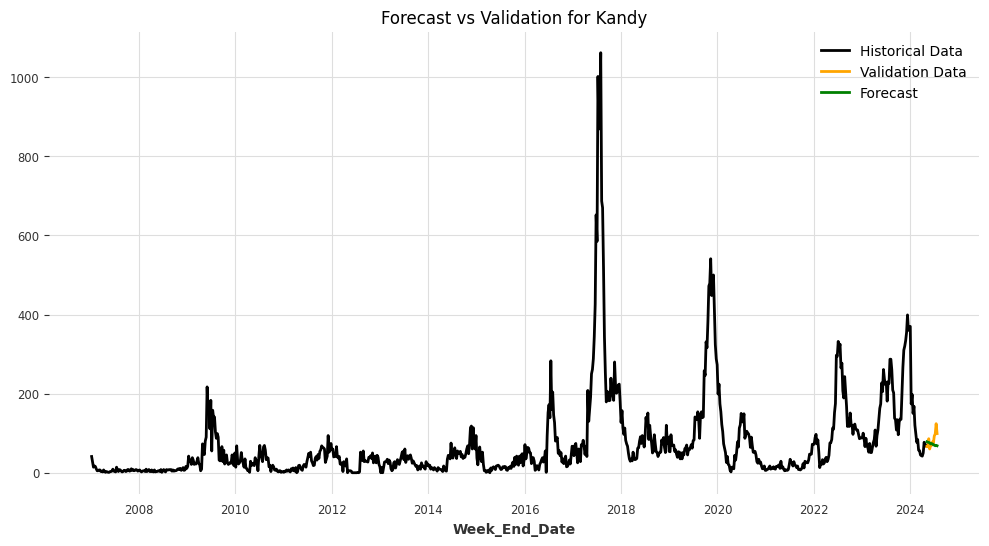

Model saved for /content/drive/MyDrive/Models/Kandy: /content/drive/MyDrive/Models/Kandy_AutoARIMA.pkl


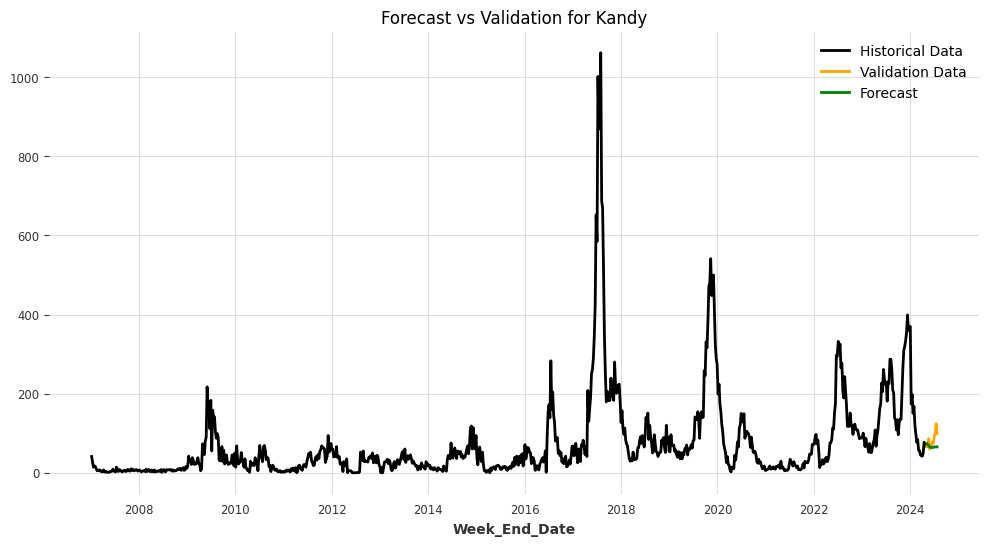

Model saved for /content/drive/MyDrive/Models/Kandy: /content/drive/MyDrive/Models/Kandy_ExponentialSmoothing.pkl


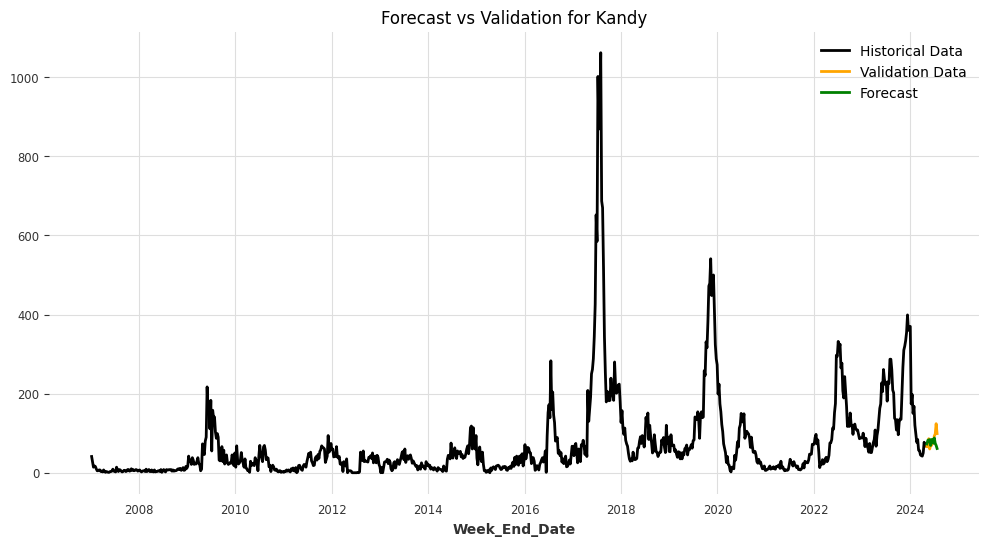

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpokfq9thx/4qzqydy1.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpokfq9thx/op0j72pa.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=85946', 'data', 'file=/tmp/tmpokfq9thx/4qzqydy1.json', 'init=/tmp/tmpokfq9thx/op0j72pa.json', 'output', 'file=/tmp/tmpokfq9thx/prophet_modeli5rgr8xs/prophet_model-20240906025737.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
02:57:37 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
02:57:37 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Model saved for /content/drive/MyDrive/Models/Kandy: /content/drive/MyDrive/Models/Kandy_Prophet.pkl


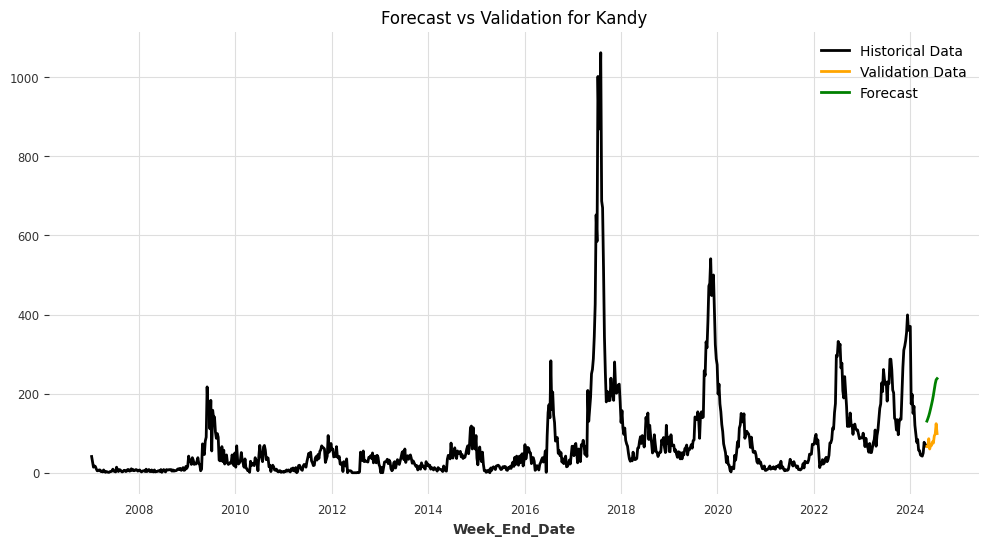

Model saved for /content/drive/MyDrive/Models/Kandy: /content/drive/MyDrive/Models/Kandy_FFT.pkl


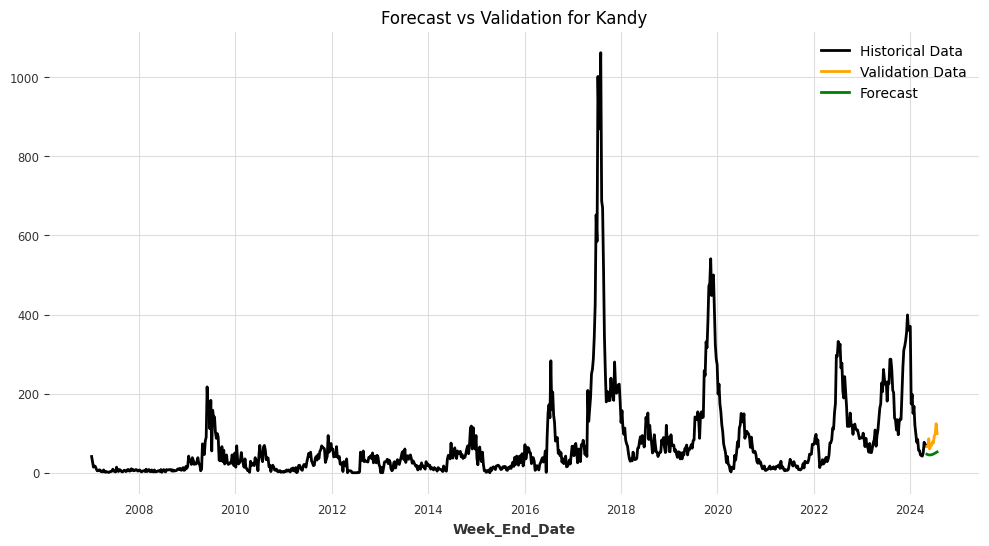

Model saved for /content/drive/MyDrive/Models/Kandy: /content/drive/MyDrive/Models/Kandy_KalmanForecaster.pkl


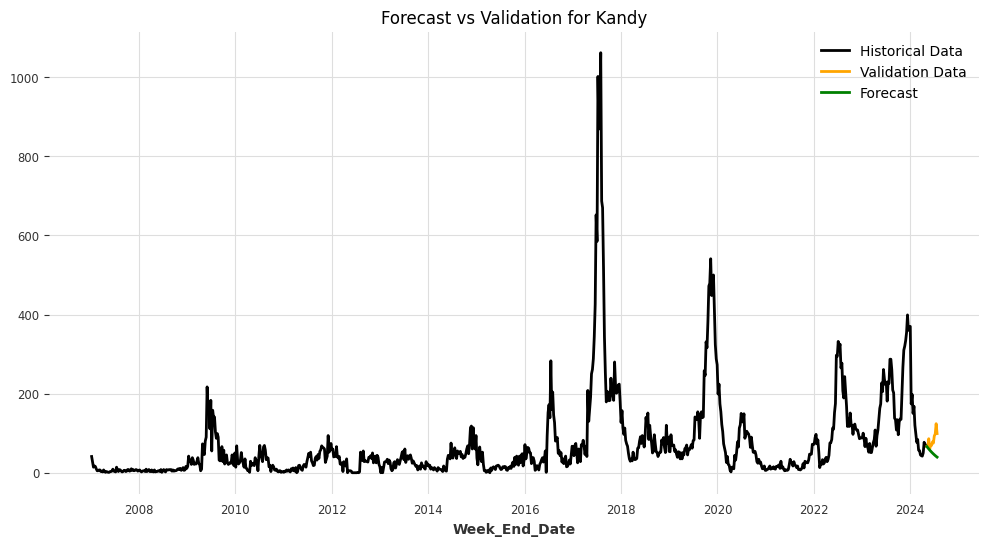

<ipython-input-41-47d63baebb5c>:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Training length: 904
Validation length: 12
Model saved for /content/drive/MyDrive/Models/Kegalle: /content/drive/MyDrive/Models/Kegalle_ARIMA.pkl


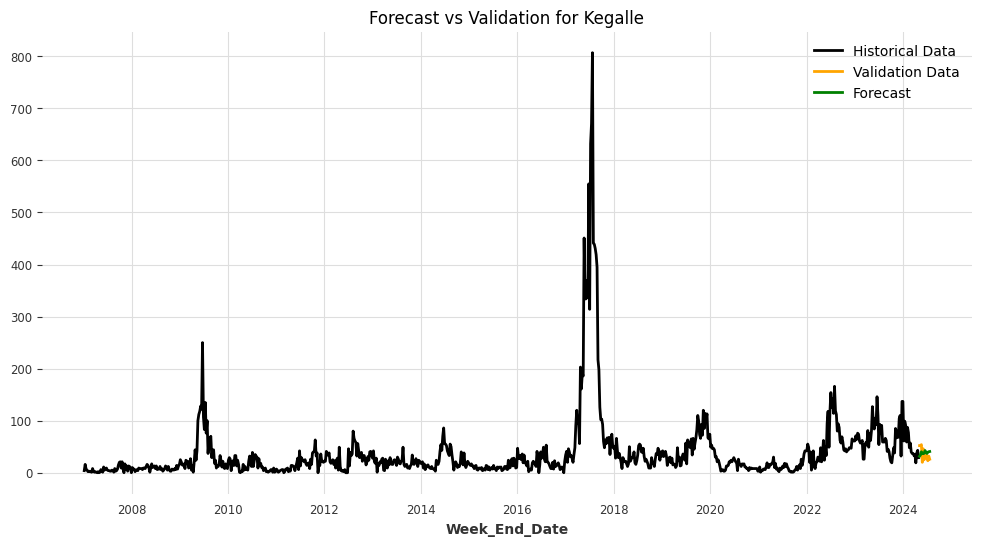

Model saved for /content/drive/MyDrive/Models/Kegalle: /content/drive/MyDrive/Models/Kegalle_AutoARIMA.pkl


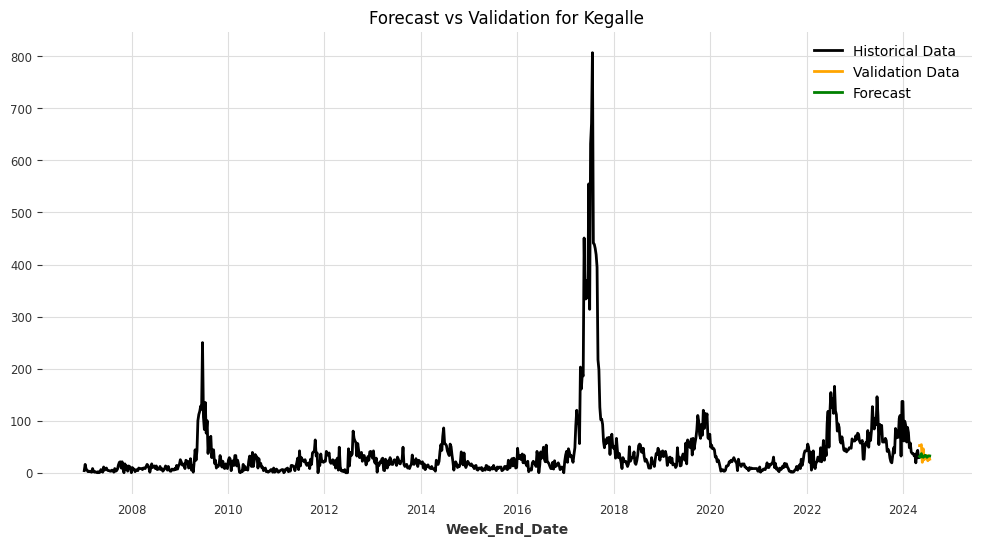

Model saved for /content/drive/MyDrive/Models/Kegalle: /content/drive/MyDrive/Models/Kegalle_ExponentialSmoothing.pkl


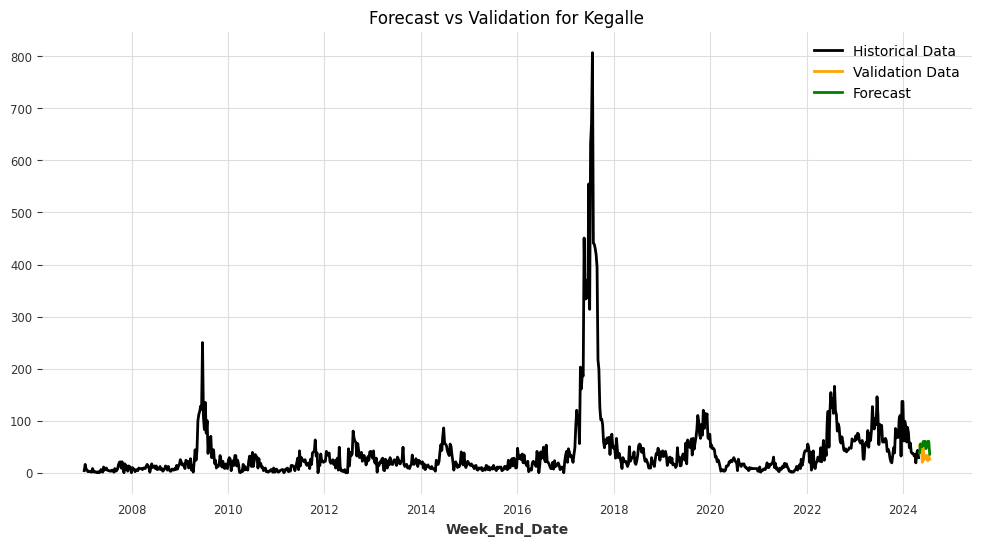

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpokfq9thx/uese0dvf.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpokfq9thx/52p1qbdv.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=14436', 'data', 'file=/tmp/tmpokfq9thx/uese0dvf.json', 'init=/tmp/tmpokfq9thx/52p1qbdv.json', 'output', 'file=/tmp/tmpokfq9thx/prophet_modeljg4vhjs7/prophet_model-20240906025849.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
02:58:49 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
02:58:49 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Model saved for /content/drive/MyDrive/Models/Kegalle: /content/drive/MyDrive/Models/Kegalle_Prophet.pkl


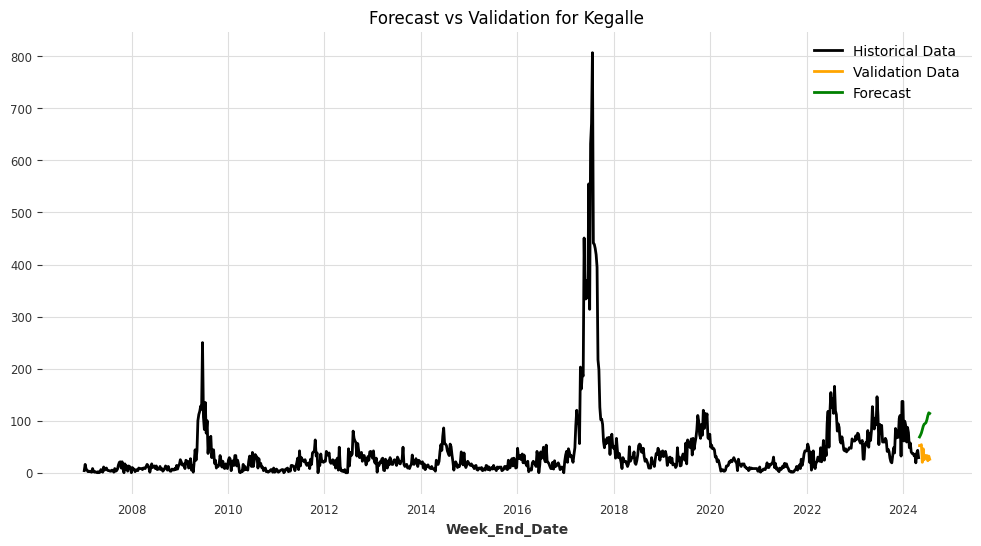

Model saved for /content/drive/MyDrive/Models/Kegalle: /content/drive/MyDrive/Models/Kegalle_FFT.pkl


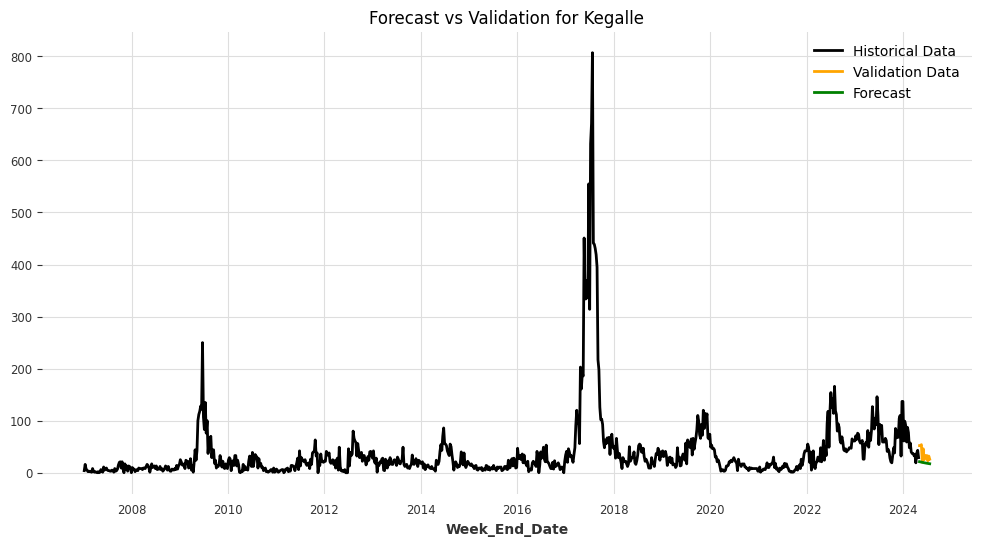

Model saved for /content/drive/MyDrive/Models/Kegalle: /content/drive/MyDrive/Models/Kegalle_KalmanForecaster.pkl


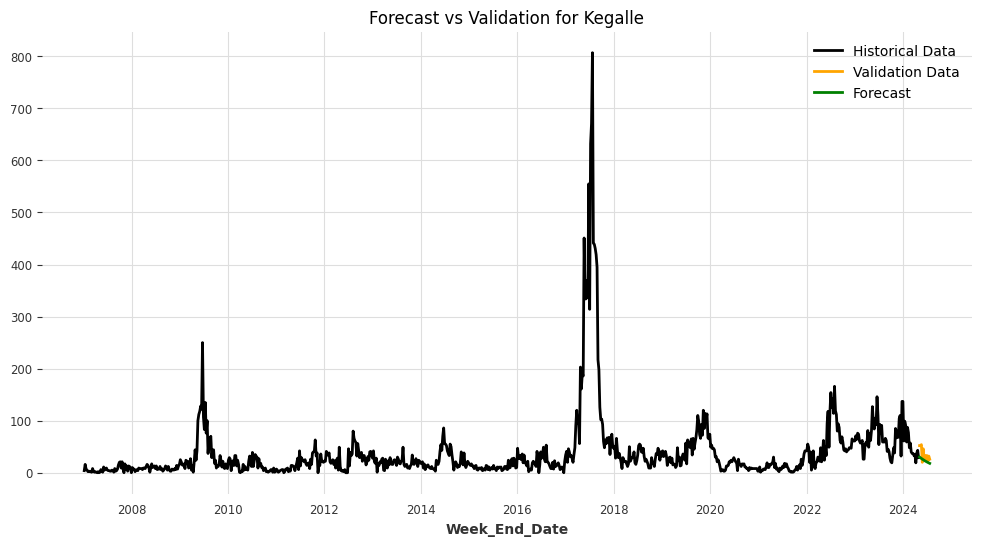

<ipython-input-41-47d63baebb5c>:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Training length: 904
Validation length: 12
Model saved for /content/drive/MyDrive/Models/Kilinochchi: /content/drive/MyDrive/Models/Kilinochchi_ARIMA.pkl


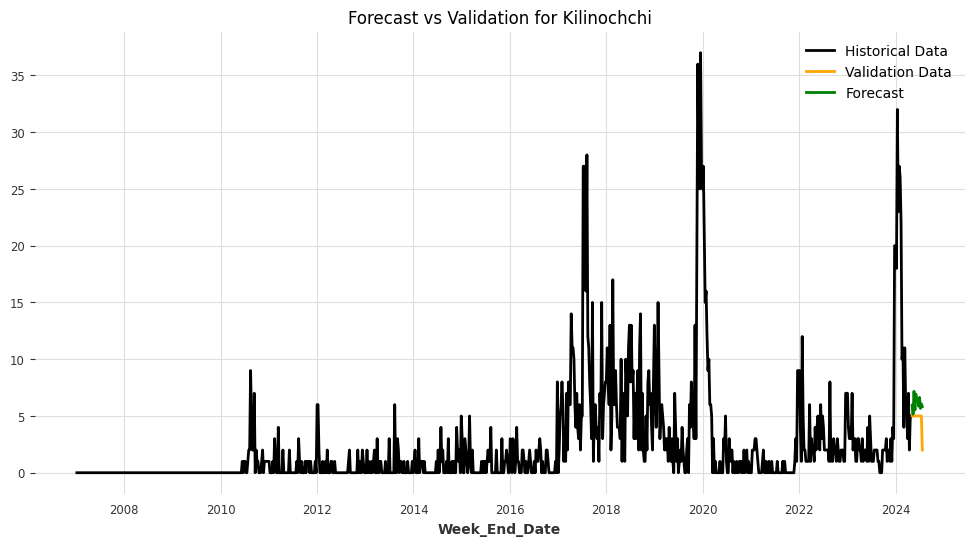

Model saved for /content/drive/MyDrive/Models/Kilinochchi: /content/drive/MyDrive/Models/Kilinochchi_AutoARIMA.pkl


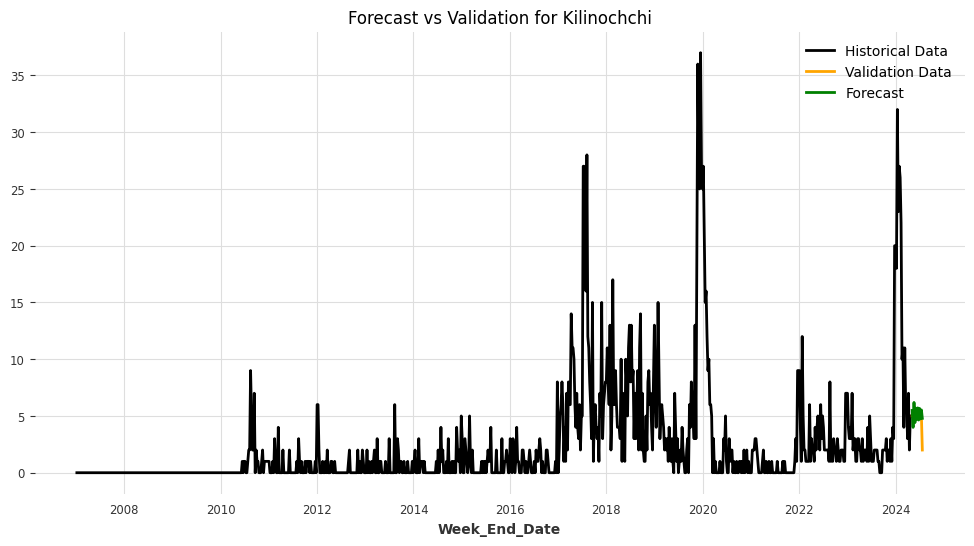

Model saved for /content/drive/MyDrive/Models/Kilinochchi: /content/drive/MyDrive/Models/Kilinochchi_ExponentialSmoothing.pkl


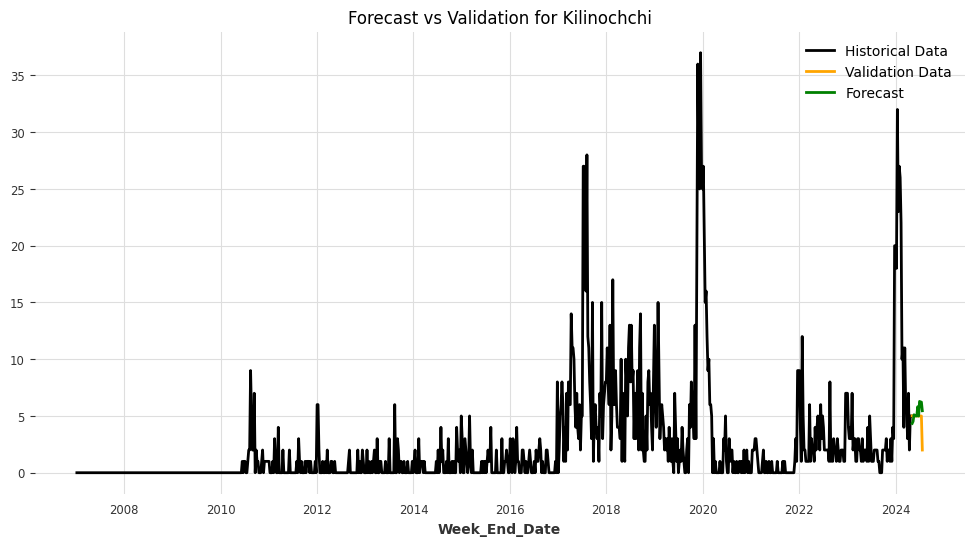

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpokfq9thx/d8j6t_43.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpokfq9thx/5_39pqe6.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=97635', 'data', 'file=/tmp/tmpokfq9thx/d8j6t_43.json', 'init=/tmp/tmpokfq9thx/5_39pqe6.json', 'output', 'file=/tmp/tmpokfq9thx/prophet_model_5svcd59/prophet_model-20240906025942.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
02:59:42 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
02:59:42 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Model saved for /content/drive/MyDrive/Models/Kilinochchi: /content/drive/MyDrive/Models/Kilinochchi_Prophet.pkl


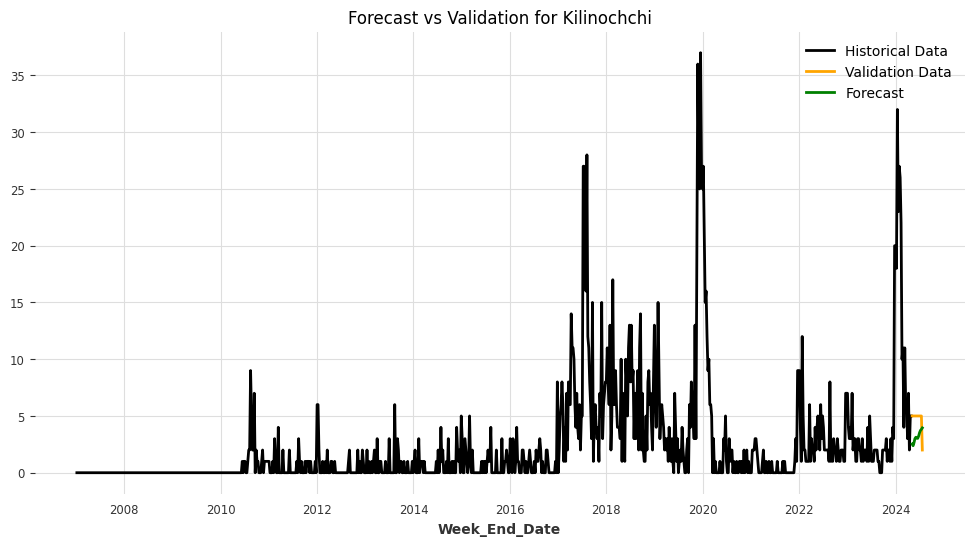

Model saved for /content/drive/MyDrive/Models/Kilinochchi: /content/drive/MyDrive/Models/Kilinochchi_FFT.pkl


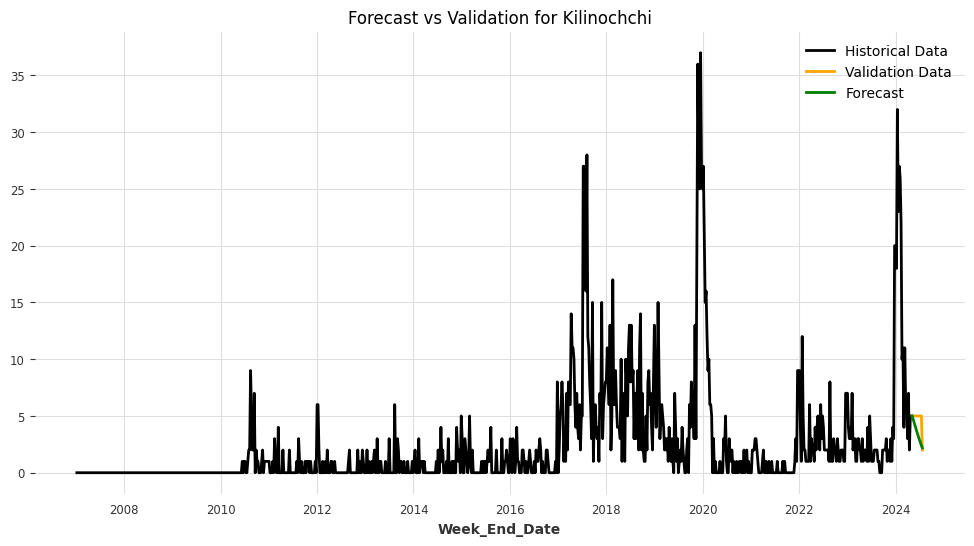

Model saved for /content/drive/MyDrive/Models/Kilinochchi: /content/drive/MyDrive/Models/Kilinochchi_KalmanForecaster.pkl


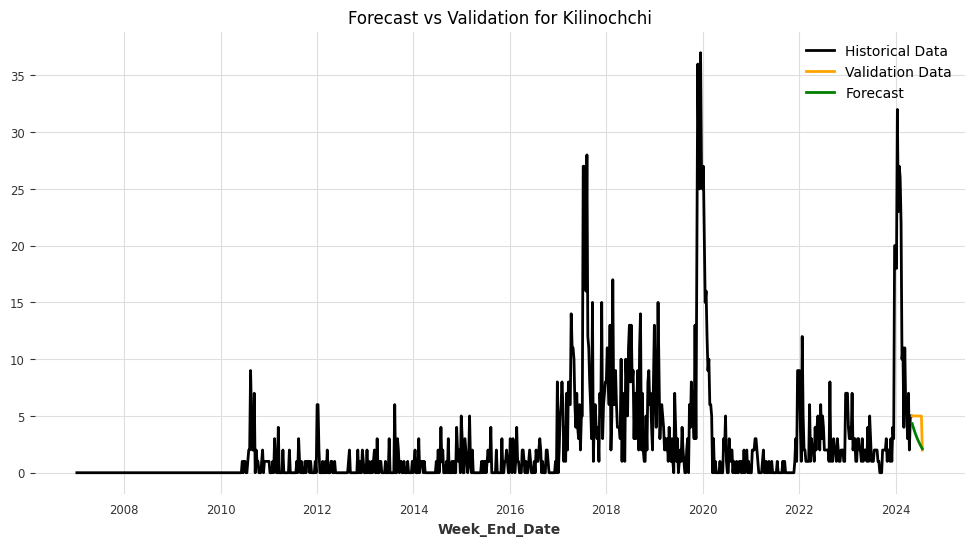

<ipython-input-41-47d63baebb5c>:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Training length: 904
Validation length: 12
Model saved for /content/drive/MyDrive/Models/Kurunegala: /content/drive/MyDrive/Models/Kurunegala_ARIMA.pkl


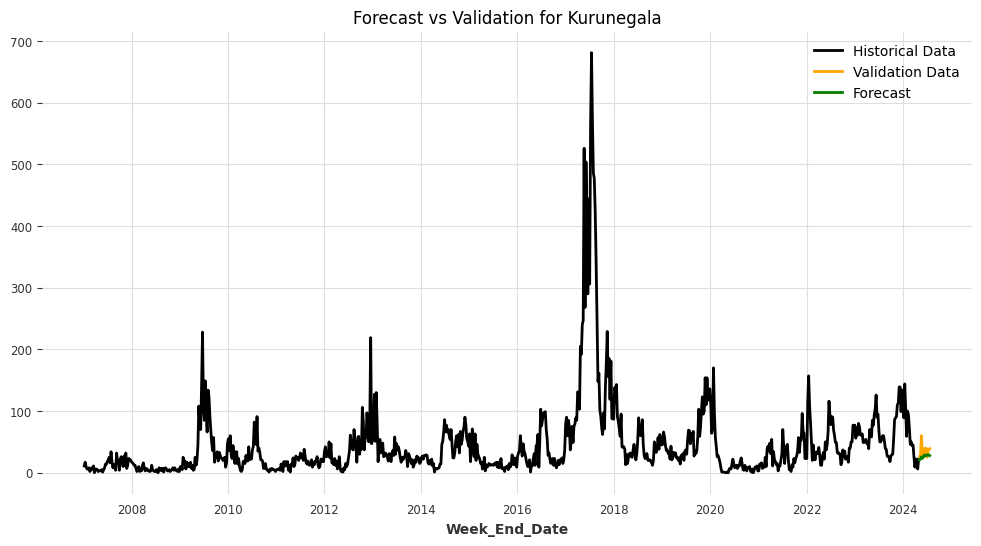

Model saved for /content/drive/MyDrive/Models/Kurunegala: /content/drive/MyDrive/Models/Kurunegala_AutoARIMA.pkl


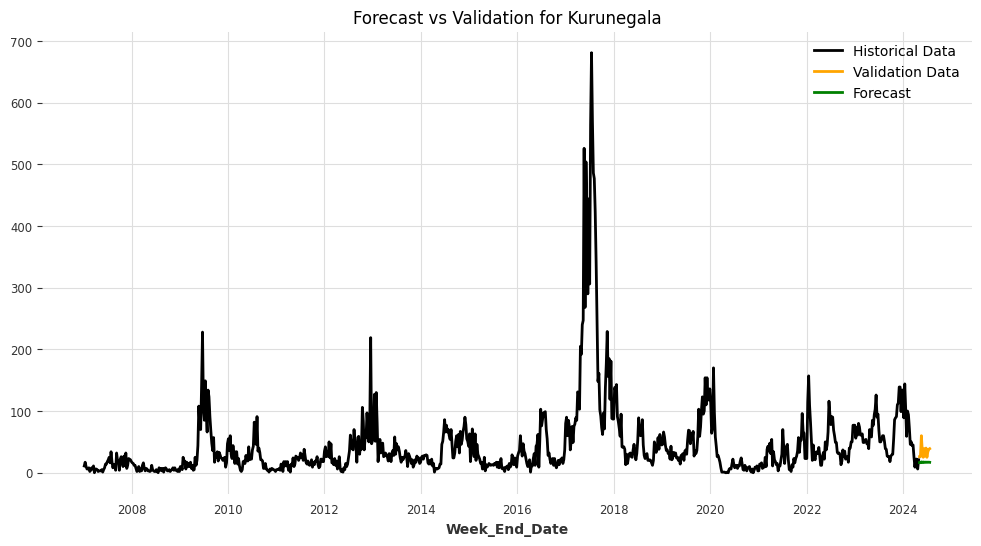

Model saved for /content/drive/MyDrive/Models/Kurunegala: /content/drive/MyDrive/Models/Kurunegala_ExponentialSmoothing.pkl


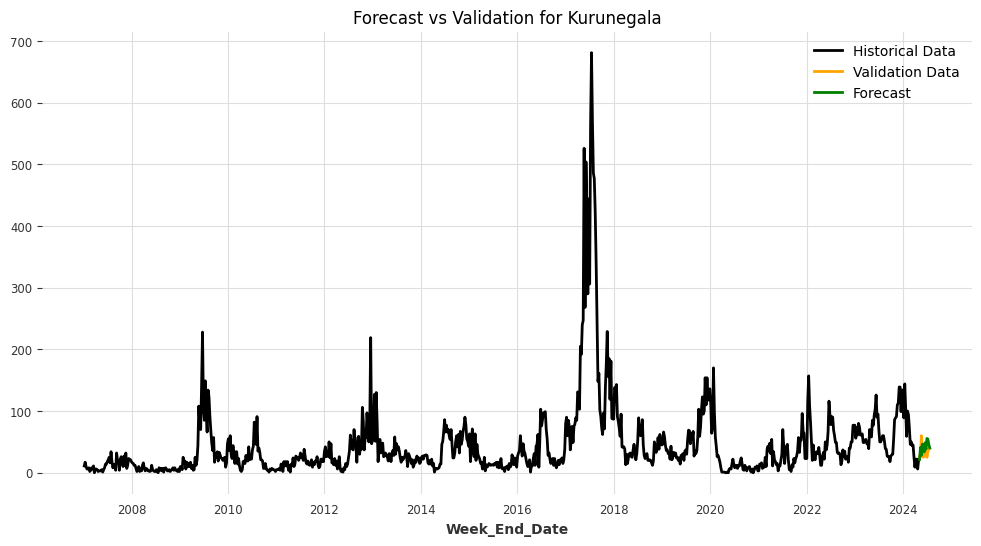

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpokfq9thx/7o3224ae.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpokfq9thx/dg98payd.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=66914', 'data', 'file=/tmp/tmpokfq9thx/7o3224ae.json', 'init=/tmp/tmpokfq9thx/dg98payd.json', 'output', 'file=/tmp/tmpokfq9thx/prophet_model5yyd36e5/prophet_model-20240906030007.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
03:00:07 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
03:00:07 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Model saved for /content/drive/MyDrive/Models/Kurunegala: /content/drive/MyDrive/Models/Kurunegala_Prophet.pkl


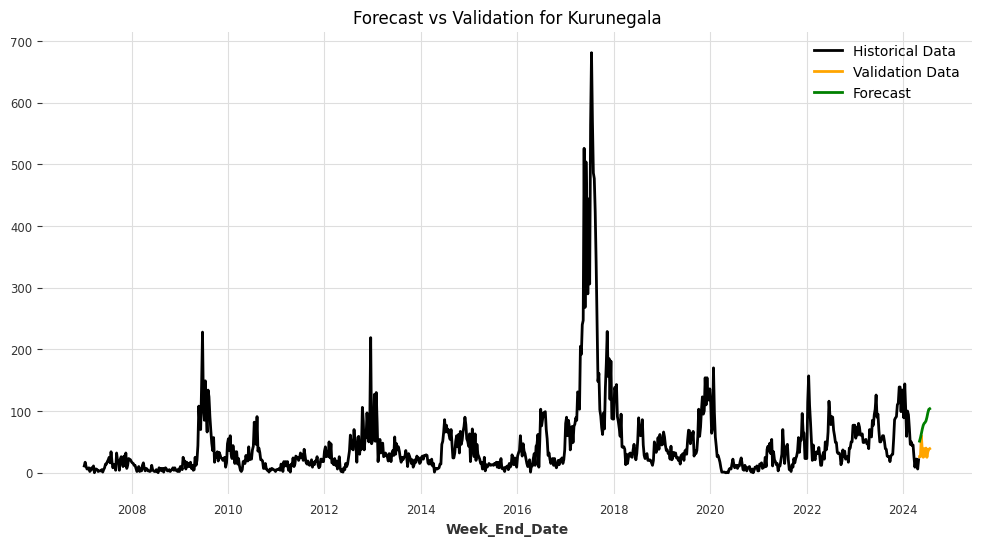

Model saved for /content/drive/MyDrive/Models/Kurunegala: /content/drive/MyDrive/Models/Kurunegala_FFT.pkl


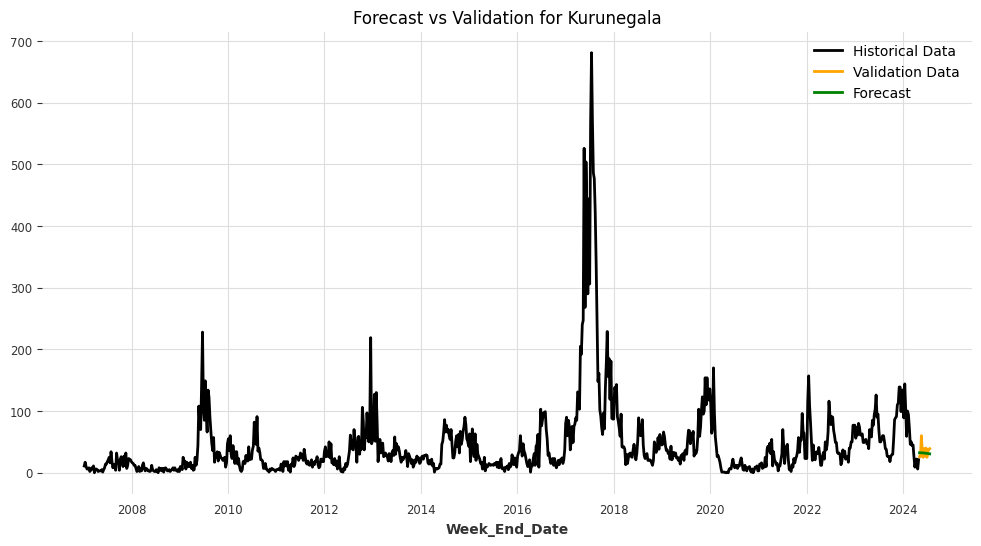

Model saved for /content/drive/MyDrive/Models/Kurunegala: /content/drive/MyDrive/Models/Kurunegala_KalmanForecaster.pkl


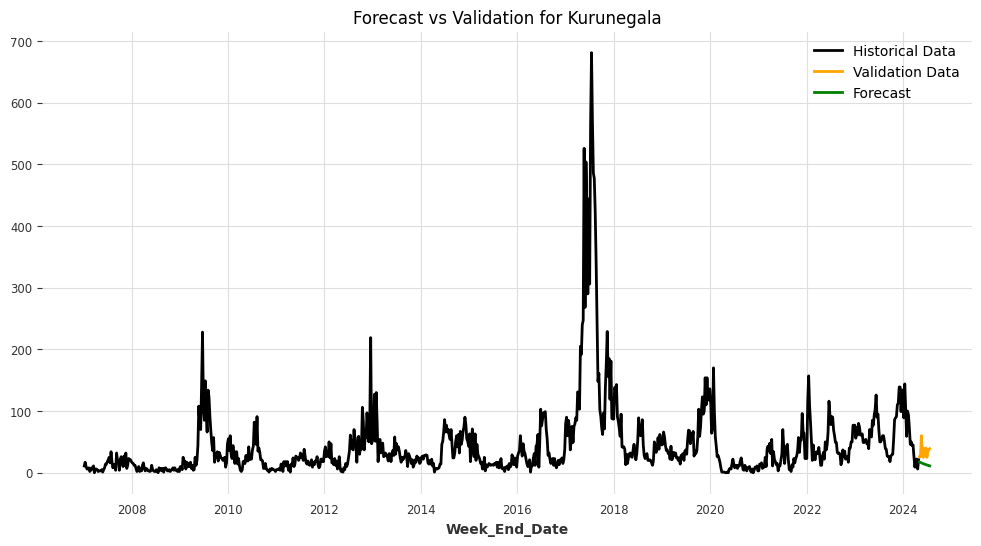

<ipython-input-41-47d63baebb5c>:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Training length: 904
Validation length: 12
Model saved for /content/drive/MyDrive/Models/Mannar: /content/drive/MyDrive/Models/Mannar_ARIMA.pkl


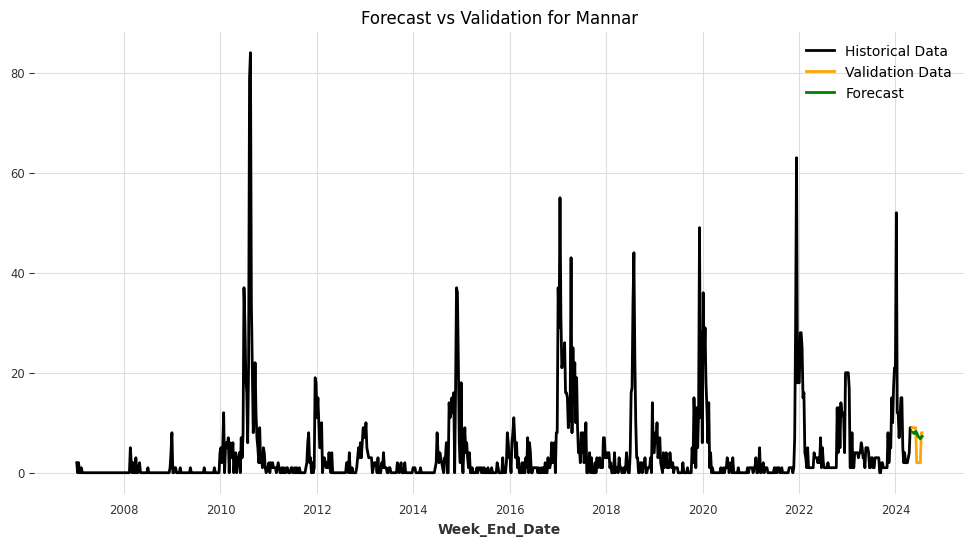

Model saved for /content/drive/MyDrive/Models/Mannar: /content/drive/MyDrive/Models/Mannar_AutoARIMA.pkl


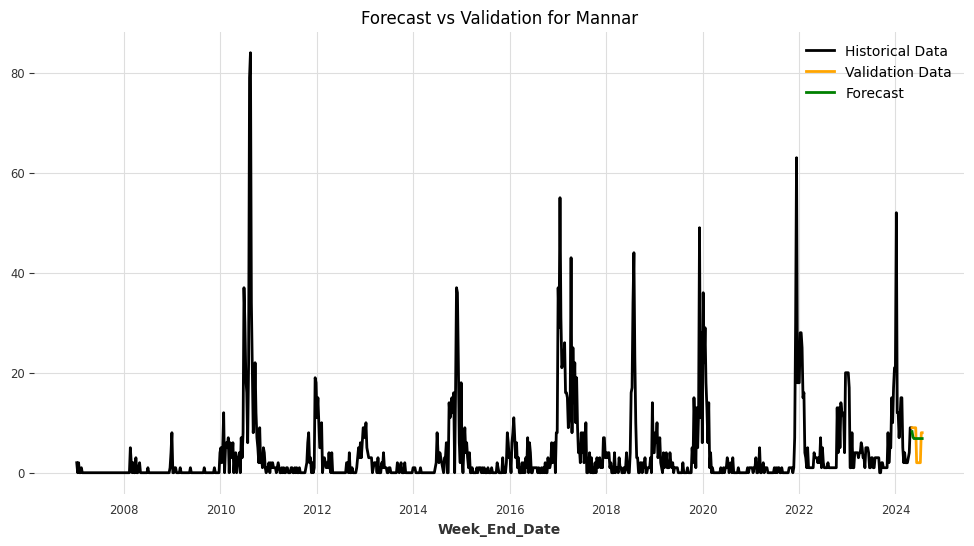

Model saved for /content/drive/MyDrive/Models/Mannar: /content/drive/MyDrive/Models/Mannar_ExponentialSmoothing.pkl


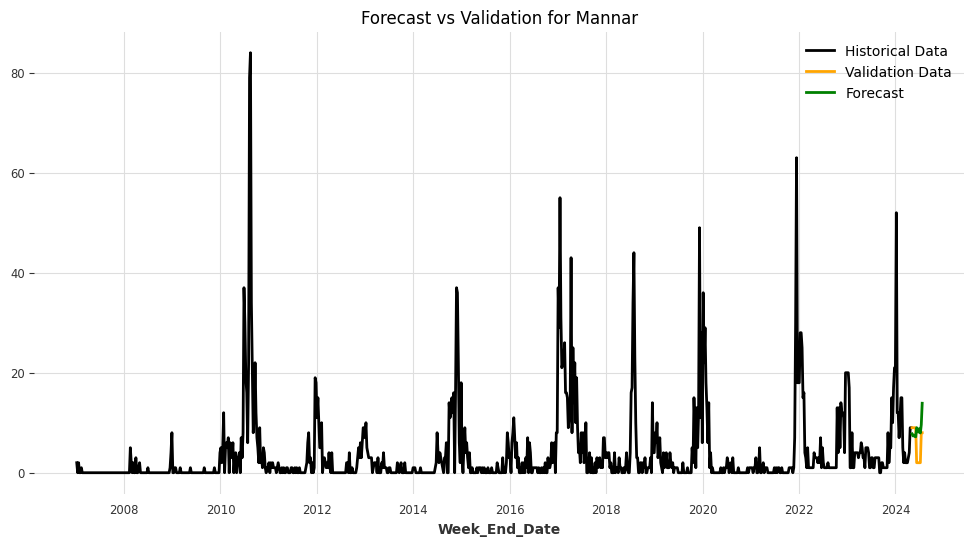

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpokfq9thx/kbonhvkt.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpokfq9thx/1xr9gqhi.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=7817', 'data', 'file=/tmp/tmpokfq9thx/kbonhvkt.json', 'init=/tmp/tmpokfq9thx/1xr9gqhi.json', 'output', 'file=/tmp/tmpokfq9thx/prophet_modelu16jnhma/prophet_model-20240906030031.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
03:00:31 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
03:00:31 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Model saved for /content/drive/MyDrive/Models/Mannar: /content/drive/MyDrive/Models/Mannar_Prophet.pkl


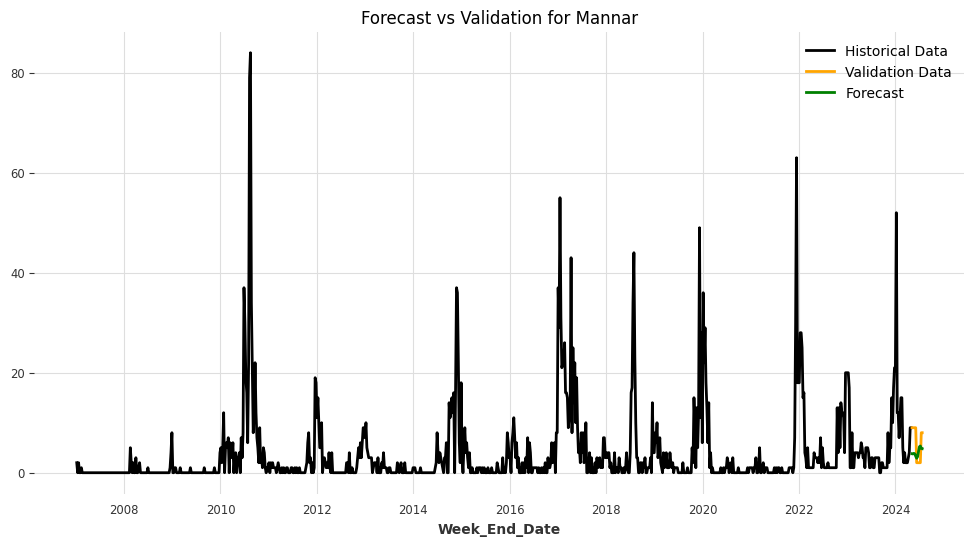

Model saved for /content/drive/MyDrive/Models/Mannar: /content/drive/MyDrive/Models/Mannar_FFT.pkl


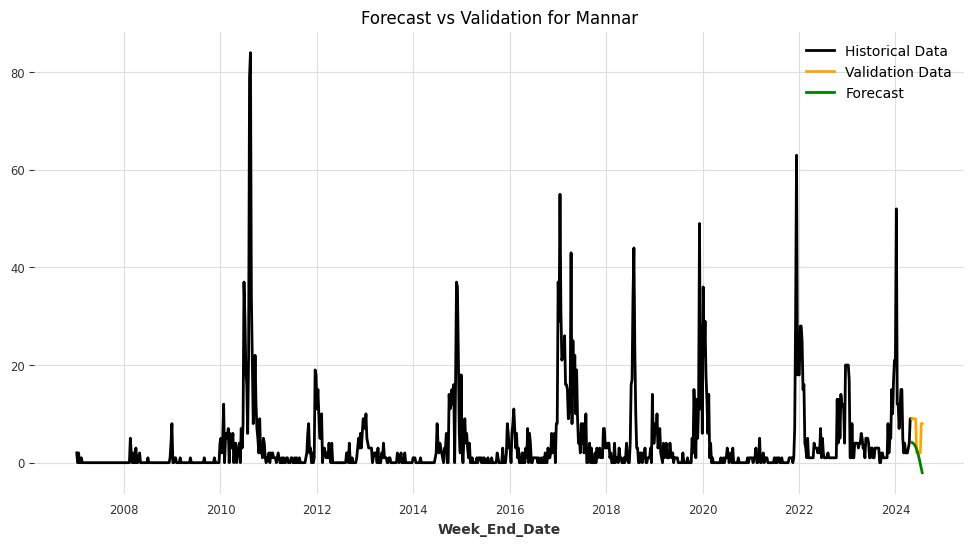

/usr/local/lib/python3.10/dist-packages/darts/metrics/metrics.py:1647: RuntimeWarning:

invalid value encountered in log



Model saved for /content/drive/MyDrive/Models/Mannar: /content/drive/MyDrive/Models/Mannar_KalmanForecaster.pkl


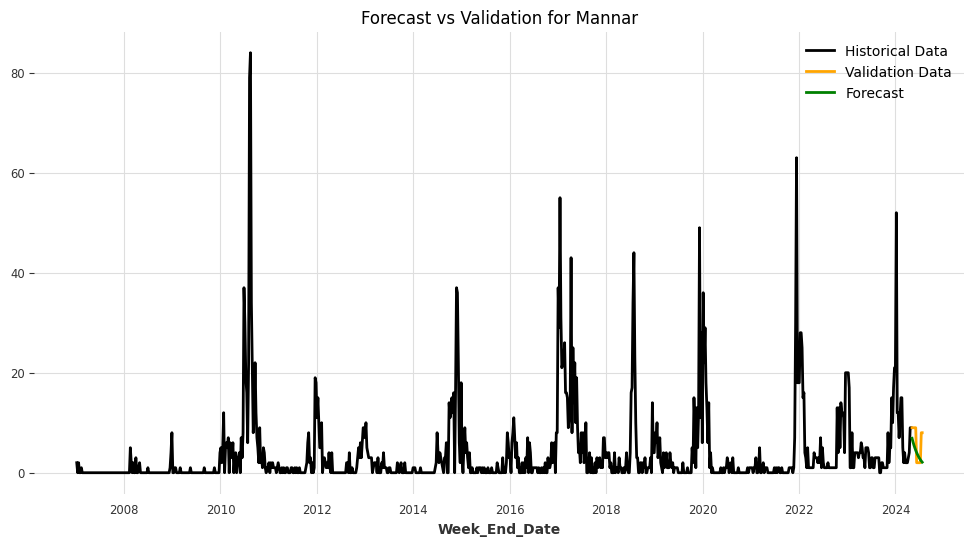

<ipython-input-41-47d63baebb5c>:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Training length: 904
Validation length: 12
Model saved for /content/drive/MyDrive/Models/Matale: /content/drive/MyDrive/Models/Matale_ARIMA.pkl


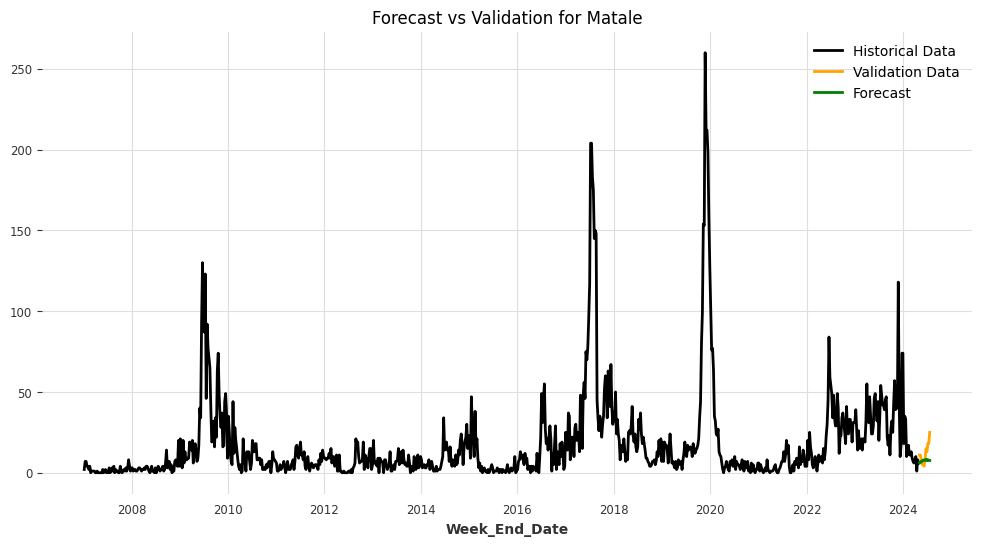

Model saved for /content/drive/MyDrive/Models/Matale: /content/drive/MyDrive/Models/Matale_AutoARIMA.pkl


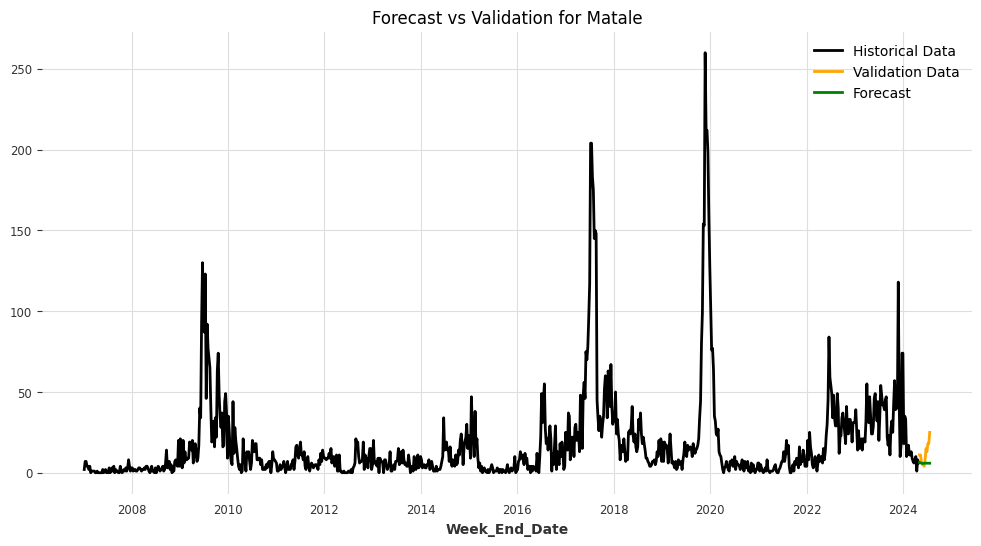

Model saved for /content/drive/MyDrive/Models/Matale: /content/drive/MyDrive/Models/Matale_ExponentialSmoothing.pkl


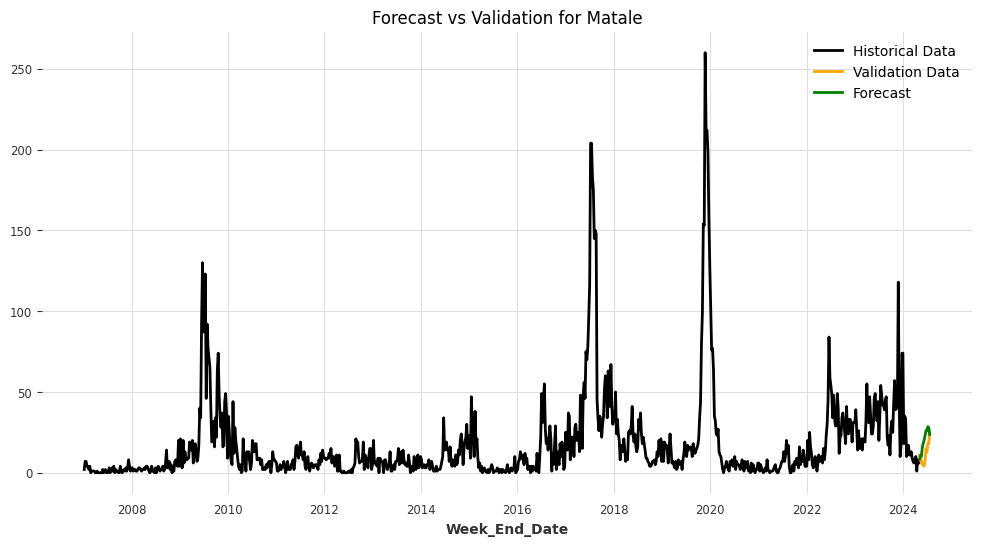

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpokfq9thx/zl0gqd0k.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpokfq9thx/f6b36i7p.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=84181', 'data', 'file=/tmp/tmpokfq9thx/zl0gqd0k.json', 'init=/tmp/tmpokfq9thx/f6b36i7p.json', 'output', 'file=/tmp/tmpokfq9thx/prophet_modelcp93nrpc/prophet_model-20240906030057.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
03:00:57 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
03:00:58 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Model saved for /content/drive/MyDrive/Models/Matale: /content/drive/MyDrive/Models/Matale_Prophet.pkl


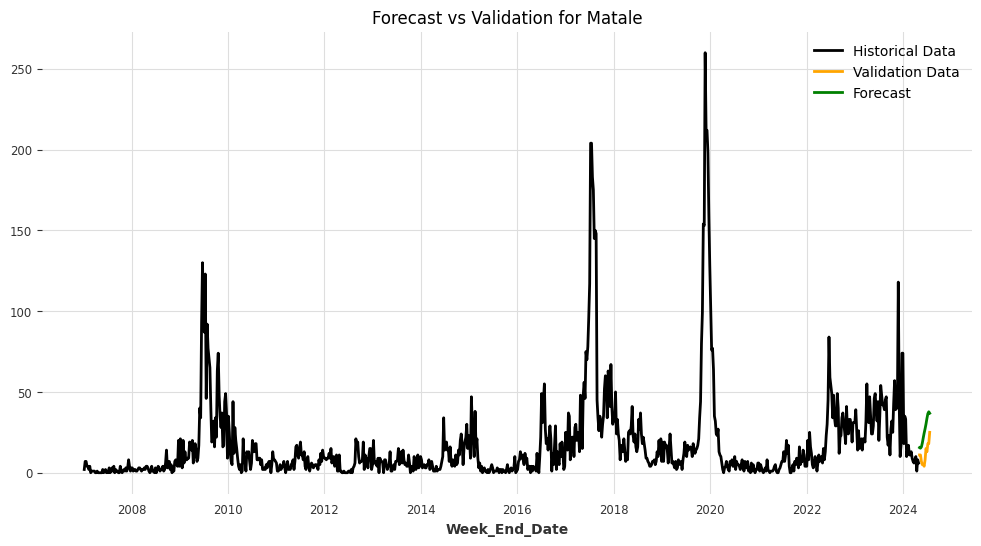

Model saved for /content/drive/MyDrive/Models/Matale: /content/drive/MyDrive/Models/Matale_FFT.pkl


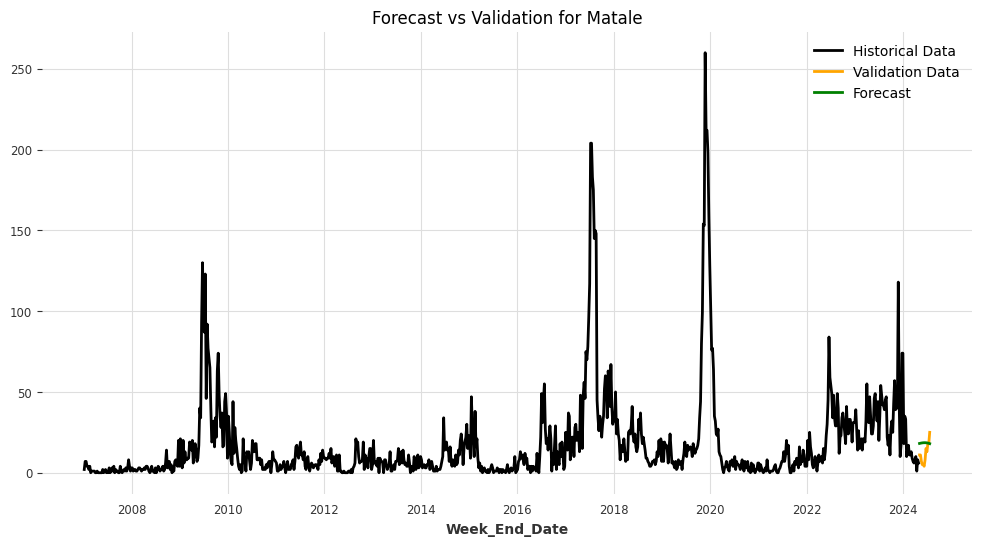

Model saved for /content/drive/MyDrive/Models/Matale: /content/drive/MyDrive/Models/Matale_KalmanForecaster.pkl


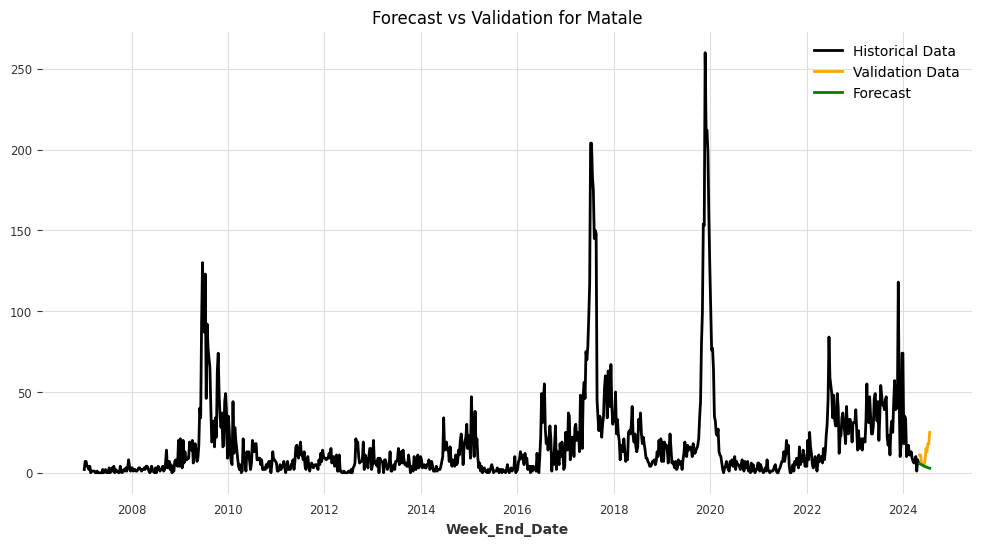

<ipython-input-41-47d63baebb5c>:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Training length: 904
Validation length: 12
Model saved for /content/drive/MyDrive/Models/Matara: /content/drive/MyDrive/Models/Matara_ARIMA.pkl


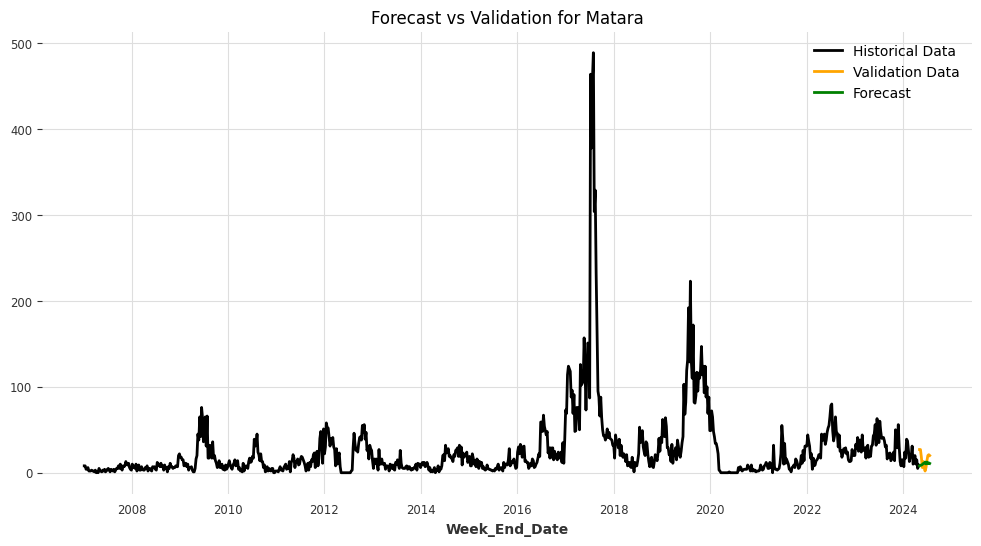

Model saved for /content/drive/MyDrive/Models/Matara: /content/drive/MyDrive/Models/Matara_AutoARIMA.pkl


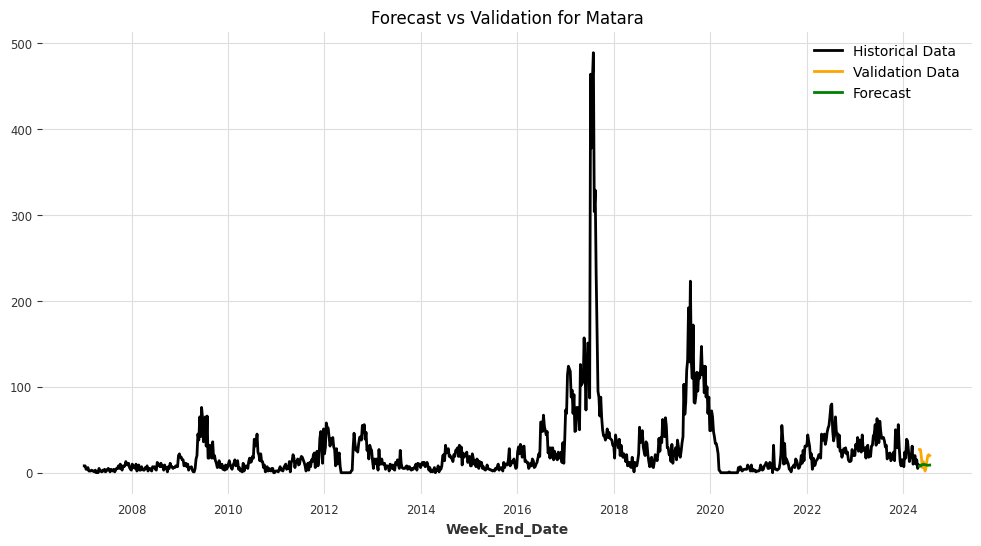

Model saved for /content/drive/MyDrive/Models/Matara: /content/drive/MyDrive/Models/Matara_ExponentialSmoothing.pkl


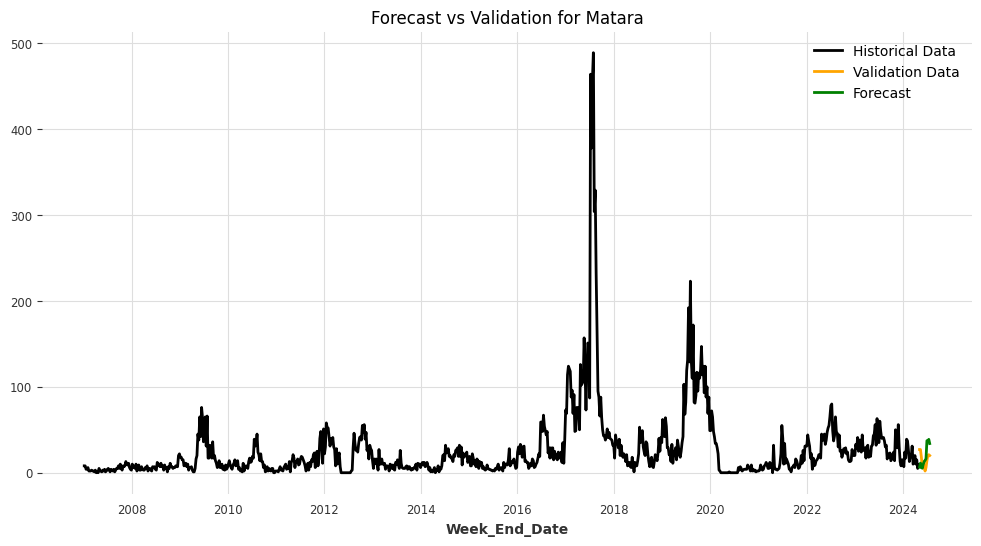

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpokfq9thx/2o8yfm90.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpokfq9thx/2rhcmhol.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=18542', 'data', 'file=/tmp/tmpokfq9thx/2o8yfm90.json', 'init=/tmp/tmpokfq9thx/2rhcmhol.json', 'output', 'file=/tmp/tmpokfq9thx/prophet_model_dbc2hr5/prophet_model-20240906030156.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
03:01:56 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
03:01:56 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Model saved for /content/drive/MyDrive/Models/Matara: /content/drive/MyDrive/Models/Matara_Prophet.pkl


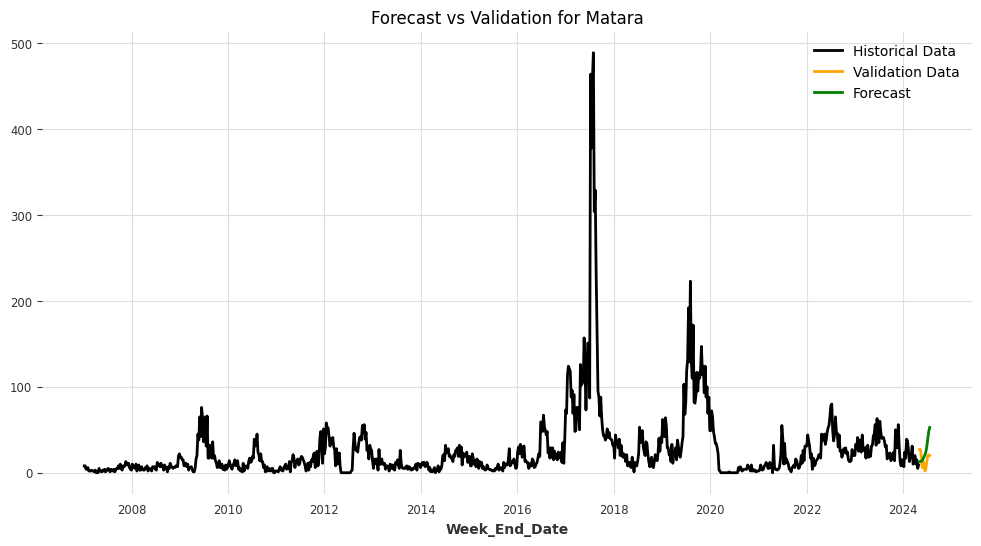

Model saved for /content/drive/MyDrive/Models/Matara: /content/drive/MyDrive/Models/Matara_FFT.pkl


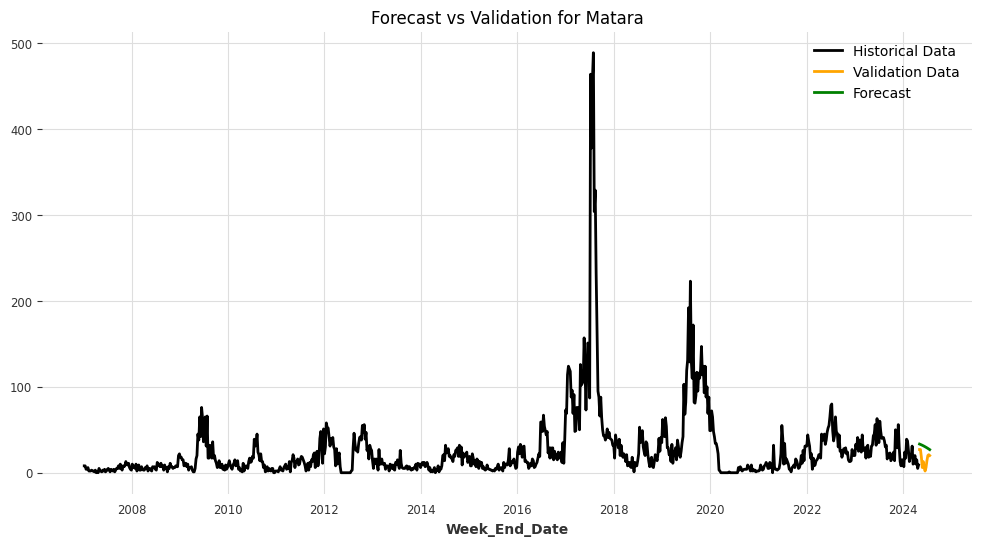

Model saved for /content/drive/MyDrive/Models/Matara: /content/drive/MyDrive/Models/Matara_KalmanForecaster.pkl


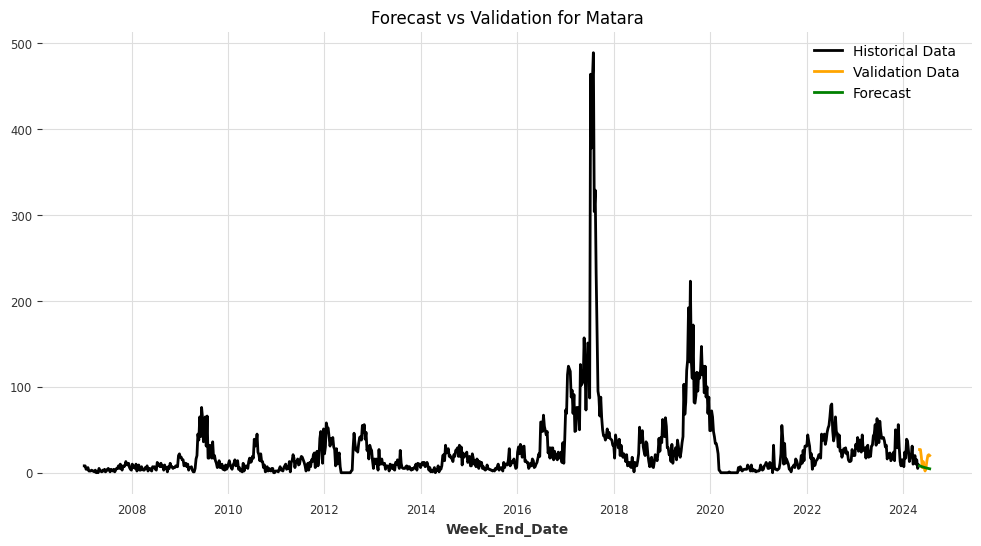

<ipython-input-41-47d63baebb5c>:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Training length: 904
Validation length: 12
Model saved for /content/drive/MyDrive/Models/Monaragala: /content/drive/MyDrive/Models/Monaragala_ARIMA.pkl


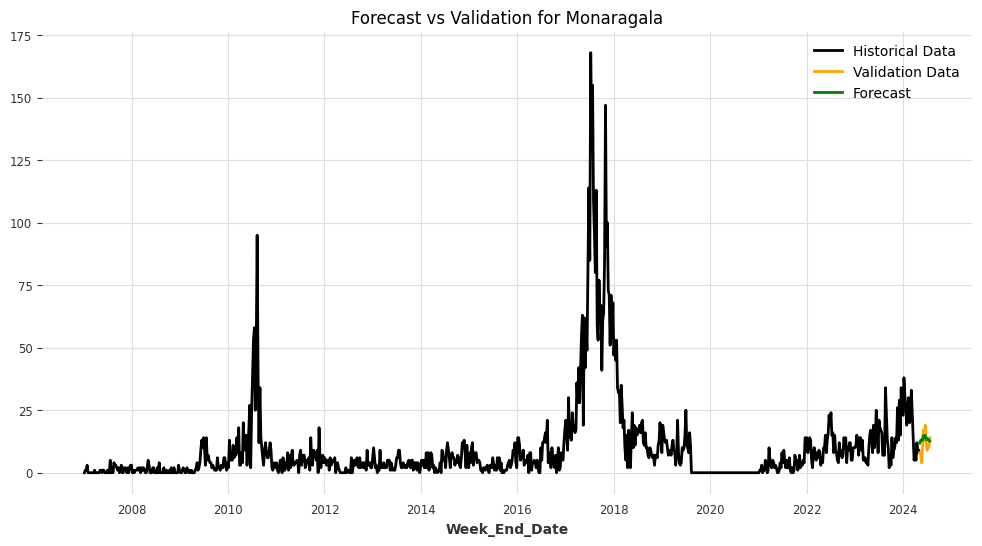

Model saved for /content/drive/MyDrive/Models/Monaragala: /content/drive/MyDrive/Models/Monaragala_AutoARIMA.pkl


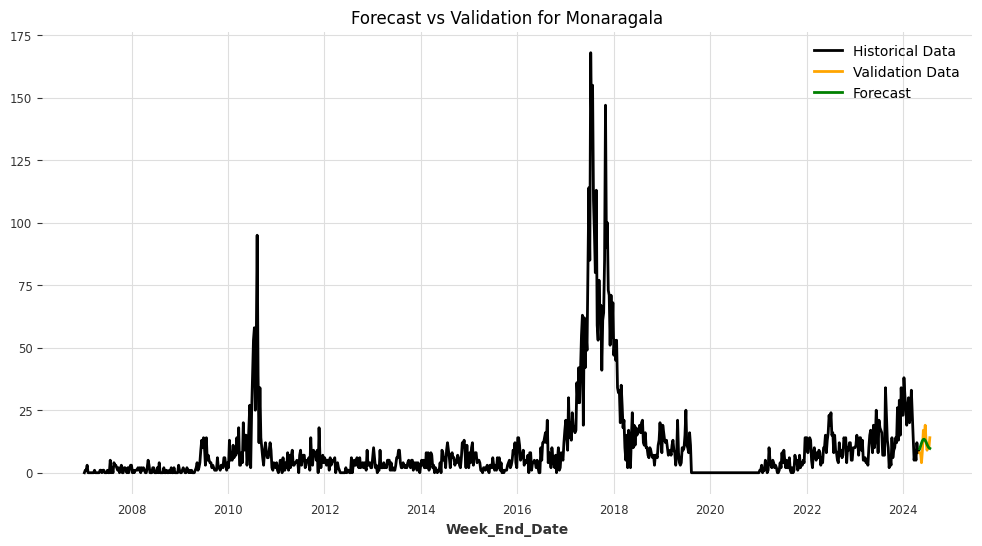

Model saved for /content/drive/MyDrive/Models/Monaragala: /content/drive/MyDrive/Models/Monaragala_ExponentialSmoothing.pkl


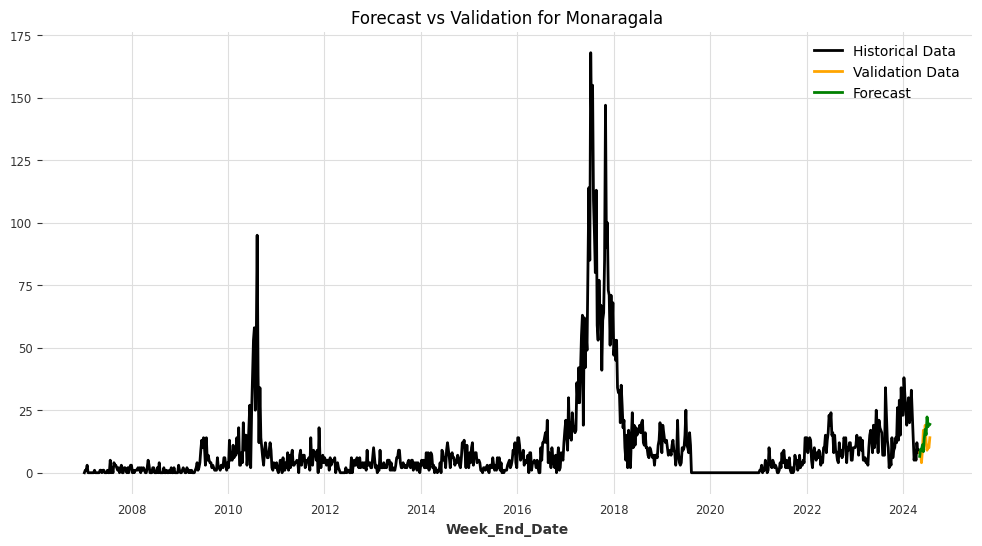

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpokfq9thx/bizlvheg.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpokfq9thx/xlm19ain.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=45936', 'data', 'file=/tmp/tmpokfq9thx/bizlvheg.json', 'init=/tmp/tmpokfq9thx/xlm19ain.json', 'output', 'file=/tmp/tmpokfq9thx/prophet_modelnh7mh4rb/prophet_model-20240906030237.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
03:02:37 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
03:02:37 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Model saved for /content/drive/MyDrive/Models/Monaragala: /content/drive/MyDrive/Models/Monaragala_Prophet.pkl


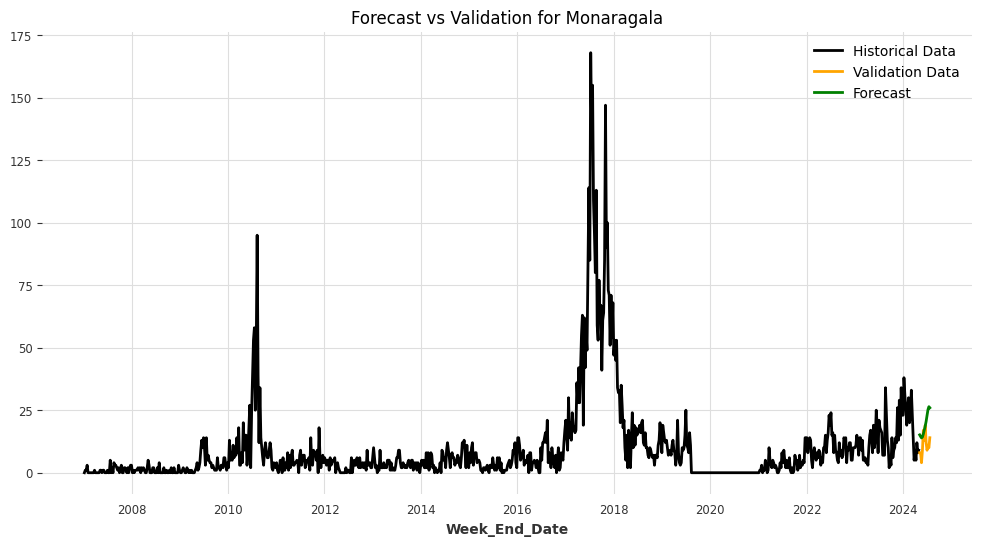

Model saved for /content/drive/MyDrive/Models/Monaragala: /content/drive/MyDrive/Models/Monaragala_FFT.pkl


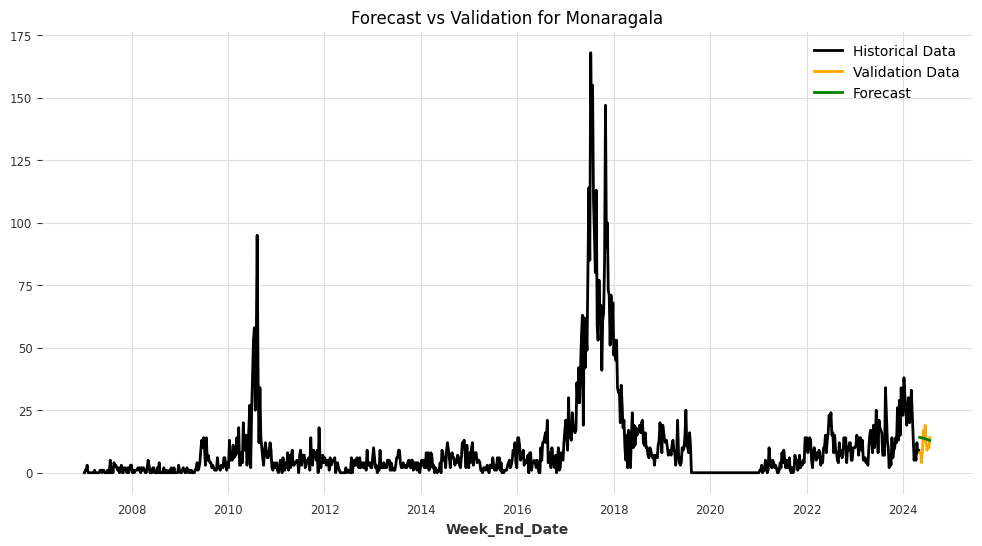

Model saved for /content/drive/MyDrive/Models/Monaragala: /content/drive/MyDrive/Models/Monaragala_KalmanForecaster.pkl


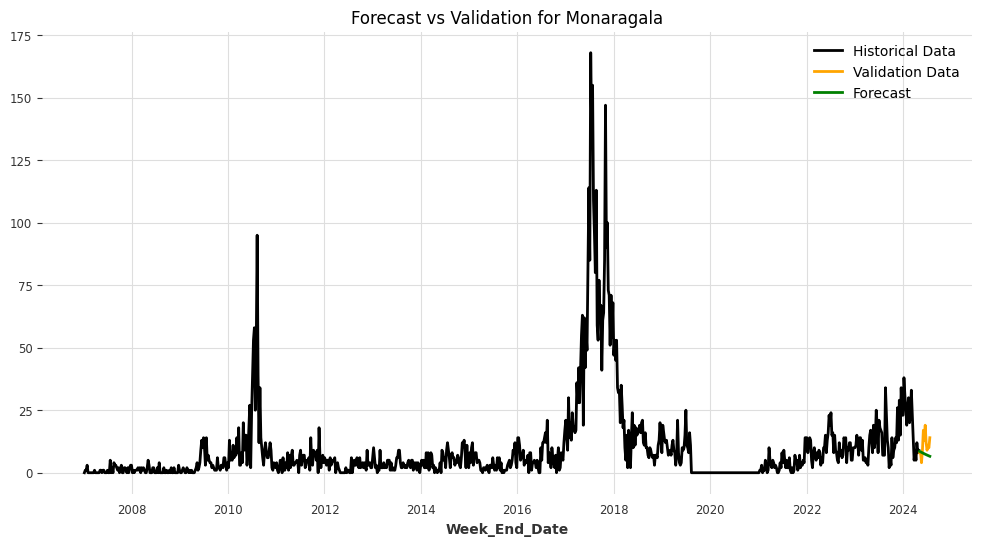

<ipython-input-41-47d63baebb5c>:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Training length: 904
Validation length: 12
Model saved for /content/drive/MyDrive/Models/Mullaitivu: /content/drive/MyDrive/Models/Mullaitivu_ARIMA.pkl


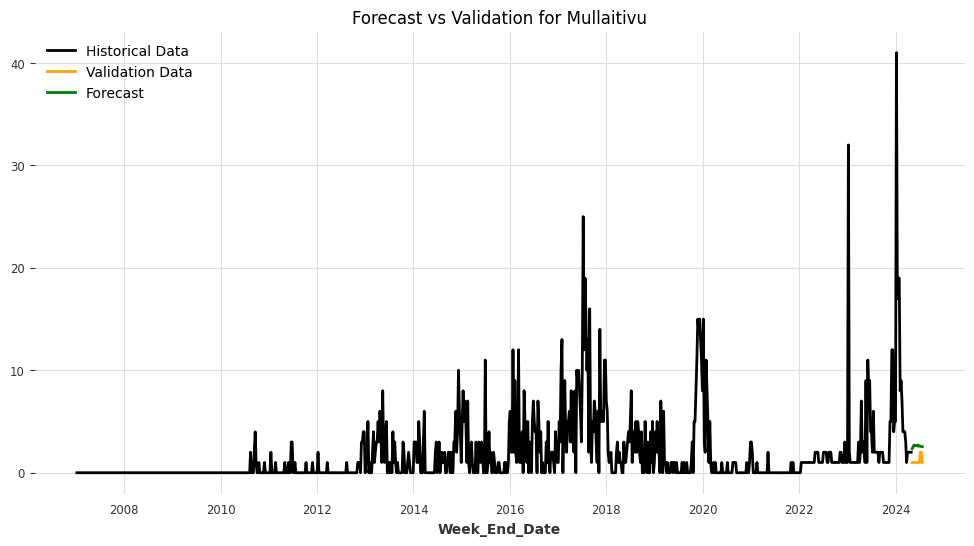

Model saved for /content/drive/MyDrive/Models/Mullaitivu: /content/drive/MyDrive/Models/Mullaitivu_AutoARIMA.pkl


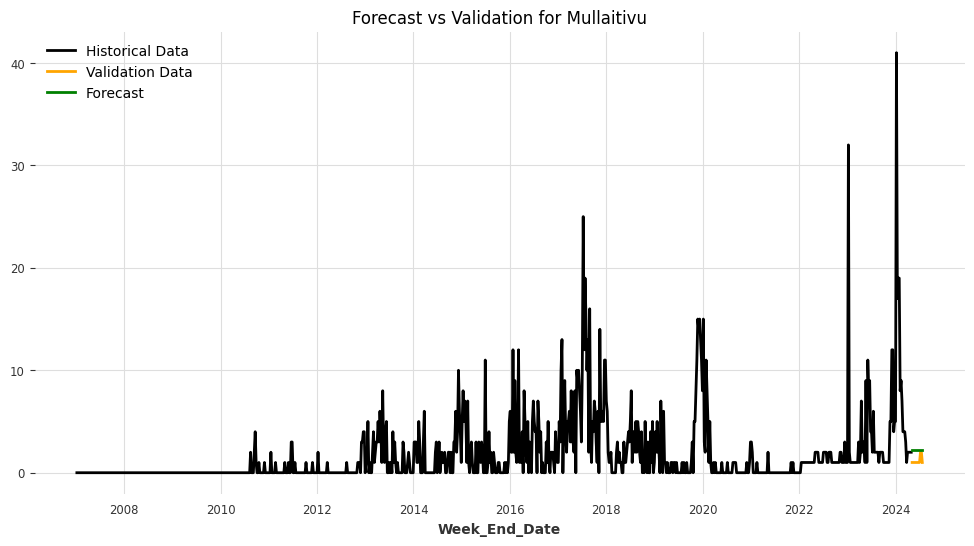

Model saved for /content/drive/MyDrive/Models/Mullaitivu: /content/drive/MyDrive/Models/Mullaitivu_ExponentialSmoothing.pkl


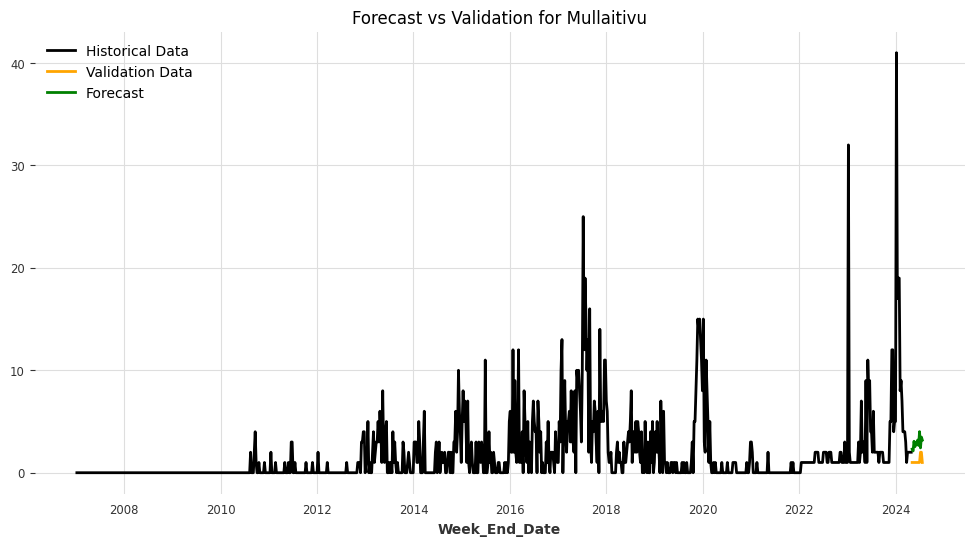

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpokfq9thx/8z625w9p.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpokfq9thx/8kvek5v0.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=69461', 'data', 'file=/tmp/tmpokfq9thx/8z625w9p.json', 'init=/tmp/tmpokfq9thx/8kvek5v0.json', 'output', 'file=/tmp/tmpokfq9thx/prophet_modelm4z70ok6/prophet_model-20240906030252.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
03:02:52 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
03:02:52 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Model saved for /content/drive/MyDrive/Models/Mullaitivu: /content/drive/MyDrive/Models/Mullaitivu_Prophet.pkl


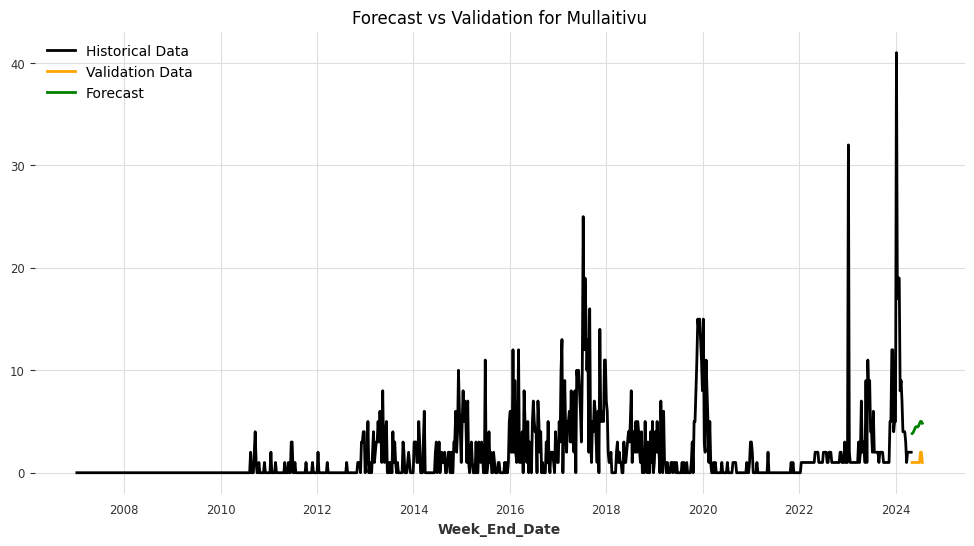

Model saved for /content/drive/MyDrive/Models/Mullaitivu: /content/drive/MyDrive/Models/Mullaitivu_FFT.pkl


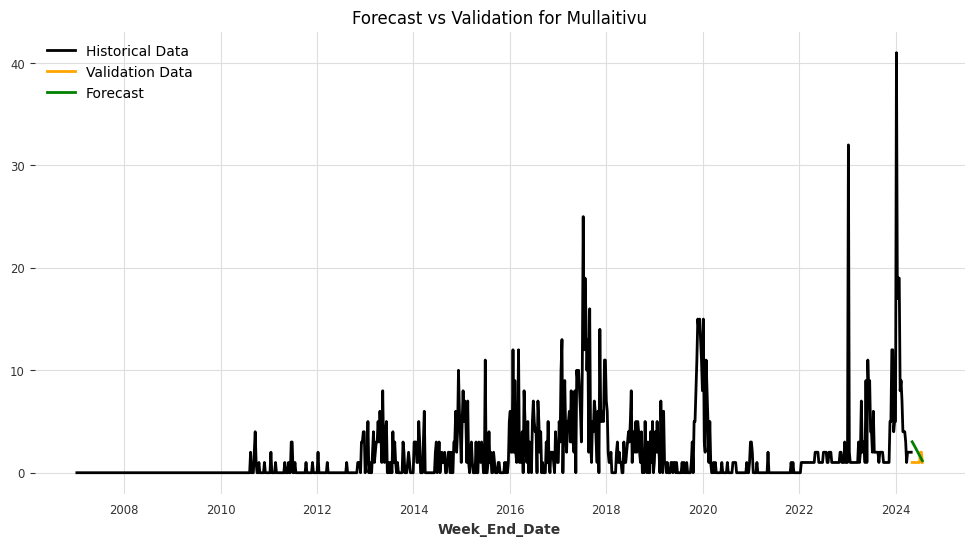

Model saved for /content/drive/MyDrive/Models/Mullaitivu: /content/drive/MyDrive/Models/Mullaitivu_KalmanForecaster.pkl


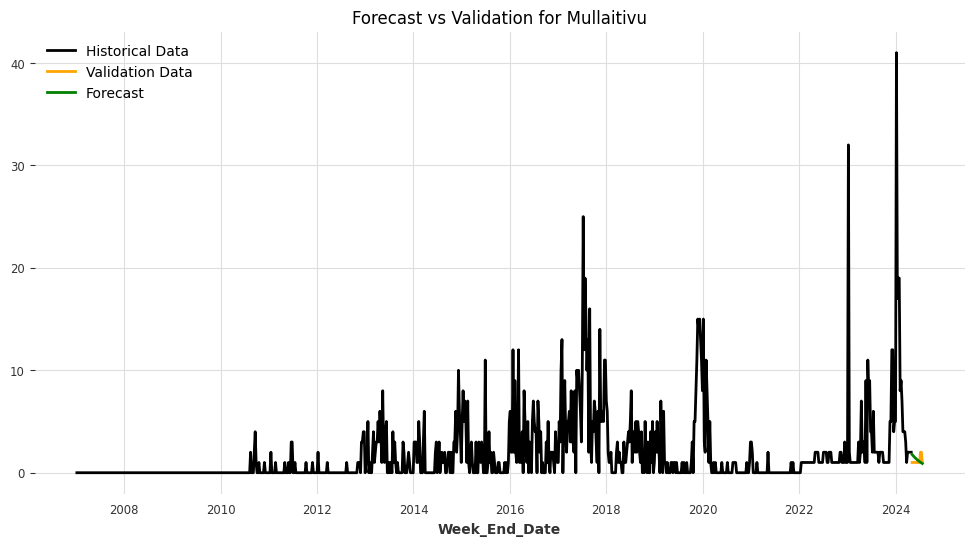

<ipython-input-41-47d63baebb5c>:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Training length: 904
Validation length: 12
Model saved for /content/drive/MyDrive/Models/NuwaraEliya: /content/drive/MyDrive/Models/NuwaraEliya_ARIMA.pkl


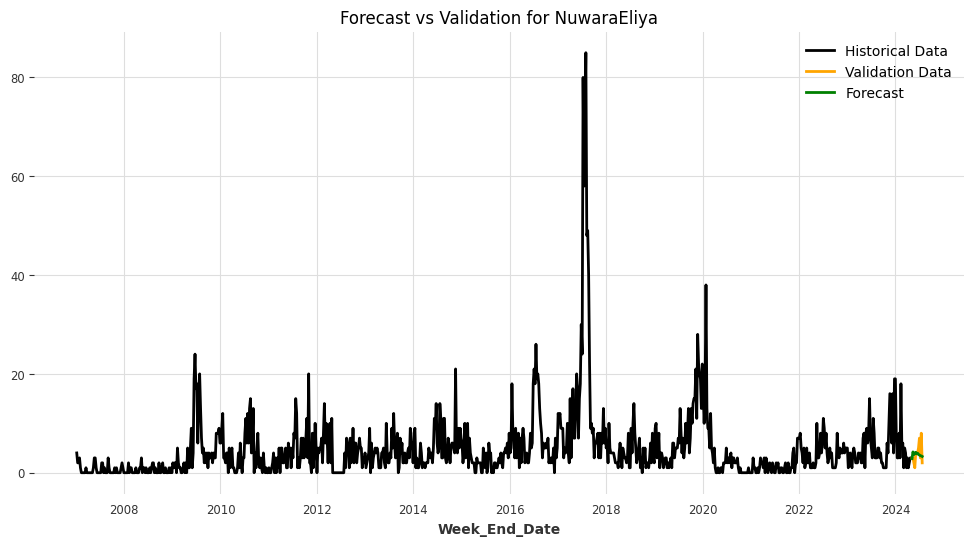

Model saved for /content/drive/MyDrive/Models/NuwaraEliya: /content/drive/MyDrive/Models/NuwaraEliya_AutoARIMA.pkl


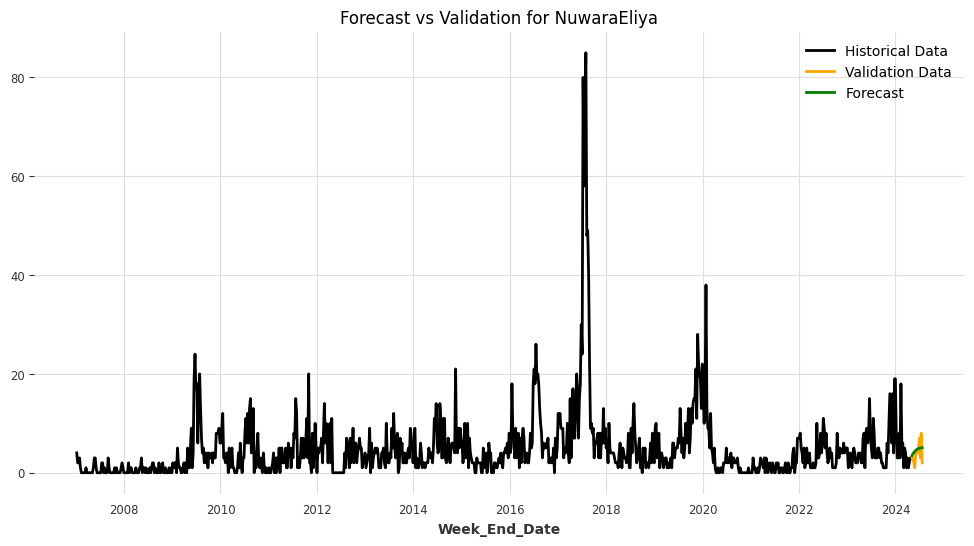

Model saved for /content/drive/MyDrive/Models/NuwaraEliya: /content/drive/MyDrive/Models/NuwaraEliya_ExponentialSmoothing.pkl


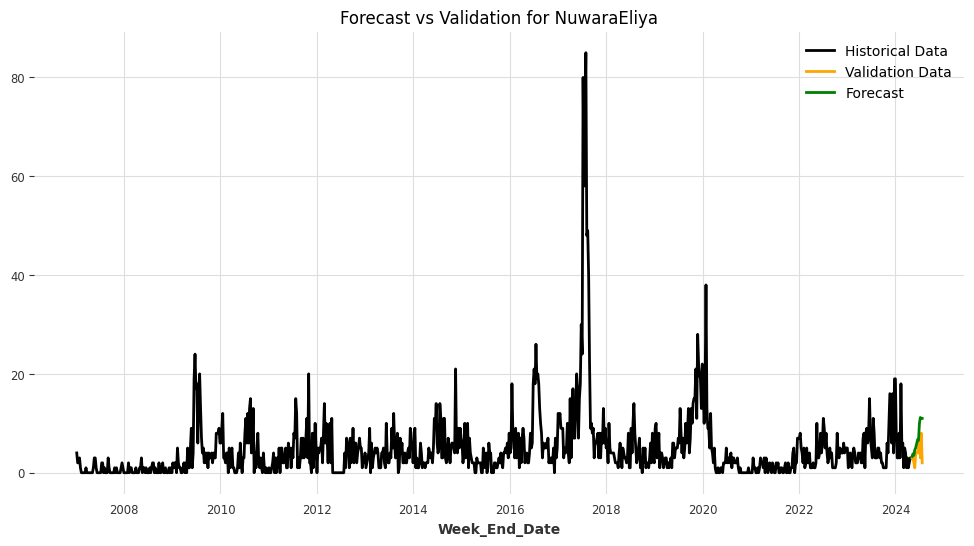

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpokfq9thx/qpe_lri9.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpokfq9thx/p0m0rrjg.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=34724', 'data', 'file=/tmp/tmpokfq9thx/qpe_lri9.json', 'init=/tmp/tmpokfq9thx/p0m0rrjg.json', 'output', 'file=/tmp/tmpokfq9thx/prophet_modeleeypcp_e/prophet_model-20240906030345.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
03:03:45 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
03:03:45 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Model saved for /content/drive/MyDrive/Models/NuwaraEliya: /content/drive/MyDrive/Models/NuwaraEliya_Prophet.pkl


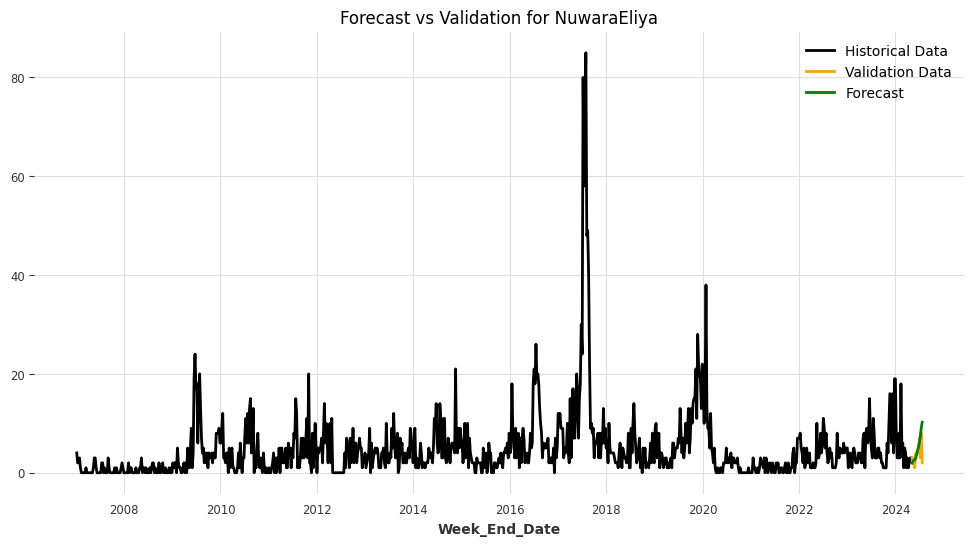

Model saved for /content/drive/MyDrive/Models/NuwaraEliya: /content/drive/MyDrive/Models/NuwaraEliya_FFT.pkl


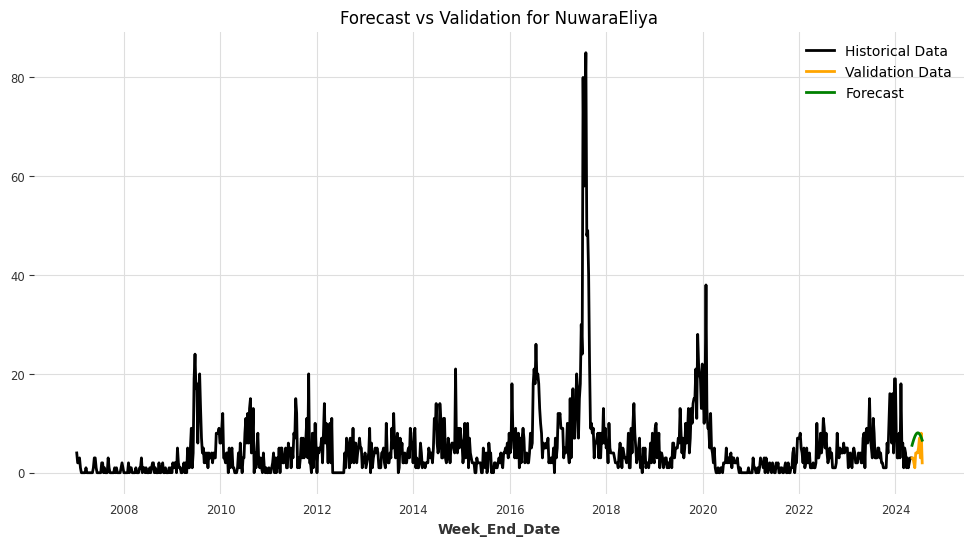

Model saved for /content/drive/MyDrive/Models/NuwaraEliya: /content/drive/MyDrive/Models/NuwaraEliya_KalmanForecaster.pkl


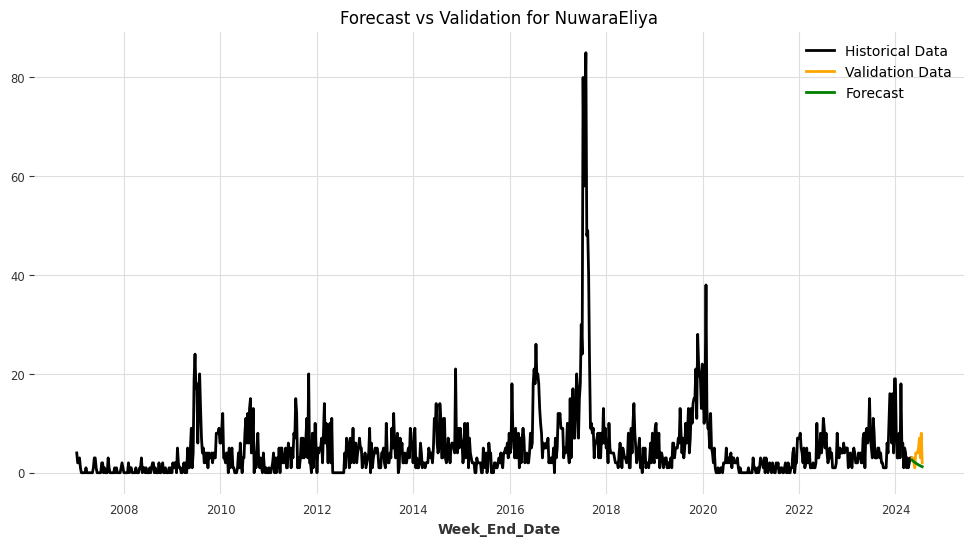

<ipython-input-41-47d63baebb5c>:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Training length: 904
Validation length: 12
Model saved for /content/drive/MyDrive/Models/Polonnaruwa: /content/drive/MyDrive/Models/Polonnaruwa_ARIMA.pkl


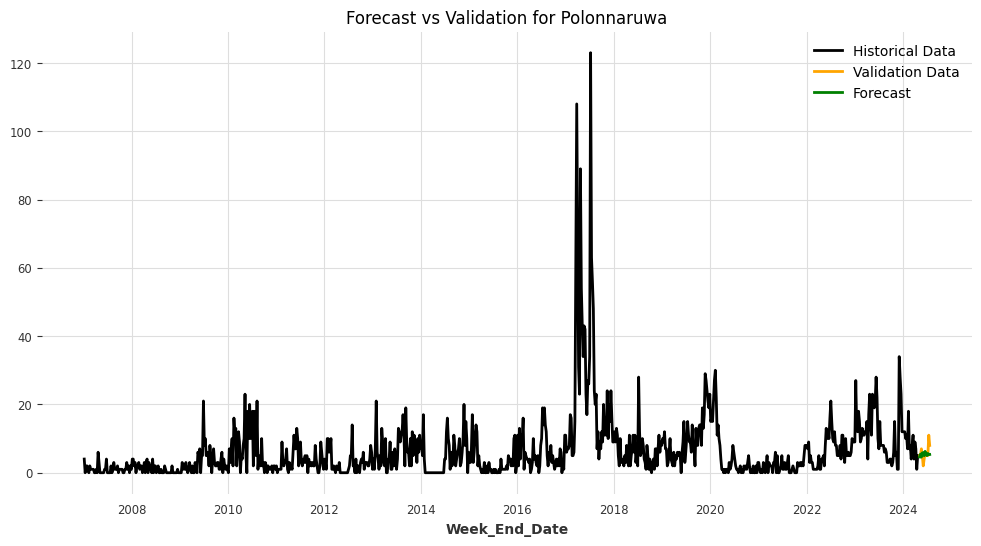

Model saved for /content/drive/MyDrive/Models/Polonnaruwa: /content/drive/MyDrive/Models/Polonnaruwa_AutoARIMA.pkl


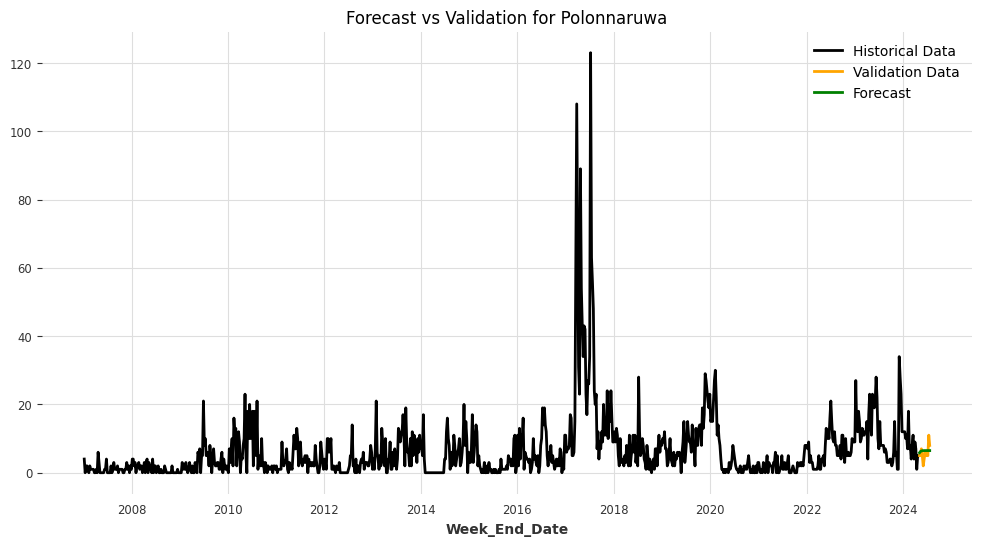

Model saved for /content/drive/MyDrive/Models/Polonnaruwa: /content/drive/MyDrive/Models/Polonnaruwa_ExponentialSmoothing.pkl


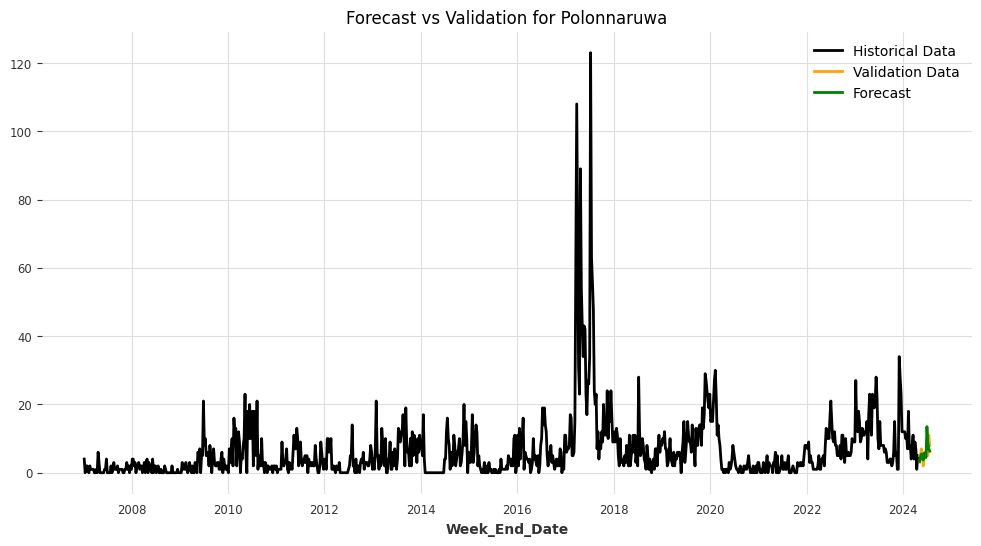

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpokfq9thx/kscpx0ax.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpokfq9thx/nlqut_v7.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=62414', 'data', 'file=/tmp/tmpokfq9thx/kscpx0ax.json', 'init=/tmp/tmpokfq9thx/nlqut_v7.json', 'output', 'file=/tmp/tmpokfq9thx/prophet_model7g8q5wko/prophet_model-20240906030406.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
03:04:06 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
03:04:07 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Model saved for /content/drive/MyDrive/Models/Polonnaruwa: /content/drive/MyDrive/Models/Polonnaruwa_Prophet.pkl


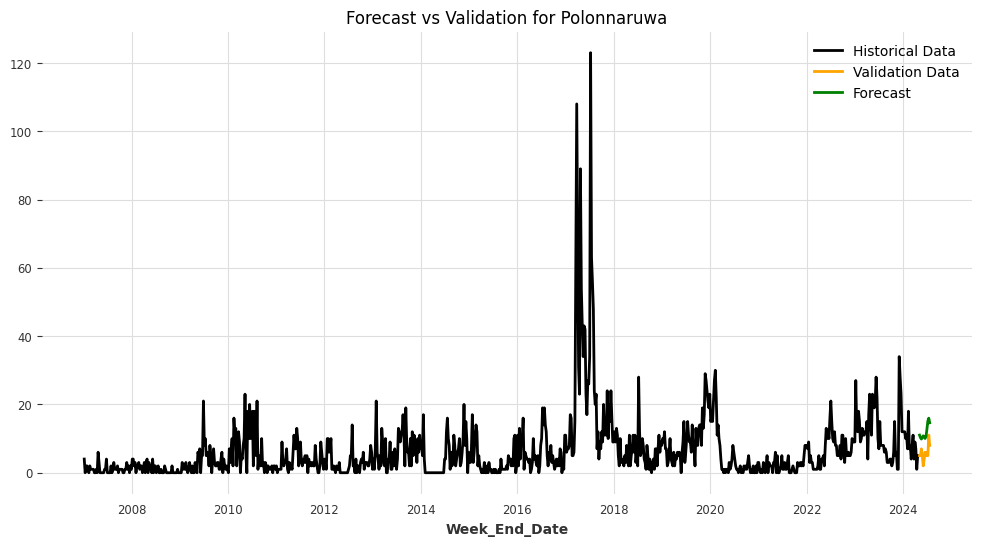

Model saved for /content/drive/MyDrive/Models/Polonnaruwa: /content/drive/MyDrive/Models/Polonnaruwa_FFT.pkl


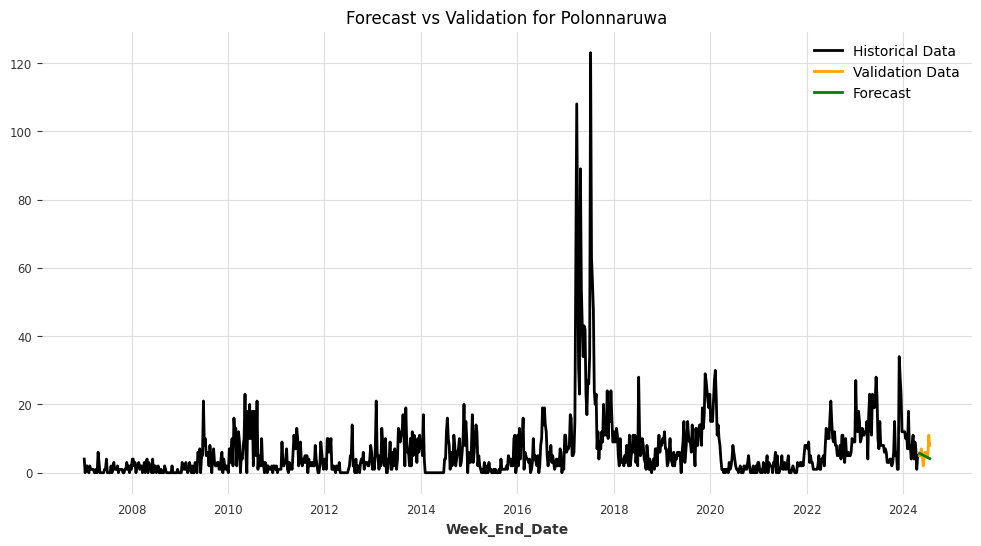

Model saved for /content/drive/MyDrive/Models/Polonnaruwa: /content/drive/MyDrive/Models/Polonnaruwa_KalmanForecaster.pkl


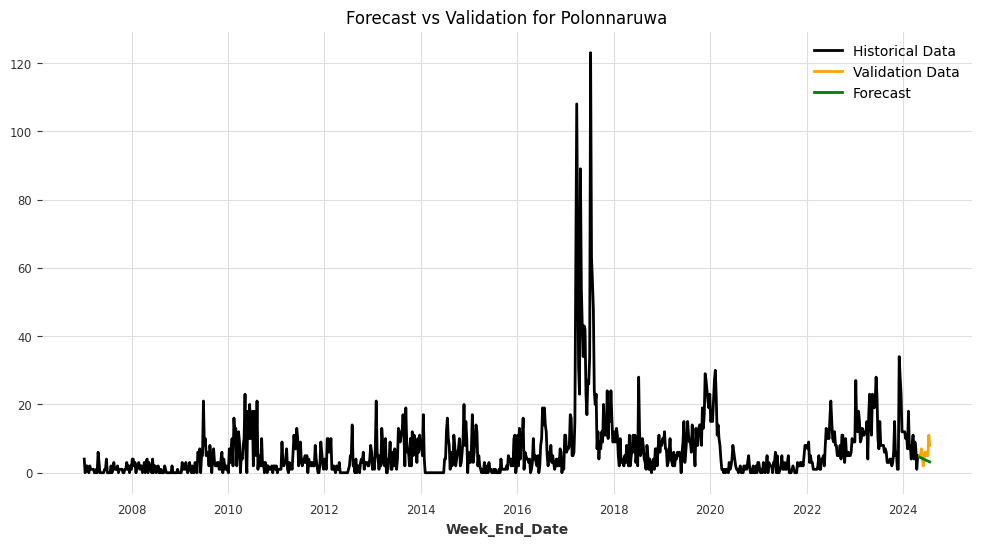

<ipython-input-41-47d63baebb5c>:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Training length: 904
Validation length: 12
Model saved for /content/drive/MyDrive/Models/Puttalam: /content/drive/MyDrive/Models/Puttalam_ARIMA.pkl


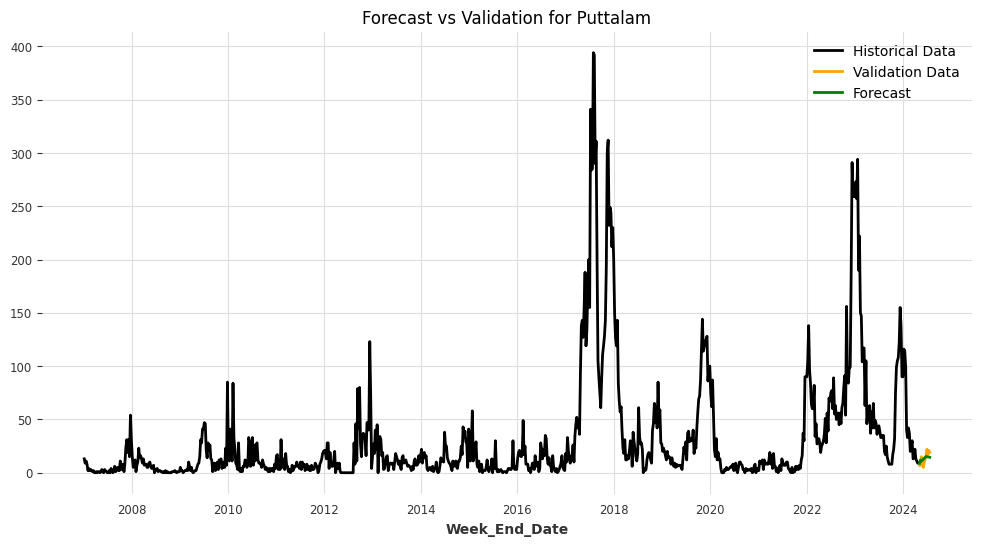

Model saved for /content/drive/MyDrive/Models/Puttalam: /content/drive/MyDrive/Models/Puttalam_AutoARIMA.pkl


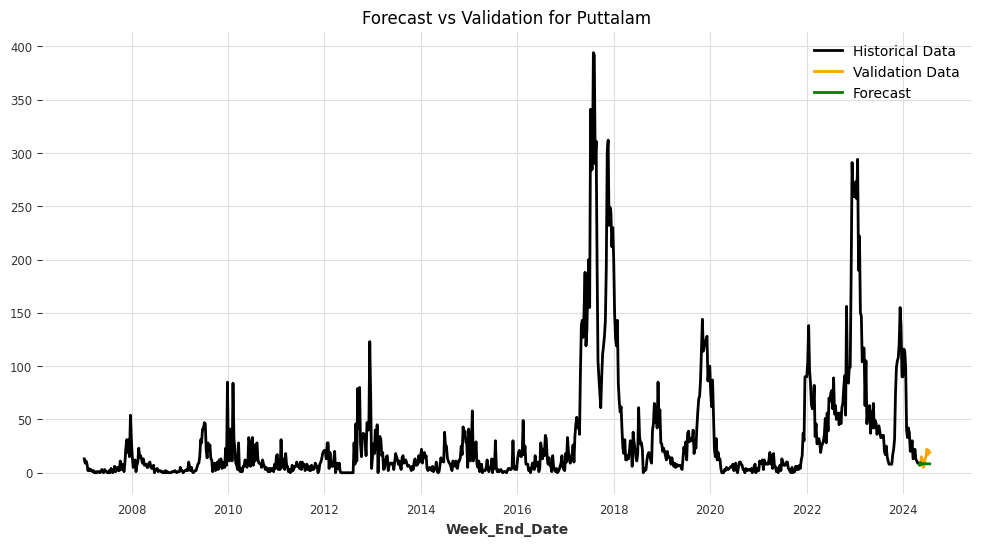

Model saved for /content/drive/MyDrive/Models/Puttalam: /content/drive/MyDrive/Models/Puttalam_ExponentialSmoothing.pkl


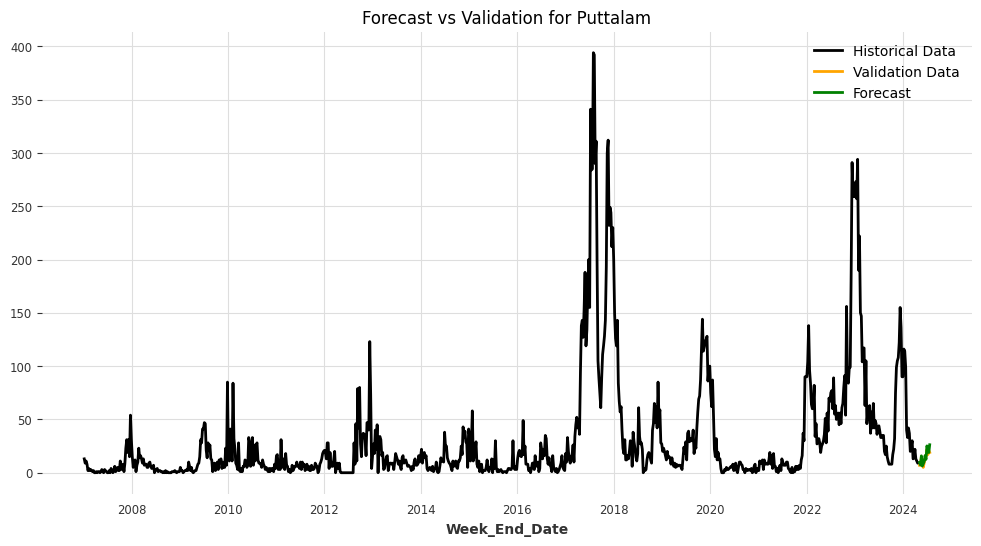

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpokfq9thx/kqx3opu9.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpokfq9thx/jpbzj8ub.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=29730', 'data', 'file=/tmp/tmpokfq9thx/kqx3opu9.json', 'init=/tmp/tmpokfq9thx/jpbzj8ub.json', 'output', 'file=/tmp/tmpokfq9thx/prophet_modelp0o329pl/prophet_model-20240906030502.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
03:05:02 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
03:05:02 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Model saved for /content/drive/MyDrive/Models/Puttalam: /content/drive/MyDrive/Models/Puttalam_Prophet.pkl


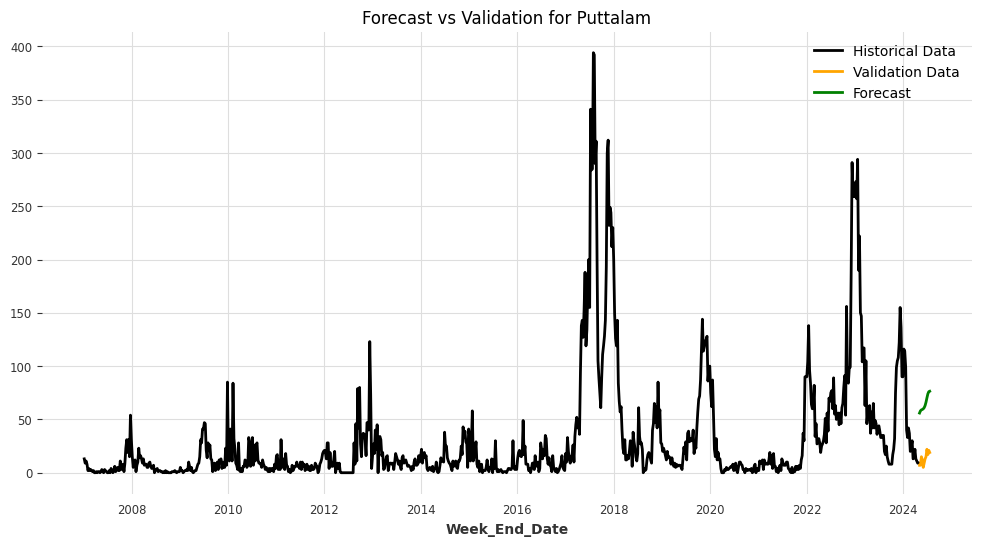

Model saved for /content/drive/MyDrive/Models/Puttalam: /content/drive/MyDrive/Models/Puttalam_FFT.pkl


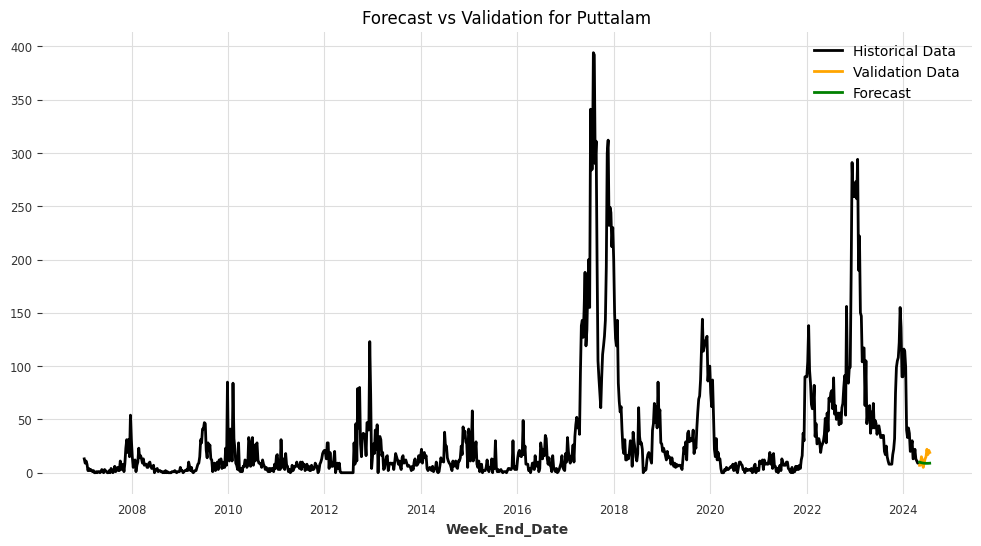

Model saved for /content/drive/MyDrive/Models/Puttalam: /content/drive/MyDrive/Models/Puttalam_KalmanForecaster.pkl


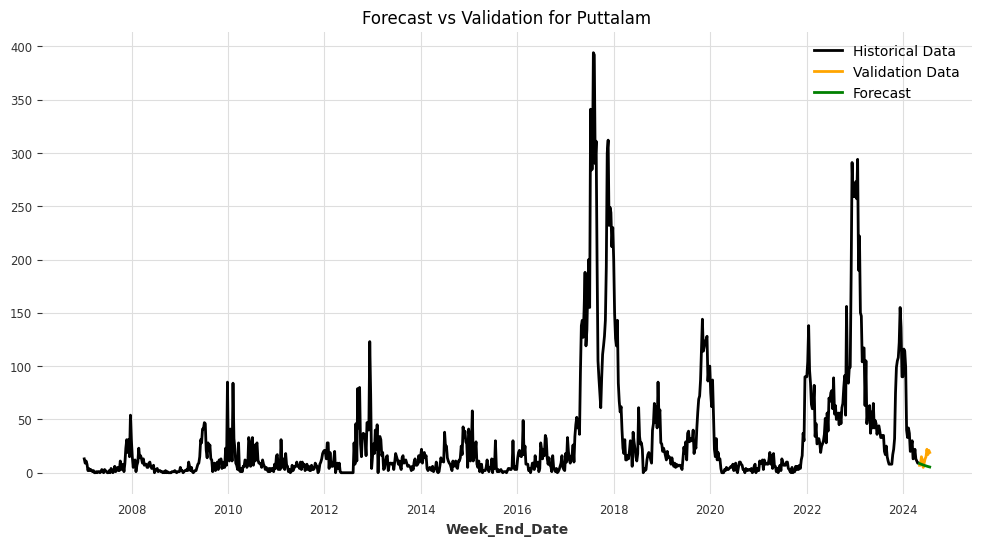

<ipython-input-41-47d63baebb5c>:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Training length: 904
Validation length: 12
Model saved for /content/drive/MyDrive/Models/Ratnapura: /content/drive/MyDrive/Models/Ratnapura_ARIMA.pkl


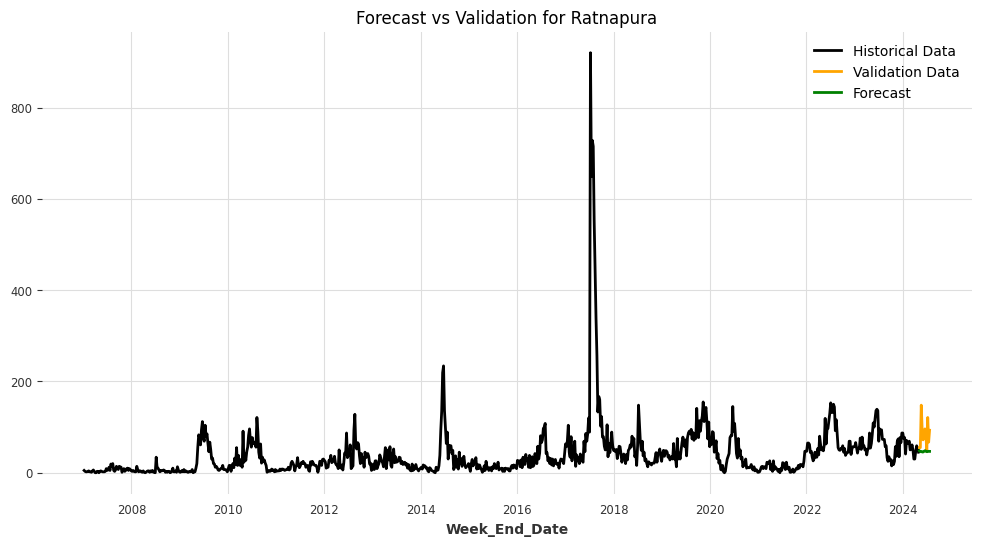

Model saved for /content/drive/MyDrive/Models/Ratnapura: /content/drive/MyDrive/Models/Ratnapura_AutoARIMA.pkl


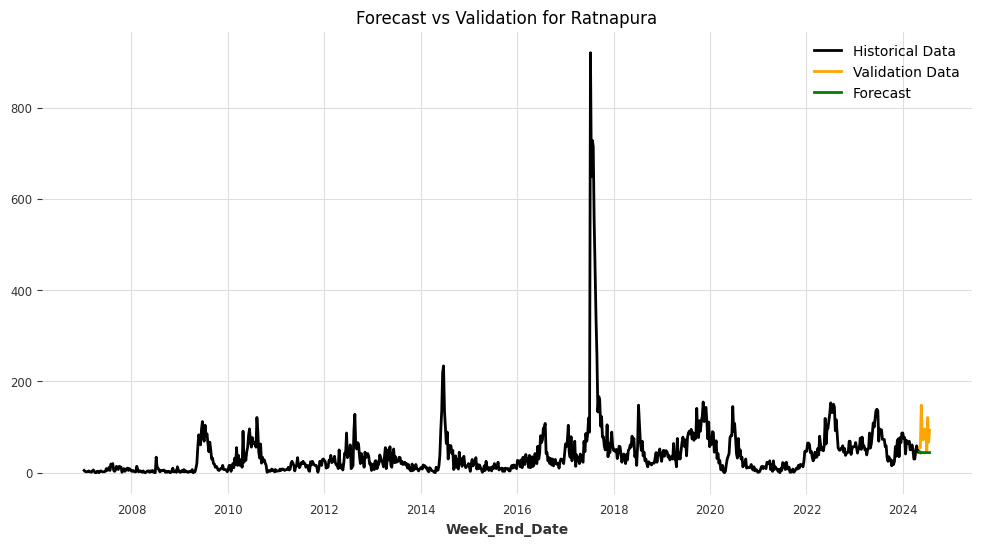

Model saved for /content/drive/MyDrive/Models/Ratnapura: /content/drive/MyDrive/Models/Ratnapura_ExponentialSmoothing.pkl


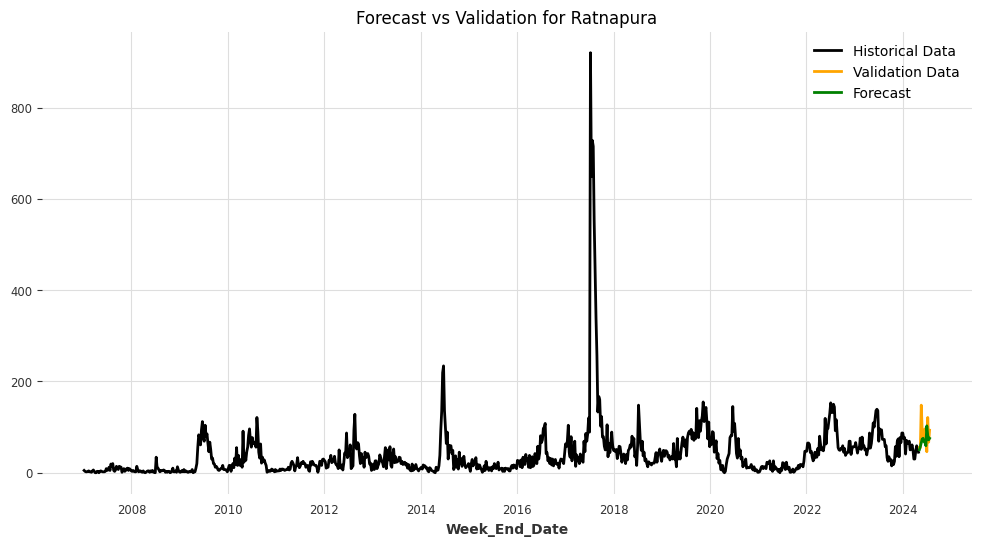

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpokfq9thx/5iw7vlx6.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpokfq9thx/yhtej7ez.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=47521', 'data', 'file=/tmp/tmpokfq9thx/5iw7vlx6.json', 'init=/tmp/tmpokfq9thx/yhtej7ez.json', 'output', 'file=/tmp/tmpokfq9thx/prophet_model4vark9e9/prophet_model-20240906030534.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
03:05:34 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
03:05:34 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Model saved for /content/drive/MyDrive/Models/Ratnapura: /content/drive/MyDrive/Models/Ratnapura_Prophet.pkl


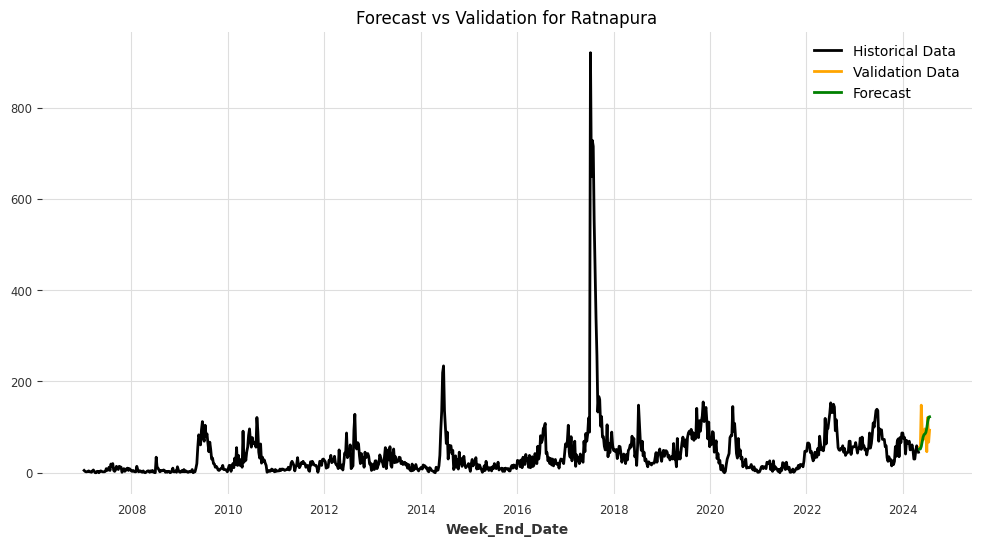

Model saved for /content/drive/MyDrive/Models/Ratnapura: /content/drive/MyDrive/Models/Ratnapura_FFT.pkl


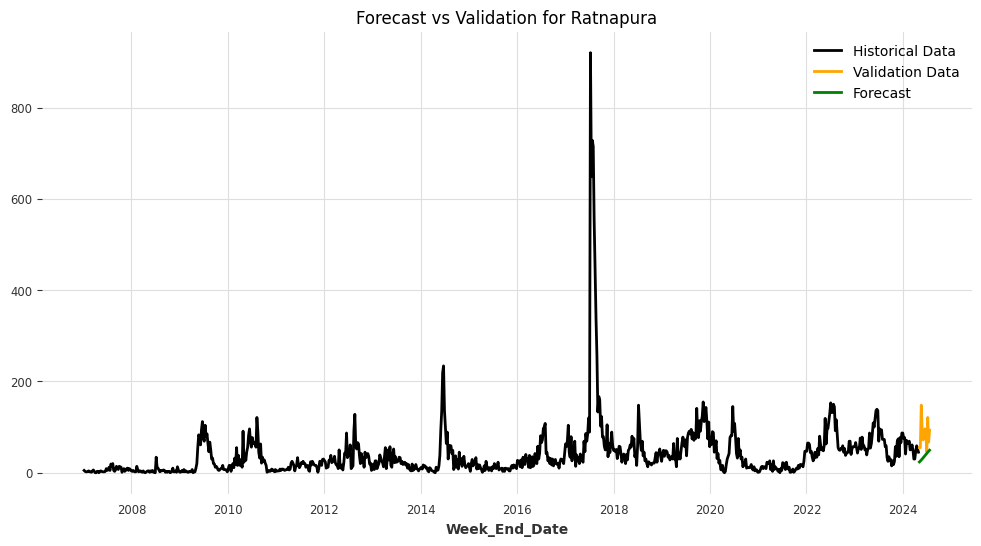

Model saved for /content/drive/MyDrive/Models/Ratnapura: /content/drive/MyDrive/Models/Ratnapura_KalmanForecaster.pkl


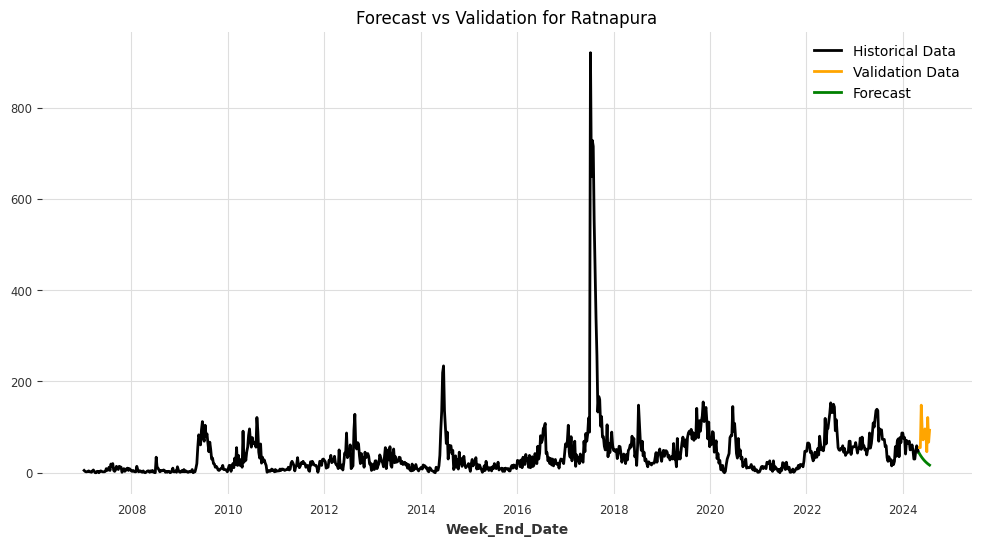

<ipython-input-41-47d63baebb5c>:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Training length: 904
Validation length: 12
Model saved for /content/drive/MyDrive/Models/Trincomalee: /content/drive/MyDrive/Models/Trincomalee_ARIMA.pkl


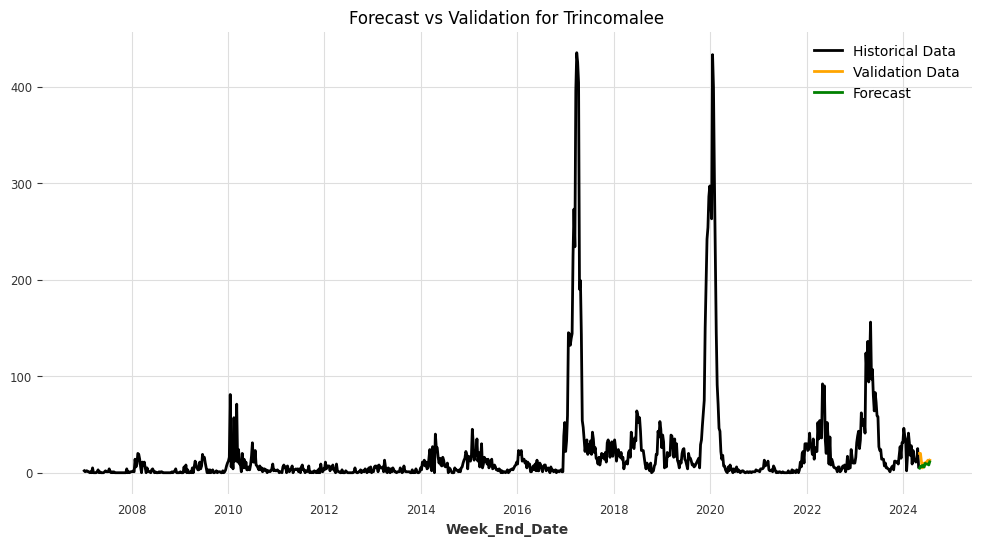

Model saved for /content/drive/MyDrive/Models/Trincomalee: /content/drive/MyDrive/Models/Trincomalee_AutoARIMA.pkl


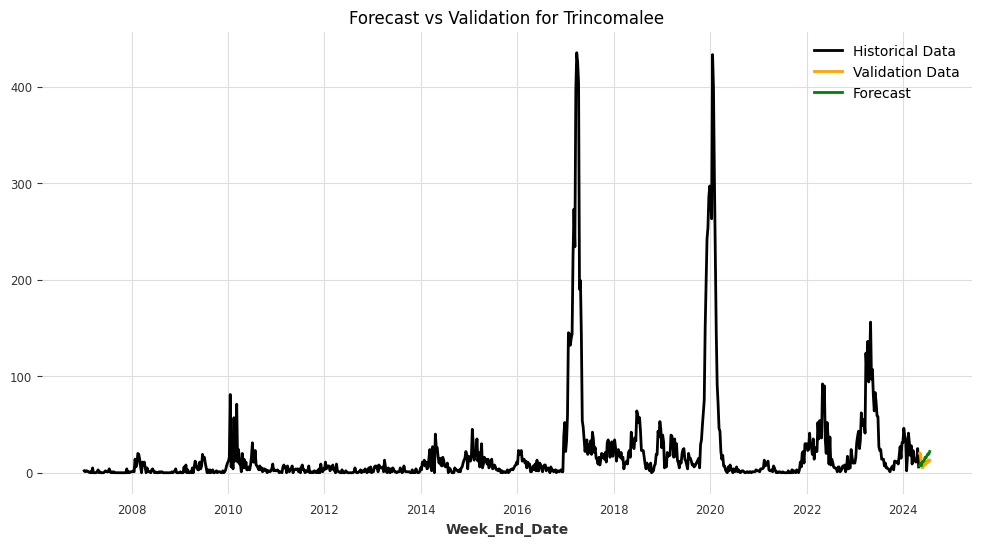

Model saved for /content/drive/MyDrive/Models/Trincomalee: /content/drive/MyDrive/Models/Trincomalee_ExponentialSmoothing.pkl


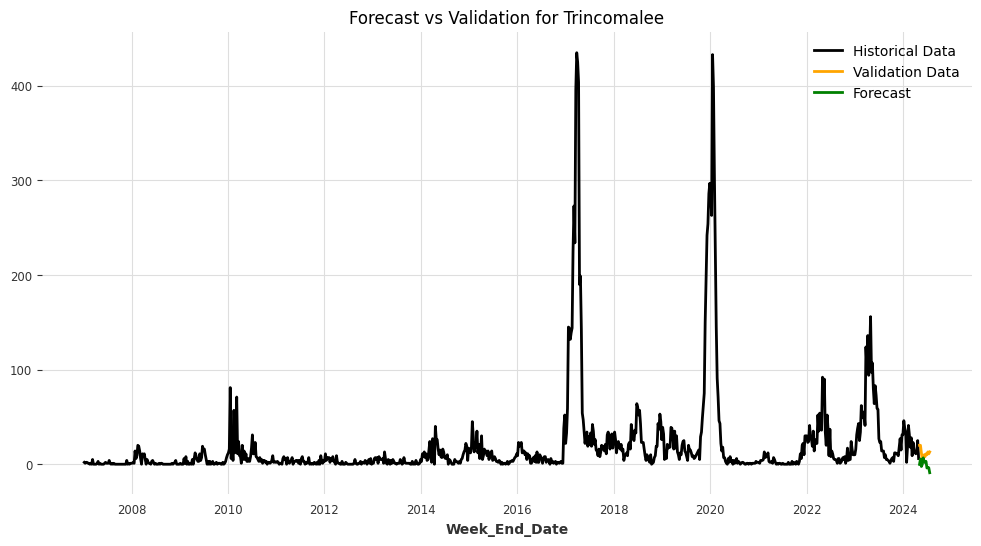

/usr/local/lib/python3.10/dist-packages/darts/metrics/metrics.py:1647: RuntimeWarning:

invalid value encountered in log

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpokfq9thx/ws6a91z4.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpokfq9thx/bdyes_8y.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=94957', 'data', 'file=/tmp/tmpokfq9thx/ws6a91z4.json', 'init=/tmp/tmpokfq9thx/bdyes_8y.json', 'output', 'file=/tmp/tmpokfq9thx/prophet_modelt39e95ic/prophet_model-20240906030711.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
03:07:11 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
03:07:12 - cmds

Model saved for /content/drive/MyDrive/Models/Trincomalee: /content/drive/MyDrive/Models/Trincomalee_Prophet.pkl


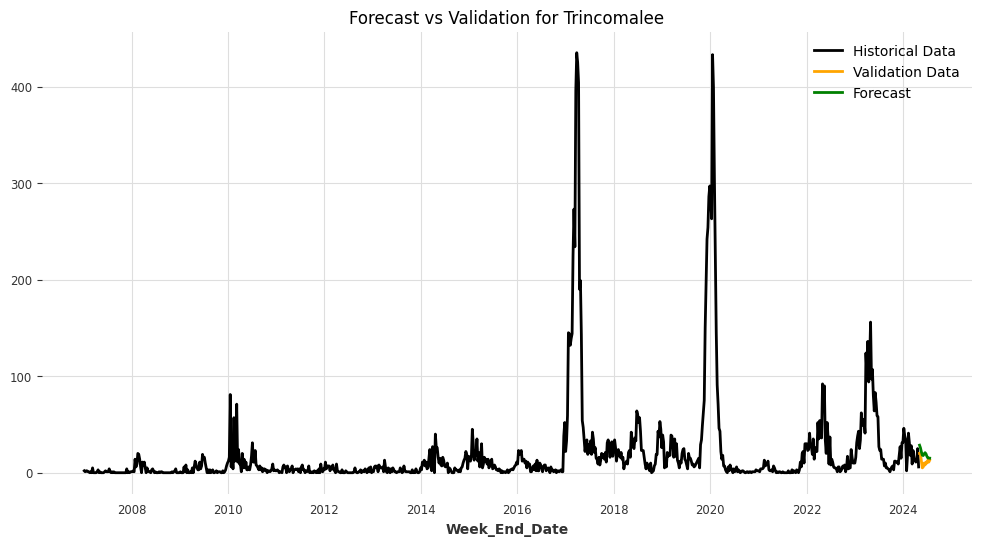

Model saved for /content/drive/MyDrive/Models/Trincomalee: /content/drive/MyDrive/Models/Trincomalee_FFT.pkl


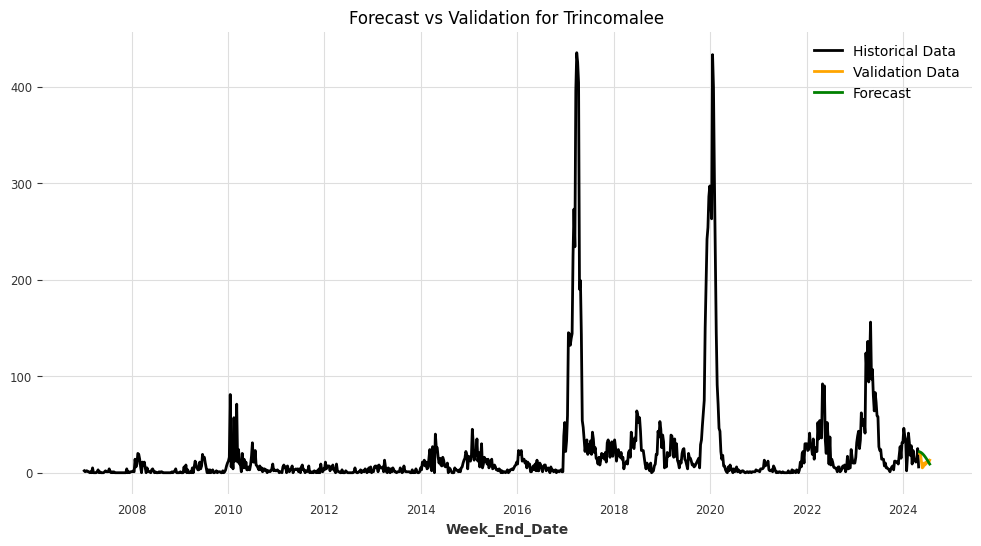

Model saved for /content/drive/MyDrive/Models/Trincomalee: /content/drive/MyDrive/Models/Trincomalee_KalmanForecaster.pkl


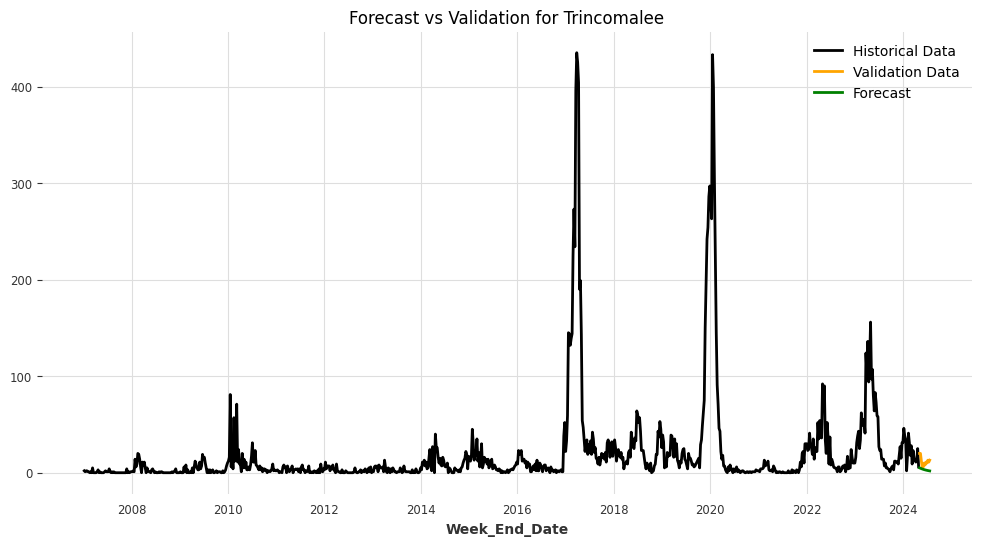

<ipython-input-41-47d63baebb5c>:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Training length: 904
Validation length: 12
Model saved for /content/drive/MyDrive/Models/Vavuniya: /content/drive/MyDrive/Models/Vavuniya_ARIMA.pkl


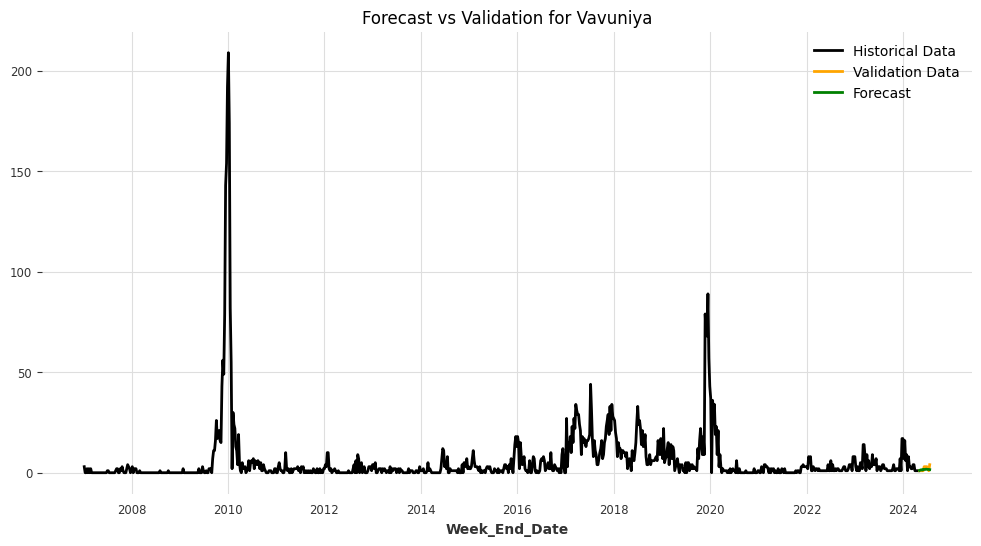

Model saved for /content/drive/MyDrive/Models/Vavuniya: /content/drive/MyDrive/Models/Vavuniya_AutoARIMA.pkl


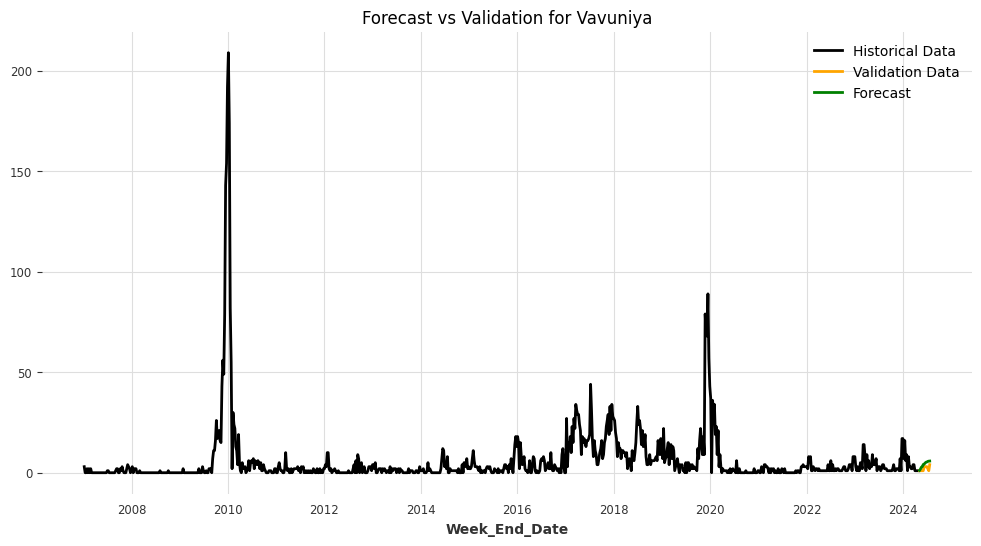

Model saved for /content/drive/MyDrive/Models/Vavuniya: /content/drive/MyDrive/Models/Vavuniya_ExponentialSmoothing.pkl


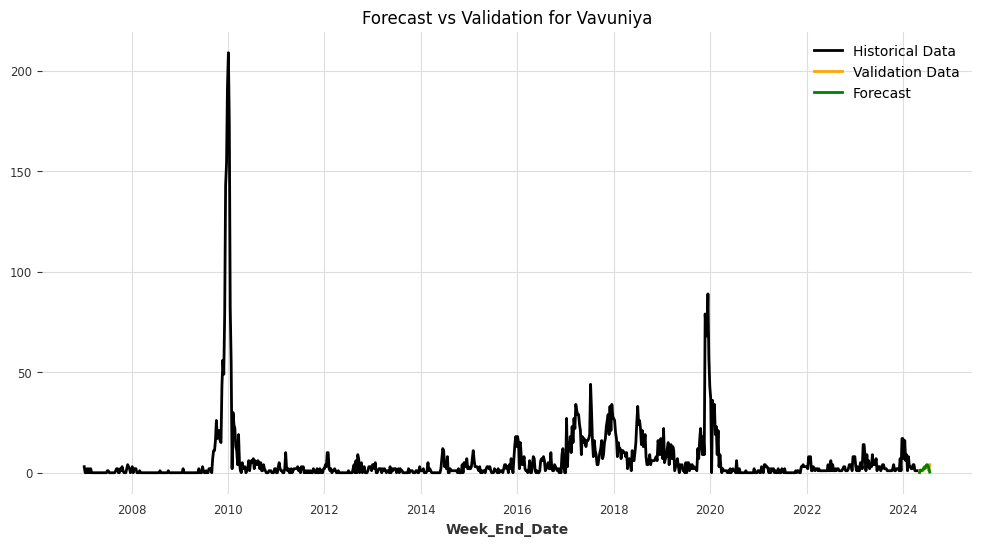

INFO:prophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpokfq9thx/2nhjhxun.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpokfq9thx/s83h9nvn.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=81819', 'data', 'file=/tmp/tmpokfq9thx/2nhjhxun.json', 'init=/tmp/tmpokfq9thx/s83h9nvn.json', 'output', 'file=/tmp/tmpokfq9thx/prophet_modelk0ac9zay/prophet_model-20240906030753.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
03:07:53 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
03:07:53 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


Model saved for /content/drive/MyDrive/Models/Vavuniya: /content/drive/MyDrive/Models/Vavuniya_Prophet.pkl


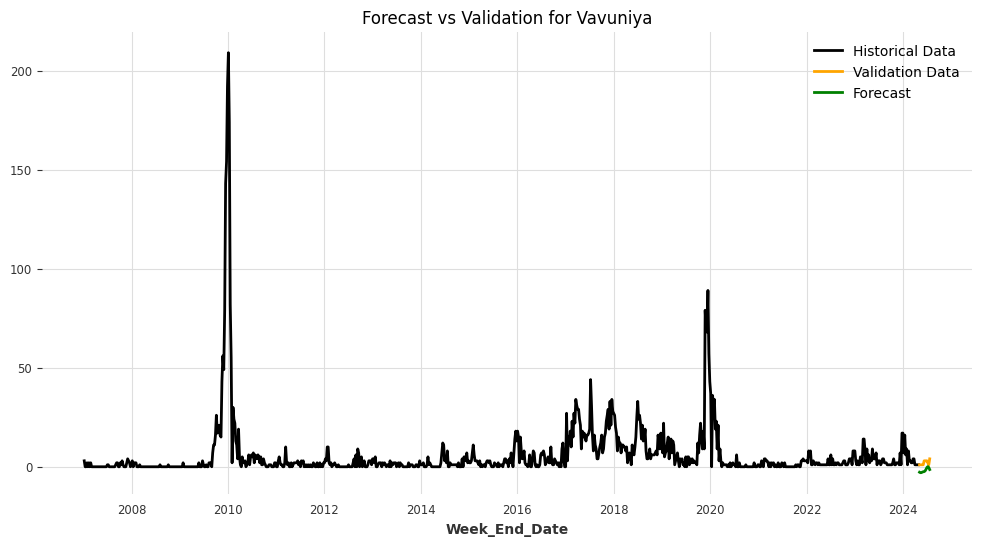

/usr/local/lib/python3.10/dist-packages/darts/metrics/metrics.py:1647: RuntimeWarning:

invalid value encountered in log



Model saved for /content/drive/MyDrive/Models/Vavuniya: /content/drive/MyDrive/Models/Vavuniya_FFT.pkl


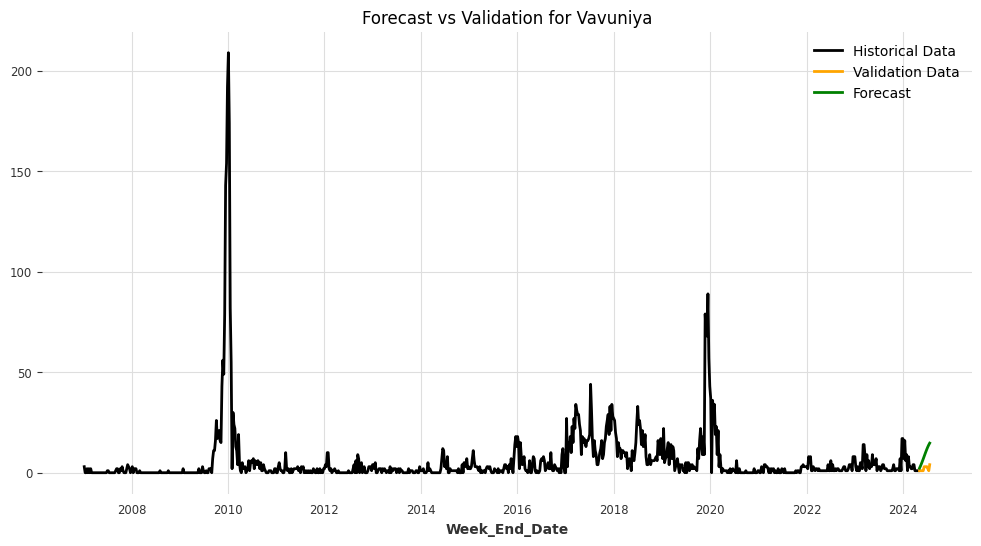

Model saved for /content/drive/MyDrive/Models/Vavuniya: /content/drive/MyDrive/Models/Vavuniya_KalmanForecaster.pkl


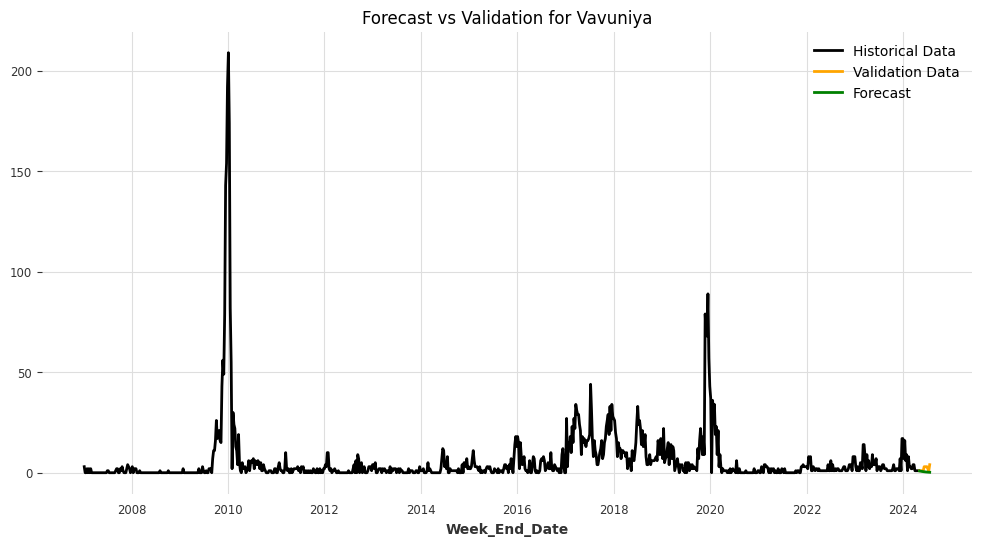

In [42]:
results = main(df, models)

## 6. Result

In [43]:
# Initialize a list to store metrics
metrics_list = []
districts = df['District'].unique()

# Iterate over results and extract metrics
for district_index, district_results in enumerate(results):
    for model_index, (forecast, metrics) in enumerate(district_results):
        metrics_list.append({
            'District': f'{districts[district_index]}',
            'Model': models[model_index],
            'RMSE': metrics['RMSE'],
            'MAE': metrics['MAE'],
            'SMAPE': metrics['SMAPE'],
            'R2': metrics['R2'],
            'RMSLE': metrics['RMSLE']
        })

# Create a DataFrame from the metrics list
df_metrics = pd.DataFrame(metrics_list)
df_metrics.set_index(['District', 'Model'], inplace=True)

In [44]:
from IPython.display import display
from IPython.display import HTML

def display_district_metrics(df_metrics):
    districts = df_metrics.index.get_level_values('District').unique()

    for district in districts:
        print(f"Metrics for {district}:")
        district_df = df_metrics.loc[district]
        styled_df = district_df.style \
         .highlight_min(color="lightgreen", axis=0)

        display(styled_df)

# Example usage
display_district_metrics(df_metrics)


Metrics for Ampara:


,RMSE,MAE,SMAPE,R2,RMSLE
Model,,,,,
ARIMA(),8.410241,7.251999,56.188788,-1.521146,0.679704
AutoARIMA(),5.221582,4.620095,42.212422,0.028181,0.451311
ExponentialSmoothing(),10.010950,8.062137,60.379927,-2.572167,0.727783
Prophet(),28.179742,26.063120,107.433479,-27.304479,1.318792
FFT(),11.293416,9.888162,144.454394,-3.546024,1.613368
KalmanForecaster(),7.778200,6.352604,61.733843,-1.156450,0.694465


Metrics for Anuradhapura:


,RMSE,MAE,SMAPE,R2,RMSLE
Model,,,,,
ARIMA(),4.418443,4.158334,70.916593,-0.253348,0.731870
AutoARIMA(),3.969005,3.499402,64.305591,-0.011339,0.625250
ExponentialSmoothing(),6.476156,4.944970,67.307524,-1.692575,0.875291
Prophet(),6.774671,5.869424,76.601794,-1.946521,0.930576
FFT(),12.609781,11.859464,107.707303,-9.208180,1.327548
KalmanForecaster(),5.151337,3.831822,72.459727,-0.703622,0.777628


Metrics for Badulla:


,RMSE,MAE,SMAPE,R2,RMSLE
Model,,,,,
ARIMA(),7.176844,6.173054,61.811626,-1.264739,0.738376
AutoARIMA(),6.709692,5.649991,58.428484,-0.979504,0.710269
ExponentialSmoothing(),14.055732,12.328238,85.307886,-7.686765,0.933202
Prophet(),24.221977,22.289986,113.685959,-24.797068,1.333063
FFT(),7.244970,5.959899,59.365984,-1.307940,0.746749
KalmanForecaster(),6.288192,5.577776,64.539835,-0.738612,0.668284


Metrics for Batticaloa:


,RMSE,MAE,SMAPE,R2,RMSLE
Model,,,,,
ARIMA(),7.707243,6.611896,40.636914,-1.677255,0.460208
AutoARIMA(),14.756297,14.173522,157.273777,-8.814008,2.181084
ExponentialSmoothing(),21.468996,21.276366,188.331725,-19.773760,2.624128
Prophet(),22.786437,21.197698,78.105252,-22.401542,0.838501
FFT(),17.044307,14.240121,124.920041,-12.093337,0.706244
KalmanForecaster(),9.873655,9.074224,74.128954,-3.393874,0.752429


Metrics for Colombo:


,RMSE,MAE,SMAPE,R2,RMSLE
Model,,,,,
ARIMA(),90.876192,70.960969,34.887120,-0.122395,0.420364
AutoARIMA(),124.680985,101.449039,53.971450,-1.112740,0.643926
ExponentialSmoothing(),102.278484,71.707573,34.880828,-0.421720,0.494520
Prophet(),203.686826,202.698216,70.201507,-4.638602,0.791050
FFT(),106.291988,79.268365,39.817549,-0.535489,0.524544
KalmanForecaster(),155.206493,127.980855,74.874925,-2.273899,0.948234


Metrics for Galle:


,RMSE,MAE,SMAPE,R2,RMSLE
Model,,,,,
ARIMA(),9.657176,7.744605,26.155851,-0.021106,0.312471
AutoARIMA(),9.732242,7.323419,24.213049,-0.037042,0.301702
ExponentialSmoothing(),14.713802,12.209765,36.464389,-1.370394,0.447512
Prophet(),47.095463,46.412908,89.517833,-23.284481,0.986364
FFT(),12.305968,10.697040,34.464099,-0.658068,0.408025
KalmanForecaster(),14.051772,11.343677,40.846709,-1.161886,0.476080


Metrics for Gampaha:


,RMSE,MAE,SMAPE,R2,RMSLE
Model,,,,,
ARIMA(),56.834671,45.034906,49.487267,-1.292952,0.604584
AutoARIMA(),71.087290,60.265063,76.226253,-2.587171,0.903404
ExponentialSmoothing(),55.738478,42.447071,46.376093,-1.205355,0.598400
Prophet(),226.279778,223.716518,107.699932,-35.346258,1.233487
FFT(),58.810442,46.841812,52.182593,-1.455145,0.642927
KalmanForecaster(),81.892343,69.633865,95.020689,-3.760525,1.220241


Metrics for Hambantota:


,RMSE,MAE,SMAPE,R2,RMSLE
Model,,,,,
ARIMA(),10.125548,9.318808,103.911651,-1.967011,1.388179
AutoARIMA(),8.800964,8.255500,100.762571,-1.241520,1.297217
ExponentialSmoothing(),12.210693,11.074969,106.986441,-3.314821,1.451764
Prophet(),18.089990,17.579497,128.796127,-8.470192,1.721917
FFT(),7.461502,6.924853,94.714487,-0.611145,1.184888
KalmanForecaster(),7.842491,7.217840,96.363181,-0.779878,1.208503


Metrics for Jaffna:


,RMSE,MAE,SMAPE,R2,RMSLE
Model,,,,,
ARIMA(),76.240690,73.942328,140.501781,-138.993406,1.854165
AutoARIMA(),22.430039,21.352860,86.621978,-11.116969,1.029424
ExponentialSmoothing(),13.846834,10.801630,52.499388,-3.617798,0.754964
Prophet(),56.379367,55.986346,131.324913,-75.555135,1.639898
FFT(),22.988890,21.782631,140.466234,-11.728287,1.242634
KalmanForecaster(),9.840412,7.258099,41.509510,-1.332171,0.618191


Metrics for Kalutara:


,RMSE,MAE,SMAPE,R2,RMSLE
Model,,,,,
ARIMA(),14.989368,11.269993,22.873036,0.159612,0.276654
AutoARIMA(),19.077412,13.276896,27.186026,-0.361294,0.362903
ExponentialSmoothing(),20.029640,15.420809,32.791749,-0.500581,0.400479
Prophet(),61.823380,59.250340,79.306422,-13.296131,0.874402
FFT(),16.836252,14.318595,29.827686,-0.060239,0.334952
KalmanForecaster(),27.270541,20.059950,47.502190,-1.781638,0.634736


Metrics for Kandy:


,RMSE,MAE,SMAPE,R2,RMSLE
Model,,,,,
ARIMA(),22.433025,17.057615,20.781707,-0.570616,0.258896
AutoARIMA(),24.534774,18.692309,23.305391,-0.878704,0.289518
ExponentialSmoothing(),22.660069,15.974139,19.321581,-0.602569,0.265282
Prophet(),103.052320,100.115350,75.717102,-32.144377,0.802914
FFT(),38.063252,34.560456,51.183031,-3.521745,0.544716
KalmanForecaster(),39.082394,30.195280,42.978139,-3.767126,0.561185


Metrics for Kegalle:


,RMSE,MAE,SMAPE,R2,RMSLE
Model,,,,,
ARIMA(),13.503813,12.658823,35.096587,-0.335172,0.374250
AutoARIMA(),12.230125,9.610590,27.058160,-0.095182,0.323979
ExponentialSmoothing(),22.157353,19.386159,46.432441,-2.594679,0.548086
Prophet(),62.355635,57.268346,88.889176,-27.469234,1.074273
FFT(),19.742009,16.481072,54.546018,-1.853692,0.618969
KalmanForecaster(),15.267404,13.019876,40.634568,-0.706690,0.439852


Metrics for Kilinochchi:


,RMSE,MAE,SMAPE,R2,RMSLE
Model,,,,,
ARIMA(),1.673890,1.395196,26.954107,-3.075504,0.301194
AutoARIMA(),1.031724,0.796942,17.916938,-0.548298,0.217176
ExponentialSmoothing(),1.223511,0.777713,16.841836,-1.177426,0.246990
Prophet(),1.955057,1.907807,49.266802,-4.559633,0.411919
FFT(),1.506780,1.240656,30.980557,-2.302382,0.310022
KalmanForecaster(),1.841629,1.668232,42.377057,-3.933230,0.385184


Metrics for Kurunegala:


,RMSE,MAE,SMAPE,R2,RMSLE
Model,,,,,
ARIMA(),12.451502,9.029607,26.852077,-0.668716,0.334783
AutoARIMA(),19.924841,17.510422,64.283597,-3.272957,0.693598
ExponentialSmoothing(),17.573468,14.340953,36.956514,-2.323945,0.445123
Prophet(),49.026086,45.464926,79.176608,-24.869812,0.887527
FFT(),10.073092,7.859451,22.478460,-0.092105,0.255707
KalmanForecaster(),22.712339,20.406095,80.647027,-4.552168,0.886129


Metrics for Mannar:


,RMSE,MAE,SMAPE,R2,RMSLE
Model,,,,,
ARIMA(),3.506740,2.746503,53.939285,-0.110219,0.661470
AutoARIMA(),3.387893,2.969284,57.723917,-0.036242,0.637332
ExponentialSmoothing(),4.688219,4.002236,65.659170,-0.984347,0.769453
Prophet(),3.974464,3.643735,70.937746,-0.426129,0.634379
FFT(),5.255072,4.211048,99.119008,-1.493212,0.722078
KalmanForecaster(),3.377857,2.904221,58.081356,-0.030111,0.559294


Metrics for Matale:


,RMSE,MAE,SMAPE,R2,RMSLE
Model,,,,,
ARIMA(),7.384157,5.714999,52.868008,-0.439097,0.575120
AutoARIMA(),8.400657,6.291298,59.186396,-0.862579,0.692267
ExponentialSmoothing(),10.420039,8.935982,60.789006,-1.865674,0.749643
Prophet(),15.504436,14.422199,80.709067,-5.344539,0.922426
FFT(),9.192572,7.876091,59.862694,-1.230294,0.748298
KalmanForecaster(),10.206669,7.625291,78.856916,-1.749516,1.031027


Metrics for Matara:


,RMSE,MAE,SMAPE,R2,RMSLE
Model,,,,,
ARIMA(),10.064076,8.475489,66.028420,-0.519284,0.753980
AutoARIMA(),10.630919,8.983007,71.484256,-0.695247,0.777077
ExponentialSmoothing(),14.294901,12.748954,76.437071,-2.065163,0.873338
Prophet(),18.077020,16.120125,81.751500,-3.901680,0.962424
FFT(),17.455801,15.388046,76.775605,-3.570575,1.088236
KalmanForecaster(),11.919219,9.674019,79.406730,-1.131017,0.923837


Metrics for Monaragala:


,RMSE,MAE,SMAPE,R2,RMSLE
Model,,,,,
ARIMA(),4.100933,3.498705,31.827773,-0.064034,0.392268
AutoARIMA(),3.649514,2.780975,25.947514,0.157325,0.345164
ExponentialSmoothing(),6.284627,4.992014,39.431642,-1.498902,0.456042
Prophet(),9.661050,8.317629,56.824806,-4.905258,0.638341
FFT(),4.783064,4.044125,35.540461,-0.447447,0.435404
KalmanForecaster(),5.602787,4.484851,44.758544,-0.986088,0.492433


Metrics for Mullaitivu:


,RMSE,MAE,SMAPE,R2,RMSLE
Model,,,,,
ARIMA(),1.481496,1.427798,78.135589,-14.802773,0.541392
AutoARIMA(),1.101896,1.036960,64.232624,-7.742064,0.430922
ExponentialSmoothing(),1.833911,1.726767,85.475962,-23.215251,0.621165
Prophet(),3.336599,3.320252,118.811379,-79.156813,0.947285
FFT(),1.258002,1.128668,66.069374,-10.394496,0.464784
KalmanForecaster(),0.573896,0.478502,36.205992,-1.371368,0.242439


Metrics for NuwaraEliya:


,RMSE,MAE,SMAPE,R2,RMSLE
Model,,,,,
ARIMA(),2.027107,1.446498,38.561522,-0.079780,0.418870
AutoARIMA(),1.918349,1.578162,41.492350,0.032976,0.432687
ExponentialSmoothing(),4.047285,3.053695,56.430034,-3.304370,0.646106
Prophet(),2.816865,1.715450,40.003868,-1.085039,0.490962
FFT(),3.850498,3.542543,70.841995,-2.895970,0.716123
KalmanForecaster(),2.971211,2.240297,70.196144,-1.319791,0.676319


Metrics for Polonnaruwa:


,RMSE,MAE,SMAPE,R2,RMSLE
Model,,,,,
ARIMA(),2.308556,1.636755,28.899889,-0.178860,0.347411
AutoARIMA(),2.203474,1.752644,30.360040,-0.073983,0.348800
ExponentialSmoothing(),2.915919,2.174846,34.296250,-0.880756,0.351831
Prophet(),6.362061,6.078008,72.098054,-7.953178,0.733378
FFT(),2.547394,1.770834,31.855670,-0.435403,0.375722
KalmanForecaster(),3.031225,2.232294,43.041310,-1.032441,0.465545


Metrics for Puttalam:


,RMSE,MAE,SMAPE,R2,RMSLE
Model,,,,,
ARIMA(),4.443417,3.722145,29.952110,0.332599,0.352528
AutoARIMA(),7.554082,6.247402,51.596747,-0.928929,0.560131
ExponentialSmoothing(),3.636934,3.074485,23.795570,0.552880,0.268740
Prophet(),51.557435,51.408991,133.581860,-88.853604,1.626079
FFT(),7.171868,6.001554,49.128726,-0.738671,0.523215
KalmanForecaster(),9.108043,7.470714,65.771985,-1.804161,0.749097


Metrics for Ratnapura:


,RMSE,MAE,SMAPE,R2,RMSLE
Model,,,,,
ARIMA(),47.288010,38.201751,51.930298,-1.875186,0.625339
AutoARIMA(),49.482746,40.695406,56.839391,-2.148266,0.674923
ExponentialSmoothing(),34.457554,25.469487,29.849858,-0.526626,0.394159
Prophet(),36.231887,24.239201,27.031843,-0.687896,0.408126
FFT(),56.413845,48.611594,75.803479,-3.091997,0.887822
KalmanForecaster(),64.594853,57.375203,97.465799,-4.364876,1.178197


Metrics for Trincomalee:


,RMSE,MAE,SMAPE,R2,RMSLE
Model,,,,,
ARIMA(),6.503155,4.617790,43.864118,-1.124140,0.557905
AutoARIMA(),7.709719,7.201957,56.657287,-1.985464,0.574479
ExponentialSmoothing(),13.405895,11.897586,155.752556,-8.026646,1.635324
Prophet(),8.722660,7.934762,54.510664,-2.821490,0.621536
FFT(),7.351400,5.736220,43.860427,-1.714406,0.572948
KalmanForecaster(),9.325674,8.346775,106.779907,-3.368127,1.123638


Metrics for Vavuniya:


,RMSE,MAE,SMAPE,R2,RMSLE
Model,,,,,
ARIMA(),1.096780,0.888439,44.960599,-0.031080,0.337848
AutoARIMA(),2.446723,2.138671,70.925727,-4.131244,0.626040
ExponentialSmoothing(),1.363053,1.002037,58.376101,-0.592497,0.495413
Prophet(),4.002453,3.819662,198.541393,-12.731113,1.373234
FFT(),7.513526,6.667630,121.824438,-47.388350,1.187739
KalmanForecaster(),1.943776,1.509136,103.227985,-2.238512,0.790627


## 7. Conclusion
To assess each models we need to see the error metrics of each model and then we have to decide which model outperformed.

Note: `We also need to do backtesting to make sure model is performing as intended`